<a href="https://colab.research.google.com/github/RoyPoulami/X-axis-parameter-generation-Neurokit/blob/main/Holter_Ver4_2_with_ectopic_without_square_wave_problem_POULAMI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Short Holter Version 3
Timestamp and lines-per-page custamisability retained

Cumulative Summary sheet replaced by Page-wise Summary which includes:


*   Heart Rate: Max, Min, Avg
*   Count of Pause
*   Count of Ectopic





# Client Access

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

!mkdir -p ~/.google/carditek-ecg
!cp /content/drive/MyDrive/Colaboratory/dot-google/client_secret.json ~/.google/carditek-ecg

%cd /content/drive/MyDrive/Colaboratory/dot-google/python-client-master/carditek/cloud/client
import buffer
import client


client = client.Client()


workspace ='/content/drive/My Drive/Colaboratory/Carditek TIFF Files/CAL_PULSE/'
background = '/content/drive/My Drive/Colaboratory/Carditek TIFF Files'
import sys; sys.path.append(workspace)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/.shortcut-targets-by-id/1q0cNRCNl-FiQ1sdRz_H4Qa7dtYD-81-B/Colaboratory/dot-google/python-client-master/carditek/cloud/client


# Functions & Packages

In [ ]:
!pip install pytz
!pip install condat-tv
!pip install python-docx

import condat_tv
from google.colab import files
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np
import math
import pandas as pd
import scipy as sp
from PIL import Image, ImageDraw, ImageFont
from scipy import signal
import collections
import statistics as st
from collections import deque
import time
import matplotlib.backends.backend_pdf
import datetime
from pytz import timezone
%matplotlib inline
import statistics
from scipy.stats import linregress
import itertools
from docx import Document
import os
from datetime import datetime, timedelta
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas

In [ ]:
## function extracts values from a dictionary given a specific index ##
def Value_axis(data_dict,value):
  data=list(data_dict.items())
  an_array=np.array(data,dtype=object)
  Values_1=an_array[value]
  Values_2=np.asarray(Values_1[1])
  return Values_2

############# FILETR FUNCTION
def ecg_filters_V5_smooth(lead_data):  #### According to IEC 60601-2-25 (BW, 50, 100 and LP) with smoothing
  # for x in  range(1,len(lead_data),1):
  #     if (lead_data[x] == 0):
  #      lead_data[x] = lead_data[x-1]

 ##### Baseline filter without ST Segment distortion
  b = signal.firwin(2377, cutoff = [0.67/500], window = "hamming", pass_zero=False); a = 1
  #b = signal.firwin(1735, cutoff = [0.67/500], window = "hamming", pass_zero=False); a = 1
 ##### Powerline noise and its harmonics removal
  Fs = 1000; F0 = 50; F1 = F0*2; r = 1 -((3.14*2)/1000); W0 = (2*3.14*F0)/Fs; W1 = (2*3.14*F1)/Fs
  d0 = 1; d1 = -2*(np.cos(W0)); d2 = 1; c2 = 1; c1 = -2*r*(np.cos(W0)); c0 = r * r; d = [d2, d1, d0]; c = [c2, c1, c0]
  f0 = 1; f1 = -2*(np.cos(W1)); f2 = 1; e2 = 1; e1 = -2*r*(np.cos(W1)); e0 = r * r; f = [f2, f1, f0]; e = [e2, e1, e0]
 ##### 150Hz Low pass filter
  h, g = signal.butter(1, [40/500] , btype='low', analog=False)
  j, i = signal.butter(1, [7/500] , btype='low', analog=False)

  filt_BW = signal.filtfilt(b, a, lead_data); filt_SM = (signal.lfilter(j, i, filt_BW))*0.000286;
  filt_LP = (signal.lfilter(h, g, filt_BW))*0.000286

  sparse = filt_LP - filt_SM;
  denoise = condat_tv.tv_denoise(sparse,7.65)
  smooth_data = filt_SM+denoise
  return smooth_data

# def ecg_filters_Smooth_holter(lead_data,Fs=1000):
#   # lead_data = data_loss(lead_data)
#   d, c = sp.signal.butter(7, [25/(Fs/2)] , btype='low', analog=False)
#   # b = signal.firwin(1735, cutoff = [3/500], window = "hamming", pass_zero=False); a = 1
#   b, a = signal.butter(5, [3/(Fs/2)] , btype='high', analog=False)
#   f, e = signal.iirnotch(50, 10, Fs)
#   filt_BW = sp.signal.filtfilt(b, a, lead_data)*(0.000286)
#   filt_50 = sp.signal.lfilter(f, e, filt_BW)
#   filt_45 = sp.signal.lfilter(d, c, filt_50)#*(0.000286)
#   smoothed = sp.signal.savgol_filter(filt_45, window_length =51, polyorder = 3)
#   return smoothed

def ecg_filters_Smooth_holter(lead_data,Fs=1000):
  # lead_data = data_loss(lead_data)
  d, c = sp.signal.butter(7, [21/(Fs/2)] , btype='low', analog=False)
  # b = signal.firwin(1735, cutoff = [3/500], window = "hamming", pass_zero=False); a = 1
  b, a = signal.butter(5, [1.5/(Fs/2)] , btype='high', analog=False)
  f, e = signal.iirnotch(50, 10, Fs)
  filt_BW = sp.signal.filtfilt(b, a, lead_data)*(0.000286)
  filt_50 = sp.signal.lfilter(f, e, filt_BW)
  filt_45 = sp.signal.lfilter(d, c, filt_50)#*(0.000286)
  smoothed = sp.signal.savgol_filter(filt_45, window_length =51, polyorder = 3)
  return smoothed

# def noise_removal_holter(lead_data,Fs=1000):
#   # lead_data = data_loss(lead_data)
#   d, c = sp.signal.butter(7, [21/(Fs/2)] , btype='low', analog=False)
#   # b = signal.firwin(1735, cutoff = [3/500], window = "hamming", pass_zero=False); a = 1
#   b, a = signal.butter(5, [1.5/(Fs/2)] , btype='high', analog=False)
#   f, e = signal.iirnotch(50, 10, Fs)
#   filt_BW = sp.signal.filtfilt(b, a, lead_data)
#   filt_50 = sp.signal.lfilter(f, e, filt_BW)
#   filt_45 = sp.signal.lfilter(d, c, filt_50)
#   smoothed = sp.signal.savgol_filter(filt_45, window_length =51, polyorder = 3)
#   return smoothed

def noise_removal_holter(lead_data, Fs=1000):
    # Low-pass Butterworth filter
    d, c = signal.butter(4, 21/(Fs/2), btype='low', analog=False)

    # High-pass Butterworth filter
    b, a = signal.butter(3, 1.5/(Fs/2), btype='high', analog=False)

    # Notch filter for 50Hz noise
    f, e = signal.iirnotch(50, 30, Fs)

    # Filter chain: high-pass -> notch -> low-pass
    filt_BW = signal.filtfilt(b, a, lead_data)
    filt_50 = signal.filtfilt(f, e, filt_BW)  # using filtfilt for phase compensation
    filt_final = signal.filtfilt(d, c, filt_50)

    # Savitzky-Golay smoothing
    smoothed = signal.savgol_filter(filt_final, window_length=51, polyorder=3)

    return smoothed



def ecg_filters_Smooth_holter_V2(lead_data,Fs=1000): #WITH SMOOTHINING FILTER
  # lead_data = data_loss(lead_data)
  d, c = sp.signal.butter(7, [25/(Fs/2)] , btype='low', analog=False)
  # b = signal.firwin(1735, cutoff = [3/500], window = "hamming", pass_zero=False); a = 1
  b, a = signal.butter(5, [3/(Fs/2)] , btype='high', analog=False)
  f, e = signal.iirnotch(50, 10, Fs)
  h, g = signal.butter(1, [30/500] , btype='low', analog=False)
  j, i = signal.butter(1, [3/500] , btype='low', analog=False)

  filt_BW = sp.signal.filtfilt(b, a, lead_data)*(0.000286)
  filt_50 = sp.signal.lfilter(f, e, filt_BW)
  filt_SM = (signal.lfilter(j, i, filt_50))
  filt_LP = (signal.lfilter(h, g, filt_50))*0.000286

  sparse = filt_LP - filt_SM;
  denoise = condat_tv.tv_denoise(sparse,7.65)
  smooth_data = filt_BW+denoise
  return filt_50

def ecg_filters_Rpeak(lead_data):
  d, c = sp.signal.butter(6, [25/500] , btype='low', analog=False)
  #b = signal.firwin(1735, cutoff = [5/500], window = "hamming", pass_zero=False); a = 1 ########### Baseline filter for Display
  b, a = signal.cheby1(4, 1, [7/500], 'high', analog=False) ############ Baseline filter for R Peak detation
  filt_BW = sp.signal.filtfilt(b, a, lead_data)*0.000286
  filt_45 = sp.signal.lfilter(d, c, filt_BW)
  return filt_45

## R peak detection: Filters the input ECG lead data to enhance R-peaks for detection ##
def R_Peak_Detection_03(raw_data):
  peaks_up = []; amp = [];
  b = signal.firwin(1377, cutoff = [1/500], window = "hamming", pass_zero=False); a = 1
  h, g = signal.butter(4, [45/500] , btype='low', analog=False)
  filt_BW = signal.filtfilt(b, a, raw_data); data_F = signal.lfilter(h, g, filt_BW)
  data_D = np.diff(data_F); data_S = data_D*data_D
  peaks,rpeak = signal.find_peaks(data_S,distance = 400,height=(max(data_S[1000:5000])/4));n = len(peaks);

  for i in range(0,n):
    win=50;
    if (peaks[i]-(win))<0: start_win = 0
    else: start_win = (peaks[i]-(win))
    seg = data_F[start_win:(peaks[i])+(win)]; seg = seg*seg;
    max_peak,peak_amp = signal.find_peaks(seg, distance = 10, height = (max(seg)/2))
    if len(max_peak)<2 and max_peak.size!=0:          ##########Check y its equal to 0 in some patients
      peaks_u = start_win + max_peak[0];
    else: peaks_u = start_win + np.argmax(seg)
    peaks_up.append(peaks_u);
  peaks_up = peaks_up[1:len(peaks_up)-2]
  return peaks_up



# def R_Peak_Detection_03(raw_data):
#   peaks_up = []; amp = [];
#   b = signal.firwin(1377, cutoff = [1/500], window = "hamming", pass_zero=False); a = 1
#   h, g = signal.butter(4, [45/500] , btype='low', analog=False)
#   filt_BW = signal.filtfilt(b, a, raw_data); data_F = signal.lfilter(h, g, filt_BW)
#   data_D = np.diff(data_F); data_S = data_D*data_D
#   peaks,rpeak = signal.find_peaks(data_S,distance = 400,height=(max(data_S[1000:5000])/4));n = len(peaks);  ####  we are using diff signals instead of square signal

#   for i in range(0,n):
#     win=50;
#     if (peaks[i]-(win))<0: start_win = 0
#     else: start_win = (peaks[i]-(win))
#     seg = data_F[start_win:(peaks[i])+(win)]; seg = seg*seg;
#     max_peak,peak_amp = signal.find_peaks(seg, distance = 10, height = (max(seg)/2))
#     if len(max_peak)<2 and max_peak.size!=0:          ##########Check y its equal to 0 in some patients
#       peaks_u = start_win + max_peak[0];
#     else: peaks_u = start_win + np.argmax(seg)
#     peaks_up.append(peaks_u);
#   #peaks_up = peaks_up[0:len(peaks_up)-2]
#   return peaks_up



def ecg_filters_V5_01(lead_data):  #### According to IEC 60601-2-25 (BW, 50, 100 and LP) with smoothing
  # for x in  range(1,len(lead_data),1):
  #     if (lead_data[x] == 0):
  #      lead_data[x] = lead_data[x-1]

 ##### Baseline filter without ST Segment distortion
  b = signal.firwin(2377, cutoff = [0.67/500], window = "hamming", pass_zero=False); a = 1
 ##### Powerline noise and its harmonics removal
  Fs = 1000; F0 = 50; F1 = F0*2; r = 1 -((3.14*2)/1000); W0 = (2*3.14*F0)/Fs; W1 = (2*3.14*F1)/Fs
  d0 = 1; d1 = -2*(np.cos(W0)); d2 = 1; c2 = 1; c1 = -2*r*(np.cos(W0)); c0 = r * r; d = [d2, d1, d0]; c = [c2, c1, c0]
  f0 = 1; f1 = -2*(np.cos(W1)); f2 = 1; e2 = 1; e1 = -2*r*(np.cos(W1)); e0 = r * r; f = [f2, f1, f0]; e = [e2, e1, e0]
 ##### 150Hz Low pass filter
  h, g = sp.signal.butter(4, [145/500] , btype='low', analog=False)

  filt_BW = sp.signal.filtfilt(b, a, lead_data)
  filt_50 = sp.signal.lfilter(d, c, filt_BW); filt_100 = sp.signal.lfilter(f, e, filt_50)
  filt_LP = sp.signal.lfilter(h, g, filt_50)
  smoothed = sp.signal.savgol_filter(filt_LP, window_length =51, polyorder = 3)
  return smoothed

############ FETCH DATE AND TIME FROM TIMESTAMP
# def get_time_from_timestamp(timestamp):
#   read_able = datetime.datetime.fromtimestamp(timestamp)
#   now_asia = str(read_able.astimezone(timezone('Asia/Kolkata'))); #print(now_asia)
#   year = now_asia[0:10]
#   year = year[8:10]+"-"+year[5:7]+"-"+year[0:4]
#   time = now_asia[11:19]
#   return (year,time)

########### DATA ADDITION
def Data_addidtion(input_signal, lines_per_page):
  LEN = len(input_signal)/15000
  reminder=LEN%lines_per_page; count = 0
  endBuff = collections.deque(np.full([15000,],2000,dtype=int))
  while (reminder%lines_per_page)!= 0:
    count = count+1
    input_signal = np.concatenate((input_signal, endBuff))
    reminder = (len(input_signal)/15000)%lines_per_page
  return input_signal

########### HEART RATE & R-DETECTION
def RR_calculation11(input_signal):
  # input_signal=data_loss(input_signal)
  # b = sp.signal.firwin(1735, cutoff = [3/500], window = "hamming", pass_zero=False); a = 1 ;  filt_BW = sp.signal.filtfilt(b, a, input_signal)
  # d, c = sp.signal.butter(15, [35/500] , btype='low', analog=False); filtered = sp.signal.lfilter(d, c, filt_BW);#filtered = filtered*filtered;
  filtered = ectopic_filters(input_signal)
  peaks,rpeak = sp.signal.find_peaks(filtered,distance = 300,height=(max(filtered[1000:5000])/2))
  IntRR=np.empty(len(peaks)-1)
  for i in range(1,len(peaks)):
    ch = peaks[i]-peaks[i-1]
    if ch>250: IntRR[i-1] = ch;
  return (peaks, IntRR)

def HeartRate_parameters11(Rpeak_buff,RRinterval,input_signal):
  # Rpeak_buff,RRinterval = RR_calculation11(input_signal); #print("RR_interval :",RRinterval)
  # Avg_HR = int(round((60*Fs)/np.mean(RRinterval)))   # average heart rate
  normalRR = []; pause_duration = []; pause_location = []; loc = len(input_signal)-np.sum(RRinterval); ch = 0
  for k in RRinterval:
    if k>=2000:
      pause_duration.append(k); pause_location.append(loc)
    elif k>250 and k<3000:
      normalRR.append(k); loc = int(loc+k)

  if len(normalRR)>=2:
    max_HR = int(round((60*Fs)/np.min(normalRR)));  #print("max ",np.min(normalRR))
    min_HR = int(round((60*Fs)/np.max(normalRR))); #print("min ",np.max(normalRR))
    Avg_HR = int(round((60*Fs)/np.mean(normalRR)))   # average heart rate
  else: max_HR=math.nan; min_HR=math.nan; Avg_HR=math.nan
  HeartRate = [Avg_HR, max_HR, min_HR]; #print(HeartRate)
  Pause_det = [pause_duration, pause_location]
  return (HeartRate, Pause_det)

def SVT_check(peaks, RR_int):
  i=0; SVT_beat=0; SVT_episode = 0
  SVT_st = collections.deque(); SVT_sp = collections.deque()
  while i<len(RR_int):
    if RR_int[i]<=460:
      SVT_st.append(peaks[i])
      while RR_int[i]<=460:
        SVT_beat = SVT_beat+1
        sp = peaks[i]
        i=i+1
      SVT_st.append(peaks[i-SVT_beat]); SVT_sp.append(sp);
      SVT_episode = SVT_episode+1
      SVT_beat=0
    else:
      i=i+1
  return(SVT_episode, SVT_st, SVT_sp)


############ NOISE DETECTION
# def data_loss(input_signal):
#   for x in  range(1,len(input_signal)-1,1):    #### data loss
#     if (input_signal[x] == 0):
#       input_signal[x] = input_signal[x-1] #st.mean([input_signal[x-1], input_signal[x+1]])
#   return (input_signal)

def SNR_estimation(data):
  Data = np.array(data)
  ideal_SNR = 2
  b, a = sp.signal.butter(7, [35/500] , btype='low', analog=False); sig = sp.signal.filtfilt(b, a, Data)
  d, c = sp.signal.butter(7, [35/500] , btype='high', analog=False); nos = sp.signal.filtfilt(d, c, Data)
  def SNR_Cal(sig,noi):
    return (np.sqrt(np.mean(sig**2)))/(np.sqrt(np.mean(noi**2)))
  SNR_seg = SNR_Cal(Data,nos); #print(SNR_seg)
  if (SNR_seg > ideal_SNR):
    return (1)    #### Good Segment
  else:
    return (0)   #### Bad Segment

def movement_artifact(data):
  avg_val = round(np.mean(data));
  range_lower = round(np.min(data)); range_higher = round(np.max(data))
  lower_deviation = np.subtract(avg_val,range_lower); higher_deviation = np.subtract(range_higher,avg_val)
  if ((lower_deviation<=10 and lower_deviation>=1) and (higher_deviation<=10 and higher_deviation>=1)):
    return (1)    #### Good Segment
  else:
    return(0)     #### Bad Segment

def Noise_estimation(data):
  count = 0; window = 5000; data_buff = []; segment = []
  b = signal.firwin(1735, cutoff = [0.67/500], window = "hamming", pass_zero=False); a = 1
  num = (sp.signal.filtfilt(b, a, data))*0.000286   #baseline filter
  # num = data_loss(num)      #eliminating data loss
  noise_coeff = 0
  for t in num:
      data_buff.append(t)
      count  = count +1
      if count == window:
        Criteria1 = movement_artifact(data_buff);   Criteria2 = SNR_estimation(data_buff)
        count = 0
        if (Criteria1==1) and (Criteria2==1):
          noise_coeff=noise_coeff+1    #no noise
  return noise_coeff

###########   MACHINE DISSCONNECT FOR 15 SEC
def machine_diconnect_15sec(input_frame):
  zerocount = 0; startloc=0
  MD = False; i=0
  while (MD!=True)and(i!=len(input_frame)):
    if input_frame[i]==0:zerocount = zerocount+1
    else:zerocount = 0
    if zerocount>=1000:
      MD=True; startloc=i-zerocount
    i+=1
  if MD==True:
    k=len(input_frame)-startloc; l=k*10; t = np.linspace(0, 2, 15000-startloc, endpoint = True)
    dis_seg=sp.signal.square(2 * np.pi * l * t)*20000
    print(len(input_frame[0:startloc]))
    outdata = np.array(np.concatenate((input_frame[0:startloc],dis_seg)))
    return(outdata, MD)
  else: return (input_frame, MD)


########### READING ALL TIMESTAMP DATA
def read_ECG_concate(start_timestamp, MAC, read=250, skp=20):
  ts=start_timestamp
  lead1=[]; lead2=[]; lead3=[]; v1_lead=[]; v2_lead=[];
  v3_lead=[]; v4_lead=[]; v5_lead=[]; v6_lead=[];
  year=[]; time_all=[]; stamplist=[];
  end=0; skip=0; Tmax=0


  bufferloop = {}; fra = {}; buffer = client.fetch(MAC,(start_timestamp)); frame =  buffer.frame
  Patient_name=buffer.patient_name; Phone_number=buffer.patient_phone
  print(Patient_name, Phone_number)

  while end!=read:
    bufferloop = {}; fra = {}; buffer = client.fetch(MacId,(ts));
    if buffer != None:
      if (buffer.patient_name==Patient_name) and (buffer.patient_phone==Phone_number):
        skip=0;
        frame=buffer.frame; #print(Tmax, Patient_name, MacId, ts)
        lead1 = np.concatenate((lead1,frame.i)); lead2 = np.concatenate((lead2,frame.ii)); lead3 = np.concatenate((lead3,frame.iii));
        v1_lead = np.concatenate((v1_lead,frame.v1)); v2_lead = np.concatenate((v2_lead,frame.v2)); v3_lead = np.concatenate((v3_lead,frame.v3));
        v4_lead = np.concatenate((v4_lead,frame.v4)); v5_lead = np.concatenate((v5_lead,frame.v5)); v6_lead = np.concatenate((v6_lead,frame.v6));

        stamplist.append(ts)
        y,t=get_time_from_timestamp(ts)
        time_all.append(t); year.append(y)
        ts=ts+15; Tmax +=1; #print(Tmax)
        end+=1
    elif skip<=skp:
      ts=ts+15; skip=skip+1; print("skip ",skip, ts)
    else:
      print("End of patient data")
      break;
  print("Number of Timestamps read : ",int(len(lead1)/15000))

  print(len(stamplist))
  Patient_det = [Patient_name, Phone_number]

  avr_lead = -(lead2+lead1)/2; avl_lead = lead1-(lead2/2); avf_lead = lead2-(lead1/2);

  Date_frame = pd.DataFrame(list(zip(stamplist,time_all, year)),columns=['All_Timestamp','All_Time','Date'])
  lead_frame = pd.DataFrame(list(zip(lead1,lead2,lead3,avr_lead,avl_lead, avf_lead,v1_lead,v2_lead,v3_lead,v4_lead,v5_lead,v6_lead)),
                            columns =['Lead_1','Lead_2','Lead_3','AVR','AVL','AVF','V1','V2','V3','V4','V5','V6'], dtype = float)
  return(Patient_det, lead_frame, Date_frame)


############     ECTOPIC DETECTION
def bandpass(low, high, fs=1000, order=25):
    return sp.signal.butter(order, [low, high], fs=fs, btype='bandpass',
    #return sp.cheby1(4, 1, [low, high], btype='bandpass', analog=True,
    output='sos')

def ectopic_filters(signal):
  lead_data = signal #data_loss(signal)
  Baseline = sp.signal.medfilt(lead_data, kernel_size=401)
  BW_Filtered = lead_data - Baseline
  sos = bandpass(0.5, 20,fs=1000, order=3)
  filtered = (sp.signal.sosfilt(sos, BW_Filtered))
  return filtered

def QRS(complex):
  comp = complex; diff = np.diff(comp,n=1); sqr = np.square(diff); norm = sqr/max(sqr)
  count_on = 0; count_off = 0
  for i in range(0,100):
    if norm[i]<0.005:count_on = count_on+1
    QRSON = 0+count_on
  for i in range(150,249):
    if norm[i]<0.006: count_off = count_off+1
    QRSOFF = 249-count_off
  return (QRSOFF - QRSON)

def find_ectopic(signal, template):
  peaks,rpeak = sp.signal.find_peaks(signal,distance = 400,height=(max(signal[1000:5000])/4))
  peaks = peaks[1:len(peaks)-1];peak_len = len(peaks) ## 1st and last peak removed to avoid incomplete beats/complex
  Ramp = Value_axis(rpeak,0); Ramp = Ramp[0:len(Ramp)-1]
  AUC = collections.deque(); RR_int = collections.deque();
  ##    LIST OF RR INTERVALS
  for i in range(1, len(peaks)):    RR_int.append(peaks[i]-peaks[i-1])
  ##    INDIVIDUAL COMPLEX EXTRACTION
  com_width = round(Fs//(8));
  ecg = np.zeros((peak_len,com_width*2)); start_p = np.empty([peak_len],dtype=int); end_p = np.empty([peak_len],dtype=int)
  for i in  range(peak_len):
    start_p[i] = peaks[i]-com_width; end_p[i] = peaks[i]+com_width
    ecg[i] = signal[start_p[i]:end_p[i]]
  ##   LIST OF AREA UNDER THE CURVE
  for j in ecg:
    area = np.trapz(j);
    AUC.append(area)
  ##    ECTOPIC FUNCTION
  PVC_list = np.empty_like(peaks, dtype=float); PVC_list[:] = np.NaN
  SVC_list = np.empty_like(peaks, dtype=float); SVC_list[:] = np.NaN
  AUC = np.array(AUC); prev_ect=0
  for i in range(1, len(RR_int)):
    if len(AUC[0:i-1])!=0: medAUC = st.median(AUC[0:i-1])
    else: medAUC= AUC[0]
    if RR_int[i]>=(1.6*RR_int[i-1]):
      if AUC[i]>(1.3*medAUC):
        PVC_list[i] = peaks[i]
      else: # less area undercurve
        SVC_list[i] = peaks[i]
  return SVC_list, PVC_list, len(SVC_list)

############    FETCHING SPECIFIED LEAD FROM DATAFRAME
def fetch_lead(Lead):
  if Lead=='1': return  (np.array(LeadFrame.Lead_1))
  elif Lead=='2': return (np.array(LeadFrame.Lead_2))
  elif Lead=='3': return (np.array(LeadFrame.Lead_3))
  elif Lead.casefold()=='avr': return (np.array(LeadFrame.AVR))
  elif Lead.casefold()=='avl': return (np.array(LeadFrame.AVL))
  elif Lead.casefold()=='avf': return (np.array(LeadFrame.AVF))
  elif Lead.casefold()=='v1': return (np.array(LeadFrame.V1))
  elif Lead.casefold()=='v2': return (np.array(LeadFrame.V2))
  elif Lead.casefold()=='v3': return (np.array(LeadFrame.V3))
  elif Lead.casefold()=='v4': return (np.array(LeadFrame.V4))
  elif Lead.casefold()=='v5': return (np.array(LeadFrame.V5))
  elif Lead.casefold()=='v6': return (np.array(LeadFrame.V6))
  else : return (np.array(LeadFrame.Lead_2))

###########   GENERATING REPORT : 1TS per line/ heart rate and pause/ plot and create pdf in patient name
def Report_generation(Lead, Patient, MacId, Date, TS, HIS, Timestamp_per_line=1,lines_per_page=60, Noise_detection=True):
  buff=fetch_lead(Lead);  buff = collections.deque(Data_addidtion(buff, lines_per_page))
  temp_buff =  np.array(buff)
  page=0; tsum=0; line=[]; linecount=lines_per_page;
  HRV_line =[]; TotPause =[]; MaxHR = []; MinHR = [];
  countlen=len(buff); samples_per_line = 15000*Timestamp_per_line
  _,time = get_time_from_timestamp(Timestamp)
  HolterTitle = 'SYDÄNTEK Short Holter'; plot_header=("%s       %s      Start:%d      Date:%s %s"%(Patient[0],MacId,Timestamp,Date.at[0,'Date'],str(time)))
  filtered = ectopic_filters(temp_buff[0:6000])
  peaks,rpeak = sp.signal.find_peaks(filtered,distance = 400,height=(max(filtered[1000:5000])/4))
  com_width = round(Fs//(8)); start_p = peaks[1]-com_width; end_p = peaks[1]+com_width
  template = filtered[start_p:end_p]

  ########### HOLTER LINE PLOTTING
  def plotting_ver1(sig, iteration):
    sig=data_loss(sig); SV_len = 0; PV_len = 0; NB_len = 0
    sig, state = machine_diconnect_15sec(sig)
    if state==False:    ##no disconnect
      HR_line, Pause_line = HeartRate_parameters11(ecg_filters_Rpeak(sig))
      HRV_line.append(HR_line[0]); MaxHR.append(HR_line[1]); MinHR.append(HR_line[2])
      SV, PV, NB = find_ectopic(sig, template);
      ax[iteration].plot(h,(ecg_filters_V5_01(sig)),'k',linewidth=0.4);  ###########################  Gain adjustement
      for n in SV:
        ax[iteration].axvspan(n-150, n+150, alpha=0.2, color="green")
        if math.isnan(n)==False: SV_len = SV_len+1
      for n in PV:
        ax[iteration].axvspan(n-150, n+150, alpha=0.2, color="green")
        if math.isnan(n)==False: PV_len = PV_len+1
      if len(Pause_line[0])!=0:
        TotPause.append(Pause_line[0]);
      ax[iteration].text(15050,0,str(HR_line[0]),color='blue',fontsize=7);
    else:   ##disconnect
      ax[iteration].plot(h,sig,'k',linewidth=0.4);
    NB_len = 0 #NB-SV_len-PV_len+1
    return (SV_len, PV_len, NB_len)

  while countlen!=0:
    plt.figure(page); fig, ax = plt.subplots(linecount+7,figsize=(8.27,11.69));
    ax[0].set_title(HolterTitle,color='purple', fontstyle='italic',fontsize=17); ax[0].text(-0.05,0,plot_header,fontsize=10, color='green')
    ax[0].set_yticklabels([]); ax[0].set_xticklabels([]); ax[0].axis('off')
    page_det = ("Page %d"%(page+1)); Atrialcount = 0; Ventricularcount = 0; Tot_beat = 0;
    for j in range(1,linecount+1):
      for i in range(samples_per_line):
        line.append(buff.popleft())
        countlen = countlen-1
      line=np.array(line); h = np.arange(0,len(line))
      if max(line[0:samples_per_line])!=2000:
        ax[j].text(-1700,0,str((TS.at[j-1+(20*page),'All_Timestamp'])),fontsize=7)
        if Noise_detection==True:
          if Noise_estimation(line)==1: ##if sample is clean
            SVC, PVC, Norm_beats = plotting_ver1(line, j);
            Tot_beat = Tot_beat+Norm_beats
            Atrialcount = Atrialcount+SVC
            Ventricularcount = Ventricularcount+PVC
          else: ## if sample is noisy
            l = 30; t = np.linspace(0, 1, samples_per_line, endpoint = True);
            line = deque(sp.signal.square(2*np.pi*l*t)*2); ax[j].plot(h,line,'k',linewidth=0.4);
        else:
          SVC, PVC, Norm_beats = plotting_ver1(line, j);
          Tot_beat = Tot_beat+Norm_beats
          Atrialcount = Atrialcount+SVC
          Ventricularcount = Ventricularcount+PVC
      else:   ##end of ecg blank plot
        ax[j].plot(0);
      line=deque(line)
      ax[j].set_yticklabels([]); ax[j].set_xticklabels([]); ax[j].set_ylim(-4,8); ax[j].set_xlim(-1500,15050); ax[j].axis('off')
      k = j+1; line.clear()
    print('Atrial Ectopic :%d         Ventricular Ectopic :%d'%(Atrialcount,Ventricularcount))
    # Ectopic_det = ('Atrial Ectopic : %d        Ventricular Ectopic : %d' %(Atrialcount,Ventricularcount))
    Ectopic_det = ('Atrial Ectopic :       Ventricular Ectopic : ')
    ax[k].text(0.1,0.1,"Average heart rate : %d bpm         Total Normal beats : "%(int(np.mean(HRV_line))), horizontalalignment='left',ma='right',fontsize=10,color='blue');ax[k+3].set_yticklabels([]);ax[k+3].set_xticklabels([]);ax[k+3].axis('off')
    ax[k+1].text(0.1,0.1,("Maximum heart rate : %d bpm         Minimum heart rate : %d bpm"%(max(HRV_line),min(HRV_line))), horizontalalignment='left',ma='left',fontsize=10,color='blue');ax[k].set_yticklabels([]);ax[k].set_xticklabels([]);ax[k].axis('off')
    ax[k+2].text(0.1,0.1,Ectopic_det, horizontalalignment='left',ma='left',fontsize=10,color='blue');ax[k+1].set_yticklabels([]);ax[k+1].set_xticklabels([]);ax[k+1].axis('off')
    ax[k+4].text(0.1,0.1,("PAUSE: %d"%len(TotPause)), horizontalalignment='left',ma='left',fontsize=10,color='blue');ax[k+2].set_yticklabels([]);ax[k+2].set_xticklabels([]);ax[k+2].axis('off')
    ax[k+4].text(0.1,0.1," ", horizontalalignment='left',ma='left',fontsize=10,color='blue');ax[k+4].set_yticklabels([]);ax[k+4].set_xticklabels([]);ax[k+4].axis('off')
    ax[k+5].text(0.1,0.1,page_det, horizontalalignment='right',ma='right',fontsize=8,color='black');ax[k+4].set_yticklabels([]);ax[k+5].set_xticklabels([]);ax[k+5].axis('off')
    HRV_line.clear() ; TotPause.clear() ; MaxHR.clear(); MinHR.clear; EctopicCount_page=0
    page+=1;

  ### creating and storing PDF
  pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Carditek Report for Celara/Holter Report/"+Name+"_"+Date.at[0,'Date']+"_holter.pdf")
  # pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Holter Report/Testing/"+Date.at[0,'Date']+"_"+Name+".pdf")
  for fig in range(1, plt.gcf().number + 1): pdf.savefig( fig, bbox_inches='tight',pad_inches=0.0 )
  pdf.close()



################ REGULAR IRREGULAR RHYTHM CHECKING
def Rhythm_Check(lead_data):
  b = sp.signal.firwin(1735, cutoff = [3/500], window = "hamming", pass_zero=False); a = 1 ;  filt_BW = sp.signal.filtfilt(b, a, lead_data)
  d, c = sp.signal.butter(15, [35/500] , btype='low', analog=False); filtered = sp.signal.lfilter(d, c, filt_BW);filtered = filtered*filtered;
  peaks,rpeak = sp.signal.find_peaks(filtered,distance = 400,height=(max(filtered[1000:5000])/4))
  RR_int = []
  for j in range (0,len(peaks)-1):
    diff = (peaks[j+1]) - (peaks[j])
    RR_int.append(diff)
  st_dev = np.std(RR_int)
  if (st_dev<120):
    return(1);# print('Regular Rhythm')
  else:
    return(0);# print('Irregular Rhythm')

############# X AXIS PARAMETERS VER_1
def ecg_filters_Xparameter(lead_data):
  d, c = sp.signal.butter(3, [45/500] , btype='low', analog=False)
  #d = signal.firwin(511, cutoff = [150/500], window = "hamming", pass_zero=True); a = 1
  b = sp.signal.firwin(1735, cutoff = [0.8/500], window = "hamming", pass_zero=False); a = 1
  #b, a = sp.butter(5, [0.5/500] , btype='high', analog=False)
  filt_BW = sp.signal.filtfilt(b, a, lead_data)
  filt_45 = sp.signal.lfilter(d, c, filt_BW)
  return filt_45

def Xparameter_calculation(ecg_signal):
  Fs=1000
  ecg_signal = ecg_filters_Xparameter(ecg_signal)
  peaks, rpeaks = nk.ecg_peaks(ecg_signal, sampling_rate=Fs)
  ##----------- HR and RR-interval -----------##
  R_peak=peaks.ECG_R_Peaks; peak=[]
  for k in range(len(R_peak)):
    peak.append(R_peak[k])
  df = pd.DataFrame.from_dict(rpeaks); #print(df)
  peaklocations = df.ECG_R_Peaks; IntRR=np.empty(len(peaklocations)-1)
  for i in range(1,len(peaklocations)):
    ch = peaklocations[i]-peaklocations[i-1]
    if ch<2000: IntRR[i-1] = ch;
  for j in range(0,len(IntRR)-1):
    if IntRR[j]<=500: IntRR[j]=st.mean([IntRR[j-1],IntRR[j+1]])
  avg_RR = np.mean(IntRR); print('AVG RR:',int(avg_RR))
  HeartRate = (60*Fs)/avg_RR; print("HR:",int(HeartRate))
  ##----------- QRS, PR, QT, QTC ------------##
  signal_cwt, waves_cwt = nk.ecg_delineate(ecg_signal, rpeaks, sampling_rate=Fs, method="cwt")
  signal_dwt, waves_dwt = nk.ecg_delineate(ecg_signal, rpeaks, sampling_rate=Fs, method="dwt")
  P_Onset=Value_axis(waves_dwt,1); #print("P on:", P_Onset)
  R_Onset=Value_axis(waves_dwt,4); #print("R_Onset:",R_Onset)
  QRS_Offset=Value_axis(waves_cwt,5); #print("QRS_Offset:", QRS_Offset)
  QRS_Onset=Value_axis(waves_cwt,4); #print("QRS_Onset:",QRS_Onset)
  T_Offset=Value_axis(waves_cwt,9); print("T_Offset:",T_Offset)
  T_Peaks=Value_axis(waves_cwt,8); print("T_Peaks:",T_Peaks)

  QRS_interval=avg_intervalcalculation(QRS_Onset,QRS_Offset); print("QRS int:", QRS_interval)
  PR_interval=avg_intervalcalculation(P_Onset,R_Onset); print("PR int:", PR_interval)
  QT_interval=avg_intervalcalculation(QRS_Onset,T_Offset); print("QT neuro:", QT_interval)
  if QT_interval<300:
    T_Off=[]
    for i in range(len(T_Peaks)):
      st_p=T_Peaks[i]; en_p=T_Peaks[i]+200
      counter=0
      for j in range(st_p,en_p):
        counter=counter+1
        if(ecg_signal[j]<0):
          T_Off.append(st_p+counter)
          break
    QT_interval=avg_intervalcalculation(QRS_Onset,T_Off);  print("QT code:", QT_interval)
  QTc=(QT_interval+1.75*(HeartRate-60)); print("QTc :",QTc)
  return(HeartRate, PR_interval, QRS_interval, QT_interval, QTc)

def avg_intervalcalculation(start_pt,stop_pt):
  count=0;interval_average=0
  for d in range(0,min(len(start_pt),len(stop_pt))):
    if np.isnan(start_pt[d])!=True and np.isnan(stop_pt[d])!=True:
      interval_average=interval_average+(stop_pt[d]-start_pt[d])
      count=count+1
  interval_average=interval_average/count
  return(interval_average)


#### Scatter Plot Functions###


def ecg_filters_Smooth_scatter(lead_data,Fs=1000):
  # lead_data = data_loss(lead_data)
  d, c = sp.signal.butter(7, [25/(Fs/2)] , btype='low', analog=False)
  # b = signal.firwin(1735, cutoff = [3/500], window = "hamming", pass_zero=False); a = 1
  b, a = signal.butter(5, [3/(Fs/2)] , btype='high', analog=False)
  f, e = signal.iirnotch(50, 10, Fs)
  filt_BW = sp.signal.filtfilt(b, a, lead_data)*(0.000286)
  filt_50 = sp.signal.lfilter(f, e, filt_BW)
  filt_45 = sp.signal.lfilter(d, c, filt_50)#*(0.000286)
  smoothed = sp.signal.savgol_filter(filt_45, window_length =51, polyorder = 3)
  return smoothed



def R_Peak_Detection_03(raw_data):
  peaks_up = []; amp = [];
  b = signal.firwin(1377, cutoff = [1/500], window = "hamming", pass_zero=False); a = 1
  h, g = signal.butter(4, [45/500] , btype='low', analog=False)
  filt_BW = signal.filtfilt(b, a, raw_data); data_F = signal.lfilter(h, g, filt_BW)
  ######### ony if filtered data is used the change data_F to raw_data
  data_D = np.diff(data_F); data_S = data_D*data_D


  ################Use data_D if ectopic needs to be marked
  ################Use data_S if ectopic needs to be removed
  peaks,rpeak = signal.find_peaks(data_D,distance = 400,height=(max(data_D[1000:5000])/4));n = len(peaks);

  for i in range(0,n):
    win=50;
    if (peaks[i]-(win))<0: start_win = 0
    else: start_win = (peaks[i]-(win))
    seg = data_F[start_win:(peaks[i])+(win)]; seg = seg*seg;     ############# for filtered data data_F to raw_data
    max_peak,peak_amp = signal.find_peaks(seg, distance = 10, height = (max(seg)/2))
    if len(max_peak)<2 and max_peak.size!=0:          ##########Check y its equal to 0 in some patients
      peaks_u = start_win + max_peak[0];
    else: peaks_u = start_win + np.argmax(seg)
    peaks_up.append(peaks_u);
  peaks_up = peaks_up[1:len(peaks_up)-2]
  return peaks_up



def R_Peak_Detection_04(raw_data):
  peaks_up = []; amp = [];
  b = signal.firwin(1377, cutoff = [8/500], window = "hamming", pass_zero=False); a = 1
  h, g = signal.butter(4, [45/500] , btype='low', analog=False)
  filt_BW = signal.filtfilt(b, a, raw_data); data_F = signal.lfilter(h, g, filt_BW)
  data_D = np.diff(data_F); data_S = data_D*data_D
  peaks,rpeak = signal.find_peaks(data_S,distance = 255,height=(max(data_S[1000:5000])/2));n = len(peaks);

  for i in range(0,n):
    win=70;
    if (peaks[i]-(win))<0: start_win = 0
    else: start_win = (peaks[i]-(win))
    seg = data_F[start_win:(peaks[i])+(win)]; seg = seg*seg; ############## Multiple Seg for getting the R or S peak
    max_peak,peak_amp = signal.find_peaks(seg, distance = 10, height = (max(seg)/2))
    if len(max_peak)<2: peaks_u = start_win + max_peak[0]
    else: peaks_u = start_win + np.argmax(seg)
    peaks_up.append(peaks_u);
  return peaks_up

########### READING ALL TIMESTAMP DATA
def read_ECG(start_timestamp, MAC, read='all'):
    ts = start_timestamp
    lead1 = collections.deque(); lead2 = collections.deque(); lead3 = collections.deque()
    v1_lead = collections.deque(); v2_lead = collections.deque(); v3_lead = collections.deque()
    v4_lead = collections.deque(); v5_lead = collections.deque(); v6_lead = collections.deque()
    tscount = 0; skip = 1000; Tmax = 0  # Initialized skip to 1000
    bufferloop = {}; fra = {}; buffer = client.fetch(MAC, (start_timestamp)); frame = buffer.frame
    Patient_name = buffer.patient_name; Phone_number = buffer.patient_phone
    print(Patient_name, Phone_number)

    if read == 'all':
        end = True; read = False
    else:
        end = 0
    year = []; time = []; time_all = []; stamplist = []; stamplist_2 = []

    while end != read:
        bufferloop = {}; fra = {}; buffer = client.fetch(MacId, (ts))
        if buffer is not None:
            if (buffer.patient_name == Patient_name) and (buffer.patient_phone == Phone_number):
                skip = 0  # Reset skip if data is found
                frame = buffer.frame
                data1 = frame.i; data2 = frame.ii; data3 = frame.v1; data4 = frame.v2
                data5 = frame.v3; data6 = frame.v4; data7 = frame.v5; data8 = frame.v6
                stamplist.append(start_timestamp + (15 * Tmax))
                y, t, _ = get_time_from_timestamp(ts)
                time_all.append(t); year.append(y)
                for i in range(len(data1)):
                    lead1.append(data1[i]); lead2.append(data2[i])
                    v1_lead.append(data3[i]); v2_lead.append(data4[i])
                    v3_lead.append(data5[i]); v4_lead.append(data6[i])
                    v5_lead.append(data7[i]); v6_lead.append(data8[i])
                ts = ts + 15; c = 0; Tmax += 1
                if isinstance(end, int):
                    end += 1
        elif skip <= 1000:  # Skip up to 1000 timestamps
            ts = ts + 15; skip = skip + 1
            print("skip ", skip, ts)
        else:
            print("End of patient data")
            break

    print("Number of Timestamps read: ", int(len(lead1) / 15000))
    print(len(stamplist))
    Patient_det = [Patient_name, Phone_number]
    Date_frame = pd.DataFrame(list(zip(time_all, year)), columns=['All_Time', 'Date'])
    TS_Frame = pd.DataFrame(list(zip(stamplist)), columns=['All_Timestamp'])
    lead2 = np.array(lead2); lead1 = np.array(lead1)
    lead3 = lead2 - lead1; avr_lead = -(lead2 + lead1) / 2
    avl_lead = lead1 - (lead2 / 2); avf_lead = lead2 - (lead1 / 2)
    lead_frame = pd.DataFrame(
        list(zip(lead1, lead2, lead3, avr_lead, avl_lead, avf_lead, v1_lead, v2_lead, v3_lead, v4_lead, v5_lead, v6_lead)),
        columns=['Lead_1', 'Lead_2', 'Lead_3', 'AVR', 'AVL', 'AVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6'],
        dtype=float
    )
    return (Patient_det, lead_frame, Date_frame, TS_Frame)



########### READING ALL TIMESTAMP DATA
# def read_ECG(start_timestamp, MAC, read='all'):
#   ts=start_timestamp
#   lead1=collections.deque(); lead2=collections.deque(); lead3=collections.deque()
#   v1_lead=collections.deque(); v2_lead=collections.deque(); v3_lead=collections.deque();
#   v4_lead=collections.deque(); v5_lead=collections.deque(); v6_lead=collections.deque();
#   tscount=0; skip=0; Tmax=0
#   bufferloop = {}; fra = {}; buffer = client.fetch(MAC,(start_timestamp)); frame =  buffer.frame
#   Patient_name=buffer.patient_name; Phone_number=buffer.patient_phone
#   print(Patient_name, Phone_number)

#   if read=='all': end=True; read=False
#   else: end=0
#   year=[]; time=[]; time_all=[]; stamplist=[]; stamplist_2=[]
#   while end!=read:
#     bufferloop = {}; fra = {}; buffer = client.fetch(MacId,(ts));
#     if buffer != None:
#       if (buffer.patient_name==Patient_name) and (buffer.patient_phone==Phone_number):
#         skip=0;
#         frame=buffer.frame; #print(Tmax, Patient_name, MacId, ts)
#         data1=frame.i; data2=frame.ii; data3=frame.v1; data4=frame.v2;
#         data5=frame.v3; data6=frame.v4; data7=frame.v5; data8=frame.v6
#         stamplist.append(start_timestamp+(15*Tmax))
#         y,t=get_time_from_timestamp(ts)
#         time_all.append(t); year.append(y)
#         # if (Tmax%3)!=0:
#         #   time.append(t); stamplist_2.append(ts)
#         for i in range(len(data1)):
#           lead1.append(data1[i]); lead2.append(data2[i]); v1_lead.append(data3[i]); v2_lead.append(data4[i]);
#           v3_lead.append(data5[i]); v4_lead.append(data6[i]); v5_lead.append(data7[i]); v6_lead.append(data8[i])
#         ts=ts+15; c=0; Tmax +=1; #print(Tmax)
#         if isinstance(end, int)==True: end+=1
#     elif skip<=15:
#       ts=ts+15; skip=skip+1; print("skip ",skip, ts)
#     else:
#       print("End of patient data")
#       break;
#   print("Number of Timestamps read : ",int(len(lead1)/15000))
#   print(len(stamplist))
#   Patient_det = [Patient_name, Phone_number]
#   Date_frame = pd.DataFrame(list(zip(time_all, year)),columns=['All_Time','Date'])
#   TS_Frame = pd.DataFrame(list(zip(stamplist)),columns=['All_Timestamp'])
#   lead2 = np.array(lead2); lead1 = np.array(lead1);
#   lead3 = lead2-lead1 ; avr_lead = -(lead2+lead1)/2; avl_lead = lead1-(lead2/2); avf_lead = lead2-(lead1/2);
#   lead_frame = pd.DataFrame(list(zip(lead1,lead2,lead3,avr_lead,avl_lead, avf_lead,v1_lead,v2_lead,v3_lead,v4_lead,v5_lead,v6_lead)),
#                             columns =['Lead_1','Lead_2','Lead_3','AVR','AVL','AVF','V1','V2','V3','V4','V5','V6'], dtype = float)
#   return(Patient_det, lead_frame, Date_frame, TS_Frame)

def Value_axis(data_dict,value):
  data=list(data_dict.items())
  an_array=np.array(data)
  Values_1=an_array[value]
  Values_2=np.asarray(Values_1[1])
  return Values_2


def fetch_lead(Lead):
  if Lead=='1': return  (np.array(LeadFrame.Lead_1))
  elif Lead=='2': return (np.array(LeadFrame.Lead_2))
  elif Lead=='3': return (np.array(LeadFrame.Lead_3))
  elif Lead.casefold()=='avr': return (np.array(LeadFrame.AVR))
  elif Lead.casefold()=='avl': return (np.array(LeadFrame.AVL))
  elif Lead.casefold()=='avf': return (np.array(LeadFrame.AVF))
  elif Lead.casefold()=='v1': return (np.array(LeadFrame.V1))
  elif Lead.casefold()=='v2': return (np.array(LeadFrame.V2))
  elif Lead.casefold()=='v3': return (np.array(LeadFrame.V3))
  elif Lead.casefold()=='v4': return (np.array(LeadFrame.V4))
  elif Lead.casefold()=='v5': return (np.array(LeadFrame.V5))
  elif Lead.casefold()=='v6': return (np.array(LeadFrame.V6))
  else : return (np.array(LeadFrame.Lead_2))



def HeartRate_parameters(Rpeak_buff, RRinterval, input_signal, Fs):
    normalRR = []
    pause_duration = []
    pause_location = []
    loc = len(input_signal) - np.sum(RRinterval)

    for k in RRinterval:
        if k >= 2000:
            pause_duration.append(k)
            pause_location.append(loc)
        elif 250 < k < 3000:
            normalRR.append(k)
            loc = int(loc + k)

    if len(normalRR) >= 2:
        Avg_HR = int(round((60 * Fs) / np.mean(normalRR)))
        max_HR = Avg_HR+12
        min_HR = Avg_HR-8

    else:
        max_HR = math.nan
        min_HR = math.nan
        Avg_HR = math.nan

    HeartRate = [Avg_HR, max_HR, min_HR]
    Pause_det = [pause_duration, pause_location]

    return (HeartRate)



def Rhythm_Check(lead_data):
  peaks=R_Peak_Detection_03(lead_data)
  RR_int = []
  for j in range (0,len(peaks)-1):
    diff = (peaks[j+1]) - (peaks[j])
    RR_int.append(diff)
  st_dev = np.std(RR_int)
  if (st_dev<120):
    return("Regular Rhythm"); print('Regular Rhythm','go')
  else:
    return("Irregular Rhythm"); print('Irregular Rhythm','ro')

def R_Peak_Detection_05(raw_data):
  peaks_up = []; amp = []; peaks_up_s = []; ecp = [];
  b,a = signal.butter(4, [8/500] , btype='high', analog=False) #signal.firwin(1377, cutoff = [2/500], window = "hamming", pass_zero=False); a = 1
  h, g = signal.butter(4, [35/500] , btype='low', analog=False)
  filt_BW = signal.filtfilt(b, a, raw_data); data_F = signal.lfilter(h, g, filt_BW)
  data_D = np.diff(data_F); data_S = data_D*data_D
  peaks,rpeak = signal.find_peaks(data_S,distance = 255,height=(max(data_S[1000:5000])/2.5));n = len(peaks);

  for i in range(0,n):
    win=70;
    if (peaks[i]-(win))<0: start_win = 1
    else: start_win = (peaks[i]-(win))
    seg = data_F[start_win:(peaks[i])+(win)]; #seg = seg*seg; ############## Multiple Seg for getting the R or S peak
    max_peak,peak_amp = signal.find_peaks(seg, distance = 10, height = (max(seg)/2))
    if len(max_peak)<2 and len(max_peak)>0: peaks_u = start_win + max_peak[0]
    else: peaks_u = start_win + np.argmax(seg)
    peaks_up.append(peaks_u);

    # seg_s = seg*(-1);
    # max_peak,peak_amp = signal.find_peaks(seg_s, distance = 10)#, height = (max(seg_s)/2))
    # if len(max_peak)<2: peaks_u = start_win + max_peak[0] ########### need fix for short S wave
    # else: peaks_u = start_win + np.argmax(seg_s)
    # peaks_up_s.append(peaks_u);

  rr_int = np.diff(peaks_up);
  if rr_int.size>0:
    th_ep = st.mean(rr_int) + st.mode(rr_int)/5
  else:
    th_ep=0

  for j in range(0,len(rr_int)):
    if rr_int[j] > th_ep:
      ep_seg = (data_F[peaks_up[j]+60:peaks_up[j+1]-60])
      max_e = np.argmax(ep_seg*ep_seg)   ########### for irregularity needs to be fixed
      max_e = max_e+peaks_up[j]+60;
      #if ep_data[max_e] > (data_F[peaks_up[j]]/2):
      ecp.append(max_e)

  return peaks_up, ecp

############ FETCH DATE AND TIME FROM TIMESTAMP
# Function to get Indian time from a timestamp
def get_time_from_timestamp(timestamp):
    # Convert timestamp to a datetime object in UTC timezone
    utc_dt = datetime.utcfromtimestamp(timestamp).replace(tzinfo=timezone('UTC'))

    # Convert UTC time to Asia/Kolkata timezone
    india_time = utc_dt.astimezone(timezone('Asia/Kolkata'))

    # Format the date as DD-MM-YYYY
    date = india_time.strftime('%d-%m-%Y')

    # Extract time in HH:MM:SS format
    time_string = india_time.strftime('%H:%M:%S')

    return (date, time_string, timestamp)

# Function to get UK time from a timestamp
def get_time_from_timestamp_UK(timestamp):
    # Convert timestamp to a datetime object in UTC timezone
    utc_time = datetime.utcfromtimestamp(timestamp).replace(tzinfo=timezone('UTC'))

    # Convert UTC time to Europe/London timezone
    london_time = utc_time.astimezone(timezone('Europe/London'))

    # Format the date and time using strftime
    date = london_time.strftime("%d-%m-%Y")  # Extract the date
    time_string = london_time.strftime("%H:%M:%S")  # Extract the time

    return (date, time_string, timestamp)

# Function to format time from a timestamp into 12-hour format with AM/PM
def format_time(timestamp, is_uk=False):
    # Convert the timestamp to a datetime object
    utc_time = datetime.utcfromtimestamp(timestamp).replace(tzinfo=timezone('UTC'))

    # Convert it to Indian or UK time based on the flag
    if is_uk:
        local_time = utc_time.astimezone(timezone('Europe/London'))
    else:
        local_time = utc_time.astimezone(timezone('Asia/Kolkata'))

    # Convert the datetime object into 12-hour format with AM/PM
    return local_time.strftime("%I:%M:%S %p")

# Data Reading Block

User is only required to define 3 parameter:
1. Start Timestamp
2. Mac ID
3. Number of timestamps to read: Recomended to read 60 timestamps. If not defined by user, the code will by default read all the timestamps.

In [ ]:
# #alok bhartia 1720492905/24:9F:89:20:18:1E.  to check for machine generated noise
# ## alok Bhartia 1721161695/24:9F:89:20:18:1E, 510 time stamps

# Fs=1000
# BW = int((Fs)-1)

# Age = '65/M'
# MacId = '24:9F:89:20:18:26'
# # MacId = 'E4:E1:12:C4:CD:DE'
# Timestamp=1724305680+(15*0)
# print("MAC: ",MacId,"\tTS:", Timestamp);
# [Name,Number], LeadFrame, Date,TS = read_ECG(Timestamp, MacId, read=250)#### No of timestamp to be read
# TrialId="Cks2552"
# Name = 'alok Bhartia';
# read_lead = '1'   #Options: 1, 2, 3, avl, avr, avf, v1, v2, v3 ,v4, v5, v6

# date,time = get_time_from_timestamp(TS.All_Timestamp[0])
# # date,time=get_time_from_timestamp_UK(TS.All_Timestamp[0])
# print(date,time)
# His=''
# date2,time2 = get_time_from_timestamp(Timestamp+(len(TS.All_Timestamp)*15))
# # date2,time2 = get_time_from_timestamp_UK(Timestamp+(len(TS.All_Timestamp)*15))
# print(date2,time2)

# gain=1   #### change the gain to accentuate the voltages
# # def Report_generation(Lead, Patient, MacId, Date, TS,HIS, Timestamp_per_line=1,lines_per_page=60, Noise_detection=True):
# lines_per_page=20
# Timestamp_per_line=1   ######## you can change this and plot multiple timestamp in one line
# buff=fetch_lead(read_lead)*gain;
# print(len(buff))




MAC:  24:9F:89:20:18:26 	TS: 1724305680
Cks2552 Alok Bhartia 9844061363
skip  1 1724307135
skip  1 1724307180
skip  2 1724307195
skip  3 1724307210
skip  4 1724307225
skip  5 1724307240
skip  6 1724307255
skip  7 1724307270
skip  8 1724307285
skip  9 1724307300
skip  10 1724307315
skip  11 1724307330
skip  12 1724307345
skip  13 1724307360
skip  14 1724307375
skip  15 1724307390
skip  16 1724307405
End of patient data
Number of Timestamps read :  98
98
22-08-2024 11:18:00
22-08-2024 11:42:30
1470000


# **DATA READING BLOCK 04/10/2024**

In [ ]:

Fs = 1000
BW = int((Fs)-1)
Age = '62/M'
MacId = '24:9F:89:20:18:34'
Timestamp = 1730874960+(15*0)
print("MAC: ", MacId, "\tTS:", Timestamp)

# Assuming read_ECG and TS.All_Timestamp are part the code
[Name, Number], LeadFrame, Date, TS = read_ECG(Timestamp, MacId, read=70)
TrialId = "CKS3558"
Name = 'Enayath ulla Khan'
read_lead = '2'

# Switch between Indian time or UK time
use_uk_time = False  # Set to True for UK time, False for Indian time

if use_uk_time:
    date, time_ts, _ = get_time_from_timestamp_UK(TS.All_Timestamp[0])
else:
    date, time_ts, _ = get_time_from_timestamp(TS.All_Timestamp[0])

His = ''
if use_uk_time:
    date2, time_ts2, _ = get_time_from_timestamp_UK(Timestamp + (len(TS.All_Timestamp) * 15))
else:
    date2, time_ts2, _ = get_time_from_timestamp(Timestamp + (len(TS.All_Timestamp) * 15))

# Convert the time to 12-hour format with AM/PM
print("Starting date:", date)
time = format_time(TS.All_Timestamp[0], is_uk=use_uk_time)  # Format the starting time
time2 = format_time(Timestamp + (len(TS.All_Timestamp) * 15), is_uk=use_uk_time)  # Format the ending time

print("End date:", date2)
print("Start Time:", time)  # Print the formatted starting time
print("End Time:", time2)

# ECG signal processing
gain = 1 # Change the gain to accentuate the voltages
lines_per_page = 20   ## fixed
Timestamp_per_line = 1  # Change this to plot multiple timestamps in one line
buff = fetch_lead(read_lead) * gain  # Adjust gain in signal
print(len(buff))

MAC:  24:9F:89:20:18:34 	TS: 1730874960
Cks3558 Enayath ulla   Khan 62/M +91 98440 30745
skip  1 1730876010
skip  2 1730876025
skip  3 1730876040
skip  4 1730876055
skip  5 1730876070
Number of Timestamps read:  70
70
Starting date: 06-11-2024
End date: 06-11-2024
Start Time: 12:06:00 PM
End Time: 12:23:30 PM
1050000


# **Data quality Check 30/8/2024**

<Figure size 640x480 with 0 Axes>

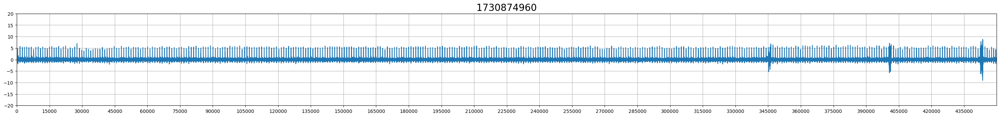

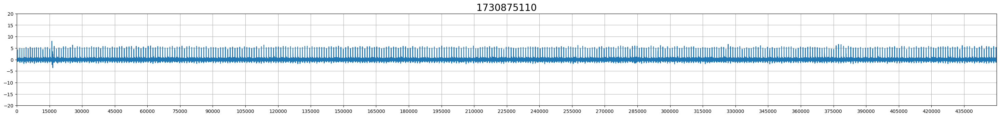

In [ ]:
read_lead = '2'
buff=fetch_lead(read_lead)*gain;
NTS = 30     ### Number of data points in a plot; 15000 for one timestamp

ND = 15000*NTS
d, c = sp.signal.butter(7, [2/500] , btype='high', analog=False); nos = (sp.signal.filtfilt(d, c, buff))*0.000286
plt.figure(0)
plt.figure(figsize=(37.0,3.5))
plt.plot(nos[0:ND])
plt.title(Timestamp,fontsize='20')
plt.ylim([-20,20]); plt.xlim([0,ND]);
plt.xticks(np.arange(0,ND, step=15000)); plt.grid()

for i in range(1,int(len(nos)/ND)):
  plt.figure(i)
  plt.figure(figsize=(37.0,3.5))
  plt.plot(nos[(0+(ND*i)):ND*(i+1)])
  plt.title(Timestamp+(10*15),fontsize='20')
  plt.ylim([-20,20]); plt.xlim([0,ND]);
  plt.xticks(np.arange(0,ND, step=15000)); plt.grid()

# **NEW NOISE REMOVAL 30/8/2024**

1050000
No of bad Ts: [63, 68]
Noise percentage: 2.857142857142857


<Figure size 640x480 with 0 Axes>

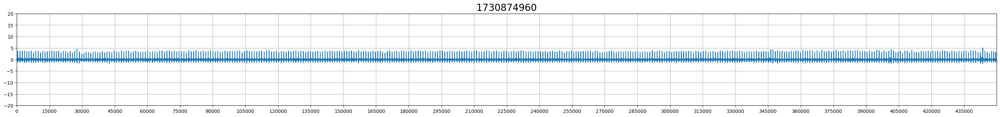

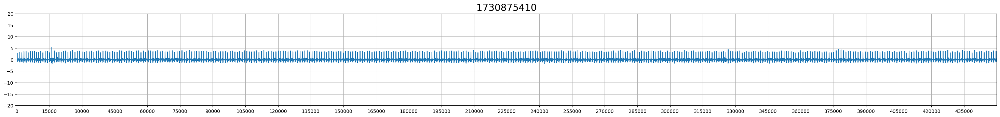

In [ ]:
def quality_check(data):  ### 0 is bad data    1 is good data
  avg_val = round(np.mean(data)); MF = 0;
  range_lower = round(np.min(data)); range_higher = round(np.max(data))
  lower_deviation = np.subtract(avg_val,range_lower); higher_deviation = np.subtract(range_higher,avg_val)
  # need to check the RR
  if ((lower_deviation>=1) and (higher_deviation<=10 ) and (np.std(data)<3)):MF = 1
  return MF

def replace_noise(nos):            ############## Feed filters data as input
  clean_data = []; discard = []; d_q=[]; noise_data = []; Noise_TS = []
  temp = []  # Initialize temp to an empty array
  for i in range(0,int(len(LeadFrame)/15000)):
    st = (15000*i); en = 15000*(i+1)
    d_q = quality_check(nos[st:en])
    if d_q == 1:
      clean_data = np.concatenate((clean_data, nos[st:en]))
      temp = nos[st:en] # Update temp with current segment if it's good
    else:
      # Use the last good segment if current is bad
      if len(temp) > 0:  # Check if temp has been assigned a value before using it
          clean_data = np.concatenate((clean_data,temp))
      else:
          clean_data = np.concatenate((clean_data, nos[st:en])) # Use the current segment if no good segment has been found yet
      noise_data = np.concatenate((noise_data,nos[st:en]))
      Noise_TS.append(i)
  return clean_data, noise_data, Noise_TS

def filt_replace_Holter(raw_data,HPC = 3):
  buff=fetch_lead(read_lead)*gain               ############## Feed Raw Data as input
  d, c = sp.signal.butter(7, [HPC/500] , btype='high', analog=False); BW_filt = (sp.signal.filtfilt(d, c, buff))*0.000286
  Holter_data, noise_holter, Noise_TS = replace_noise(BW_filt);
  return Holter_data, noise_holter, Noise_TS

def plot_mult_TS(data,NTS = 10, First_TS = 1):            ############## Feed filters data as input
  ND = 15000*NTS

  plt.figure(0)
  plt.figure(figsize=(37.0,3.5))
  plt.plot(data[0:ND])
  plt.title(Timestamp,fontsize='20')
  plt.ylim([-20,20]); plt.xlim([0,ND]);
  plt.xticks(np.arange(0,ND, step=15000)); plt.grid()

  for i in range(1,int(len(nos)/ND)):
    plt.figure(i)
    plt.figure(figsize=(37.0,3.5))
    plt.plot(data[(0+(ND*i)):ND*(i+1)])
    plt.title(First_TS+(NTS*15*i),fontsize='20')
    plt.ylim([-20,20]); plt.xlim([0,ND]);
    plt.xticks(np.arange(0,ND, step=15000)); plt.grid()
  return


Holt_data1, noise_data, bad_TS = filt_replace_Holter(buff, HPC = 3);
Holt_data=noise_removal_holter(Holt_data1)
print(len(Holt_data))
print("No of bad Ts:",bad_TS)
plot_mult_TS(Holt_data,NTS = 30,First_TS=Timestamp);

### percentage of noisy data in read data####
No_NT=len(bad_TS)
Total_TS=int(len(buff)/15000)
percentage_noise=((No_NT/Total_TS)*100)
print("Noise percentage:",percentage_noise)

# **CONSOLIDATED GRAPHS (SCATTER+BAR+PIE CHART) 10/4/2024**

<ipython-input-18-8c1ea24cf712>:136: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


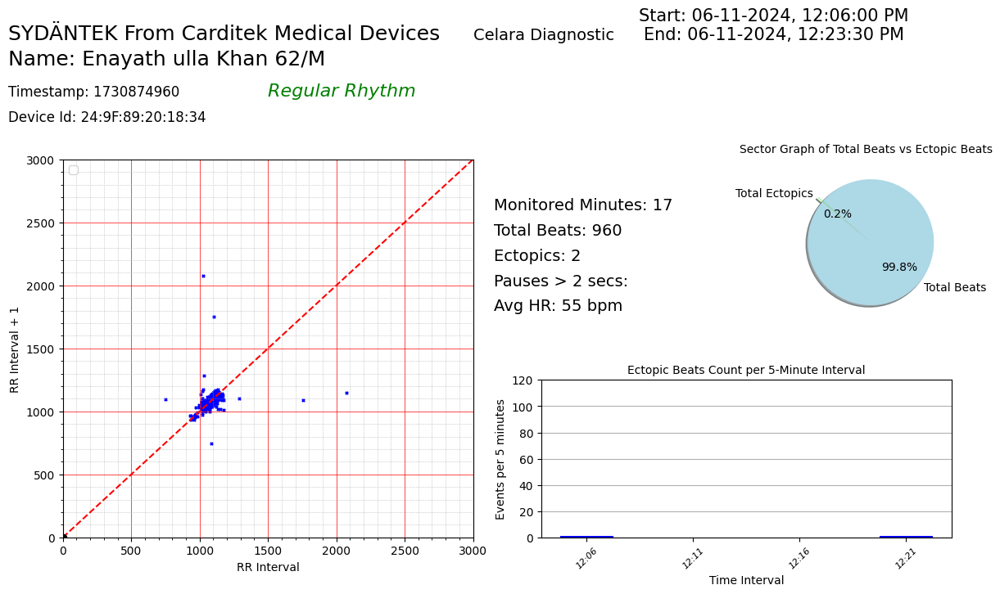

In [ ]:
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import numpy as np
from pytz import timezone

def plot_scatter_plot(Holt_data, R_Peak_Detection_05, Rhythm_Check, HeartRate_parameters,
                      MacId, Timestamp, TrialId, Name, Age, date, time, date2, time2, use_uk_time=True):
    peak_detection, ectopics = R_Peak_Detection_05(Holt_data)
    Rhythm = Rhythm_Check(Holt_data)
    RR_new = np.abs(np.diff(peak_detection))
    HR_line = HeartRate_parameters(peak_detection, RR_new, Holt_data, Fs=1000)

    fig = plt.figure(figsize=(14,6))

    # Scatter plot (left side)
    ax1 = plt.subplot2grid((2, 4), (0, 0), rowspan=2, colspan=2)

    if Rhythm == "Regular Rhythm":
        ax1.text(1500, 3500, Rhythm, fontsize=16, color="green", fontstyle='italic')
    else:
        ax1.text(1500, 3500, Rhythm, fontsize=16, color="red", fontstyle='italic')

    def remove_outliers_iqr(x, y):
        iqr_x = np.percentile(x, 100) - np.percentile(x, 10)
        iqr_y = np.percentile(y, 100) - np.percentile(y, 10)
        threshold_x = 1.5 * iqr_x
        threshold_y = 1.5 * iqr_y
        outliers = np.where((np.abs(x - np.median(x)) > threshold_x) | (np.abs(y - np.median(y)) > threshold_y))
        x_no_outliers = np.delete(x, outliers)
        y_no_outliers = np.delete(y, outliers)
        return x_no_outliers, y_no_outliers

    x_no_outliers, y_no_outliers = remove_outliers_iqr(RR_new[1:], RR_new[0:len(RR_new) - 1])

    ax1.set_xlim([0, 3000])
    ax1.set_ylim([0, 3000])
    ax1.set_xlabel('RR Interval')
    ax1.set_ylabel('RR Interval + 1')
    ax1.text(-400, 3500, f"Timestamp: {Timestamp}", fontsize=12, color="black")
    ax1.text(-400, 3300, f"Device Id: {MacId}", fontsize=12, color="black")
    ax1.text(-400, 3750, f"Name: {Name} {Age}", fontsize=18, color="black")

    # Prepare the date and time display
    text = f"Start: {date}, {time}\nEnd: {date2}, {time2}"
    ax1.text(5200, 3950, text, horizontalalignment='center', fontsize=15)
    ax1.text(-400, 3950, "SYDÄNTEK From Carditek Medical Devices", fontsize=18, color="black")
    ax1.text(3000, 3950, "Celara Diagnostic", fontsize=14, color="black")

    # Determine the correct time zone
    if use_uk_time:
        time_zone = timezone('Europe/London')
    else:
        time_zone = timezone('Asia/Kolkata')

    # Combine date and time strings to create datetime objects
    start_datetime_str = f"{date} {time}"
    end_datetime_str = f"{date2} {time2}"
    datetime_format = "%d-%m-%Y %I:%M:%S %p"

    # Convert to datetime objects with timezone
    start_datetime = datetime.strptime(start_datetime_str, datetime_format)
    start_datetime = time_zone.localize(start_datetime)
    end_datetime = datetime.strptime(end_datetime_str, datetime_format)
    end_datetime = time_zone.localize(end_datetime)

    # Calculate monitored minutes, accounting for possible date changes
    monitored_minutes = (end_datetime - start_datetime).total_seconds() // 60
    if monitored_minutes < 0:
        # If negative, it means the end time is on the next day
        monitored_minutes += 1440  # Add 24 hours in minutes

    ax1.text(3150, 2600, f"Monitored Minutes: {int(monitored_minutes)}", fontsize=14, color="black")
    ax1.text(3150, 2400, f"Total Beats: {len(peak_detection)}", fontsize=14, color="black")
    ax1.text(3150, 2200, f"Ectopics: {len(ectopics)}", fontsize=14, color="black")
    ax1.text(3150, 2000, "Pauses > 2 secs:", fontsize=14, color="black")
    ax1.text(3150, 1800, f"Avg HR: {int(HR_line[0])} bpm", fontsize=14, color="black")

    ax1.grid(which='major', linestyle='-', linewidth='0.5', color='red')
    ax1.grid(which='minor', linestyle=':', linewidth='0.5', color='darkgrey')
    ax1.minorticks_on()
    marker_size = 5
    ax1.scatter(x_no_outliers, y_no_outliers, color='blue', marker='x', s=marker_size)
    ax1.legend()

    slope, intercept, r_value, p_value, std_err = linregress(y_no_outliers, x_no_outliers)
    regression_line = [(slope * x) + intercept for x in y_no_outliers]

    # Adding the 45-degree line
    start_x = 0
    start_y = 0
    line_x = np.linspace(0, 3000, 100)
    line_y = start_y + (line_x - start_x)
    ax1.plot(line_x, line_y, color='red', linestyle='--', label='45 Degree Line')
    ax1.scatter([start_x], [start_y], color='black', zorder=5, label='Start Point')

    # Pie chart (top right)
    ax2 = plt.subplot2grid((2, 4), (0, 3))
    ax2.axis('off')  # Hide axis for pie chart
    labels = ['Total Beats', 'Total Ectopics']
    sizes = [len(RR_new), len(ectopics)]
    colors = ['lightblue', 'lightgreen']
    explode = (0.1, 0)  # "explode" the first slice

    ax2.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%',
            shadow=True, startangle=140)
    ax2.set_title('Sector Graph of Total Beats vs Ectopic Beats', fontsize=10)

    # Bar chart (bottom right)
    ax3 = plt.subplot2grid((2, 4), (1, 2), rowspan=1, colspan=3)

    samples_per_5min = 5 * 60 * 1000  # Samples per 5 minutes at Fs=1000 Hz
    intervals = int(np.ceil(len(Holt_data) / samples_per_5min))
    ectopic_counts_per_interval = [0] * intervals

    for i in range(intervals):
        interval_start = i * samples_per_5min
        interval_end = min((i + 1) * samples_per_5min, len(Holt_data))
        interval_chunk = Holt_data[interval_start:interval_end]
        _, ectopic_count_in_interval = R_Peak_Detection_05(interval_chunk)
        ectopic_counts_per_interval[i] = len(ectopic_count_in_interval)

    time_intervals = [start_datetime + timedelta(minutes=5 * i) for i in range(len(ectopic_counts_per_interval))]
    time_labels = [time.astimezone(time_zone).strftime('%H:%M') for time in time_intervals]
    colors = ['blue' if ectopic_counts_per_interval[i] < 30 else 'grey' for i in range(len(ectopic_counts_per_interval))]

    ax3.bar(range(len(ectopic_counts_per_interval)), ectopic_counts_per_interval, color=colors, width=0.50)
    ax3.set_xlabel('Time Interval')
    ax3.set_ylabel('Events per 5 minutes')
    ax3.set_title('Ectopic Beats Count per 5-Minute Interval', fontsize=10)
    ax3.set_xticks(range(len(time_labels)))
    ax3.set_xticklabels(time_labels, rotation=45, fontsize=8, fontstyle='italic')
    ax3.grid(True, axis='y')
    ax3.set_ylim([0, 120])

    # Adjust layout
    plt.tight_layout()
    plt.subplots_adjust(wspace=0.4, hspace=0.4)


# Call the function with your data
plot_scatter_plot(Holt_data, R_Peak_Detection_05, Rhythm_Check, HeartRate_parameters, MacId, Timestamp, TrialId, Name, Age, date, time, date2, time2,use_uk_time=True)
Filename='scatter_plot'
plt.savefig(('/content/drive/MyDrive/Carditek Report for Celara/Scatter Plots/Short_Scatter/'+date+'_'+TrialId+'_'+Name+'_'+Filename+'.pdf'), bbox_inches='tight')

# **Indian Time**

Outlier RR Intervals: [ 973 2076  981  972  965  931  938  954  955  963  958  961  967  965
  934  962  986 1754  748 1287]
Outlier Peak Locations: [   3611   28810  446628  447609  448581  449546  450477  451415  452369
  453324  454287  455245  456206  457173  458138  459072  460034  944035
 1019802 1033705]
[-0.23169594 -0.23088753 -0.2298756  ... -1.740326   -1.49108146
 -1.2201918 ]
[ 0  1 29 29 29 29 30 30 30 30 30 30 30 30 30 30 30 62 67 68]
Outlier Timestamps with RR interval value:
Index 1, RR Interval Value 973: 1730874960
Index 2, RR Interval Value 2076: 1730874975
Index 3, RR Interval Value 981: 1730875395
Index 4, RR Interval Value 972: 1730875395
Index 5, RR Interval Value 965: 1730875395
Index 6, RR Interval Value 931: 1730875395
Index 7, RR Interval Value 938: 1730875410
Index 8, RR Interval Value 954: 1730875410
Index 9, RR Interval Value 955: 1730875410
Index 10, RR Interval Value 963: 1730875410
Index 11, RR Interval Value 958: 1730875410
Index 12, RR Interval Value

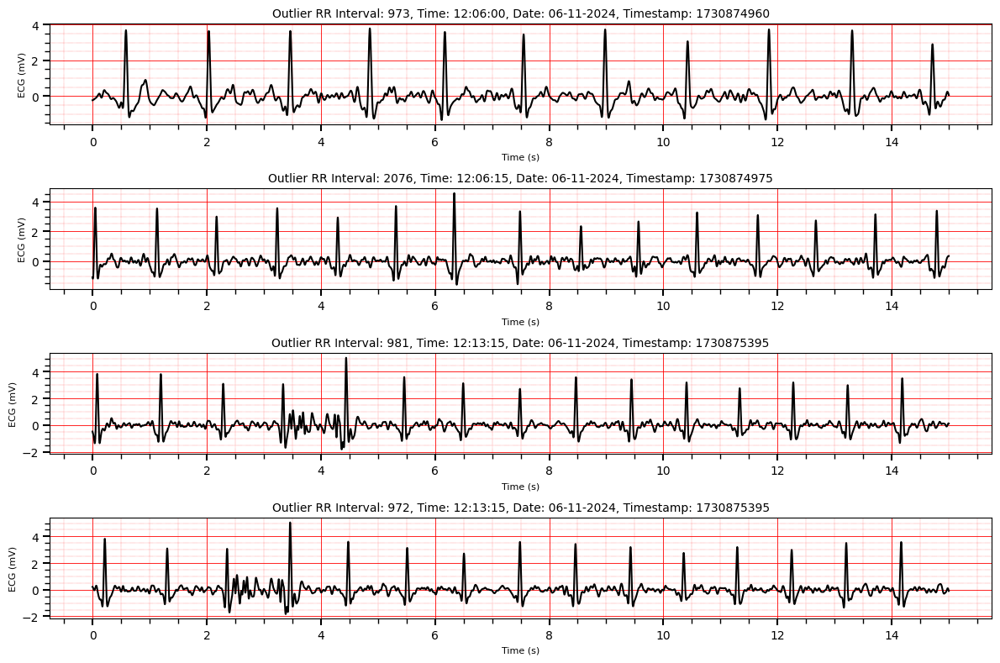

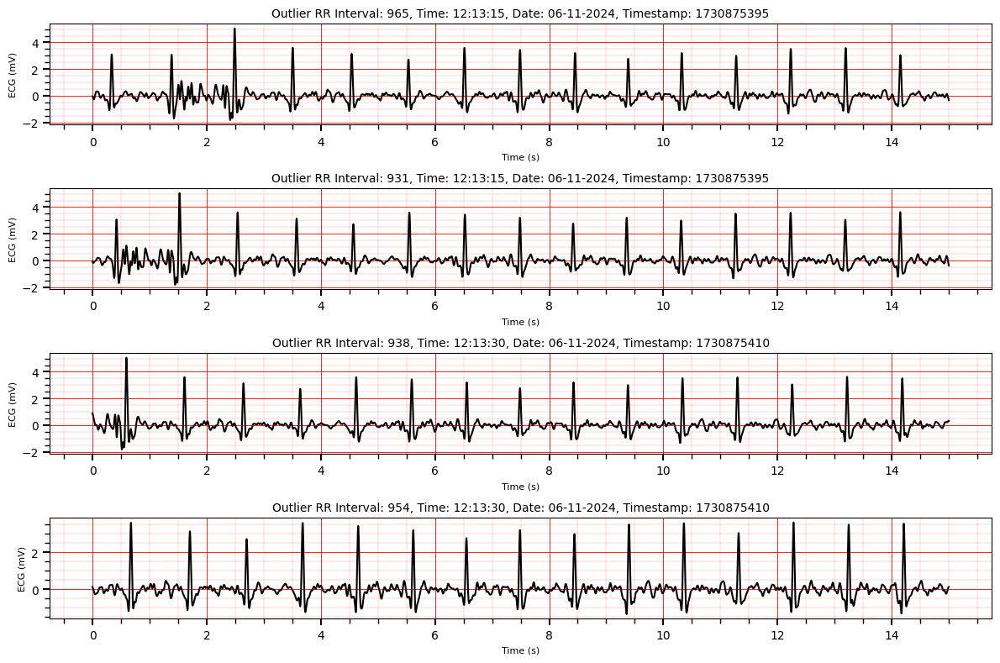

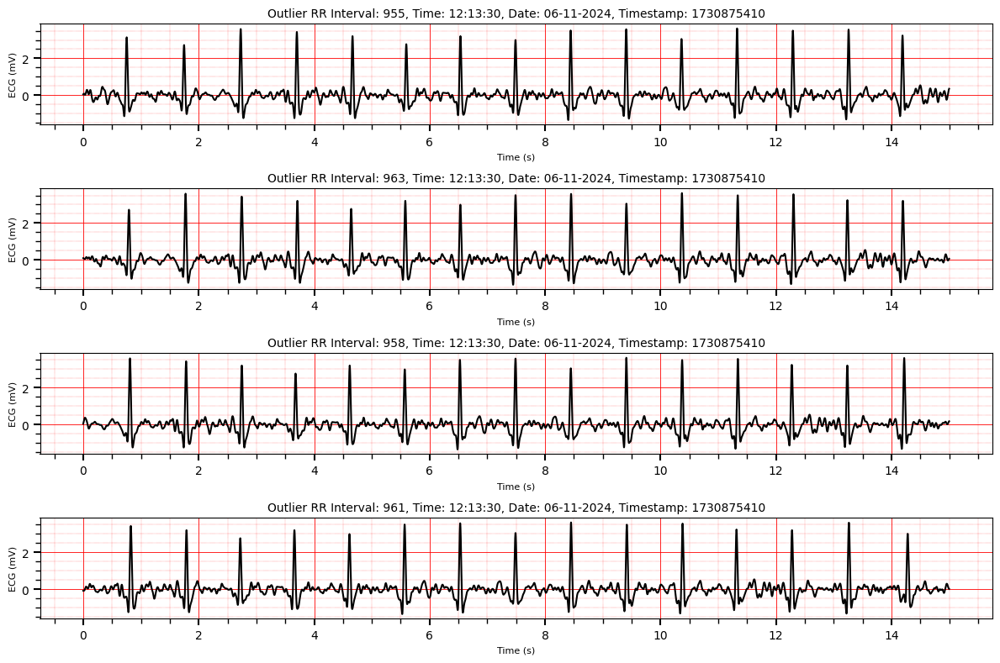

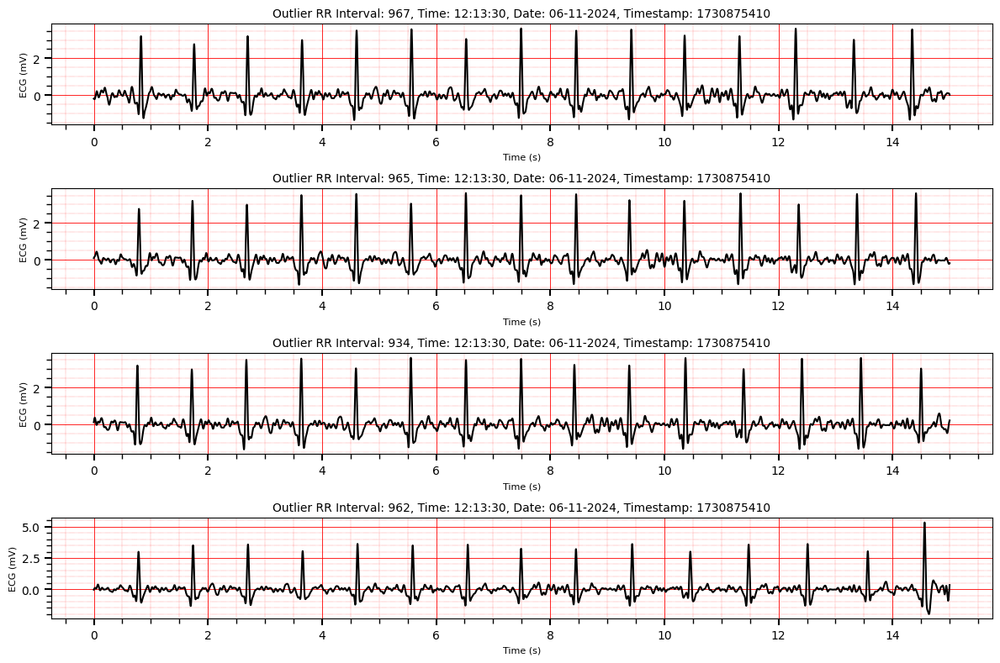

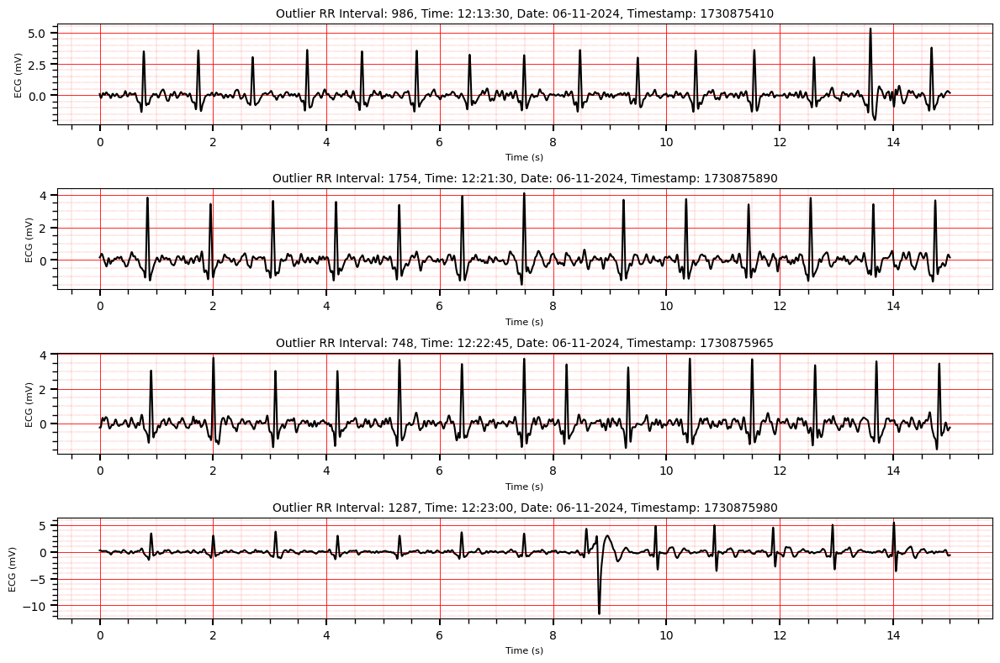

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from pytz import timezone
# Assuming Holt_data and buffer_data are already defined and available
Timestamp_start =Timestamp

# Peak Detection and RR Intervals
peak_detection, ectopics = R_Peak_Detection_05(Holt_data)
RR_intervals = np.abs(np.diff(peak_detection))

# Finding Upper and Lower Limits
mean_rr = np.mean(RR_intervals)
std_rr = np.std(RR_intervals)
upper_limit = mean_rr + 1.96 * std_rr  # 2 standard deviations for upper limit
lower_limit = mean_rr - 1.96 * std_rr  # 2 standard deviations for lower limit

# Identifying Outliers
outliers = (RR_intervals > upper_limit) | (RR_intervals < lower_limit)

# Outlier Data
outlier_RR_intervals = RR_intervals[outliers]
outlier_peak_locations = np.array(peak_detection[:-1])[outliers]
print("Outlier RR Intervals:", outlier_RR_intervals)
print("Outlier Peak Locations:", outlier_peak_locations)

# R-Peak Location from Buffer Data
buffer_peak_locations = np.array(Holt_data)  # Assuming buffer_data contains the locations
print(buffer_peak_locations)

sample_rate = 1000
timestamp_interval = 15  # seconds
first_timestamp = Timestamp

intervals = []
for i in range(len(outlier_peak_locations)):
    peak = outlier_peak_locations[i]
    interval = int(peak / (sample_rate * 15))
    intervals.append(interval)
intervals = np.array(intervals)
print(intervals)

outlier_timestamps = []
for j in range(len(intervals)):
    interval = intervals[j]
    timestamp = first_timestamp + (interval * timestamp_interval)
    outlier_timestamps.append(timestamp)
outlier_timestamps = np.array(outlier_timestamps)

# # Print outlier timestamps with RR interval numbering
# print("Outlier Timestamps with RR interval numbering:")
# for idx, timestamp in enumerate(outlier_timestamps, 1):
#     print(f"RR Interval {idx}: {timestamp}")

# Print outlier timestamps with RR interval numbering and RR Interval value
print("Outlier Timestamps with RR interval value:")
for idx, (interval, timestamp, rr_value) in enumerate(zip(intervals, outlier_timestamps, outlier_RR_intervals), 1):
    print(f"Index {idx}, RR Interval Value {rr_value}: {timestamp}")

# Assuming Holt_data and R_Peak_Detection_05 are already defined and available
Timestamp_start = Timestamp_start  # Ensure this is properly initialized

# Define the function to convert timestamps into human-readable format
def get_time_from_timestamp(timestamp):
    # Convert the timestamp to a datetime object and localize it to 'Asia/Kolkata'
    read_able = datetime.fromtimestamp(timestamp, tz=timezone('Asia/Kolkata'))

    # Format the date as 'dd-mm-yyyy'
    date_string = read_able.strftime("%d-%m-%Y")

    # Format the time as 'HH:MM:SS'
    time_string = read_able.strftime("%H:%M:%S")

    # Return the formatted date, time, and original timestamp
    return (date_string, time_string, timestamp)





# Extract 15-second ECG segments around each outlier
sample_rate = 1000  # 1000 Hz sample rate
ecg_segment_duration = 15 * sample_rate  # 15 seconds of ECG data

# Calculate intervals and timestamps
intervals = []
for i in range(len(outlier_peak_locations)):
    peak = outlier_peak_locations[i]
    interval = int(peak / (sample_rate * 15))
    intervals.append(interval)
intervals = np.array(intervals)

outlier_timestamps = []
for j in range(len(intervals)):
    interval = intervals[j]
    timestamp = int(Timestamp_start + (interval * timestamp_interval))  # Convert to int for no decimal
    outlier_timestamps.append(timestamp)
outlier_timestamps = np.array(outlier_timestamps)

# Splitting the subplots into smaller groups for better readability
subplots_per_figure = 4  # Smaller number of subplots per figure
total_outliers = len(outlier_peak_locations)
num_figures = int(np.ceil(total_outliers / subplots_per_figure))

for fig_num in range(num_figures):
    # Calculate the number of subplots for the current figure
    num_subplots = min(subplots_per_figure, total_outliers - fig_num * subplots_per_figure)

    # Create subplots, handle single plot case correctly
    fig, axes = plt.subplots(num_subplots, 1, figsize=(12, 8))

    # Convert `axes` to a list if there's only one subplot
    if num_subplots == 1:
        axes = [axes]

    # Loop over subplots for the current figure
    for i in range(num_subplots):
        index = fig_num * subplots_per_figure + i
        if index >= total_outliers:
            break

        peak = outlier_peak_locations[index]

        # Calculate start and end points for 15-second window around the peak
        start = int(max(0, peak - ecg_segment_duration // 2))  # Avoid negative index
        end = int(min(len(Holt_data), peak + ecg_segment_duration // 2))  # Avoid overflow

        # Extract ECG segment
        ecg_segment = Holt_data[start:end]

        # Generate corresponding timestamps for the ECG segment
        timestamps = np.linspace(0, 15, len(ecg_segment))  # Time values from 0 to 15 seconds

        # Convert the outlier timestamp to readable date and time
        date, time, original_timestamp = get_time_from_timestamp(outlier_timestamps[index])

        # Plot the ECG segment
        ax = axes[i]
        ax.plot(timestamps, ecg_segment, color='black')  # ECG in black

        # Update title with RR interval, original timestamp, and formatted time
        ax.set_title(f"Outlier RR Interval: {int(outlier_RR_intervals[index])}, Time: {time}, Date: {date}, Timestamp: {original_timestamp}", fontsize=10)  # No decimal points
        ax.set_xlabel("Time (s)", fontsize=8)
        ax.set_ylabel("ECG (mV)", fontsize=8)

        # Enable major and minor grids
        ax.grid(which='both', linestyle='-', linewidth='0.6', color='red')

        # Set minor ticks and grids
        ax.minorticks_on()
        ax.grid(which='minor', linestyle=':', linewidth='0.3', color='red')

        # Set tick parameters (both major and minor) to red
        ax.tick_params(axis='both', which='major', colors='black', length=6, width=1.5)
        ax.tick_params(axis='both', which='minor', colors='black', length=4, width=1)

    # Adjust the layout for readability: gaps between subplots
    plt.tight_layout(h_pad=1.0)  # Adds proper vertical spacing between subplots

    # Show each figure
    plt.show()

# **UK Time**

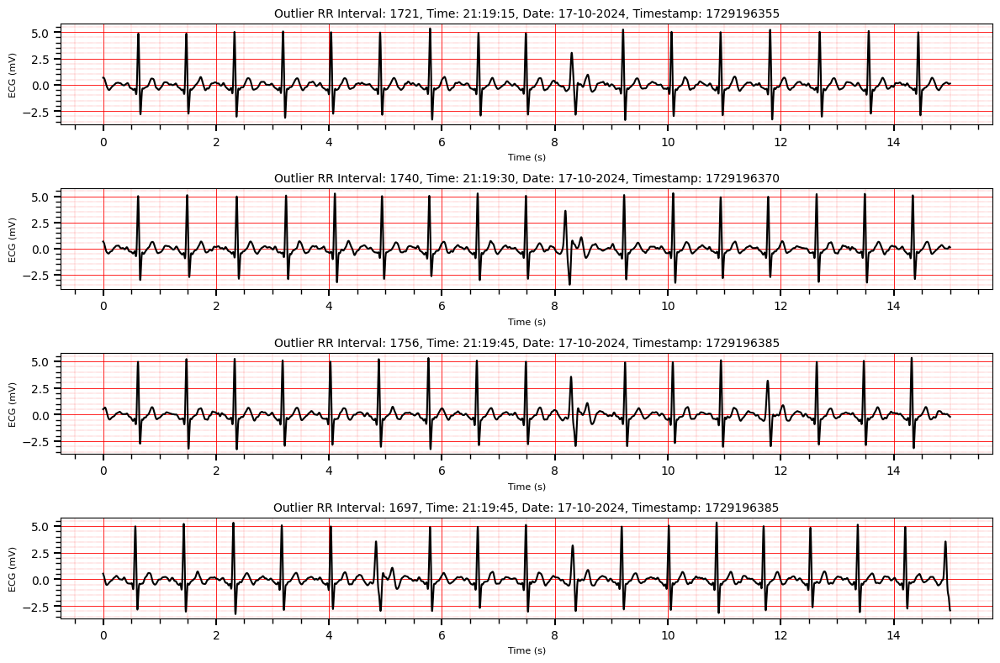

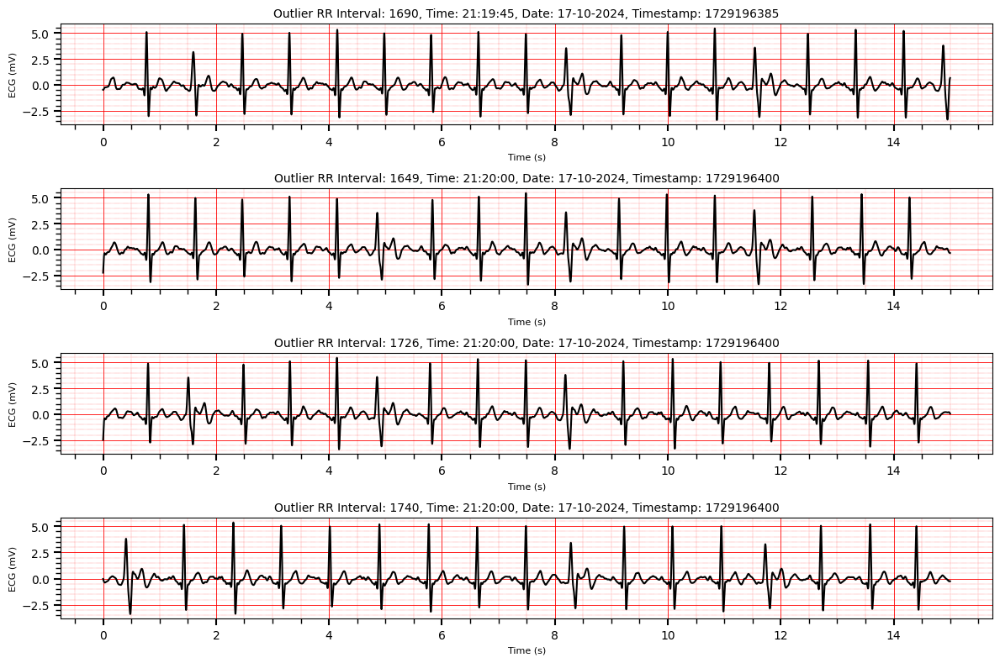

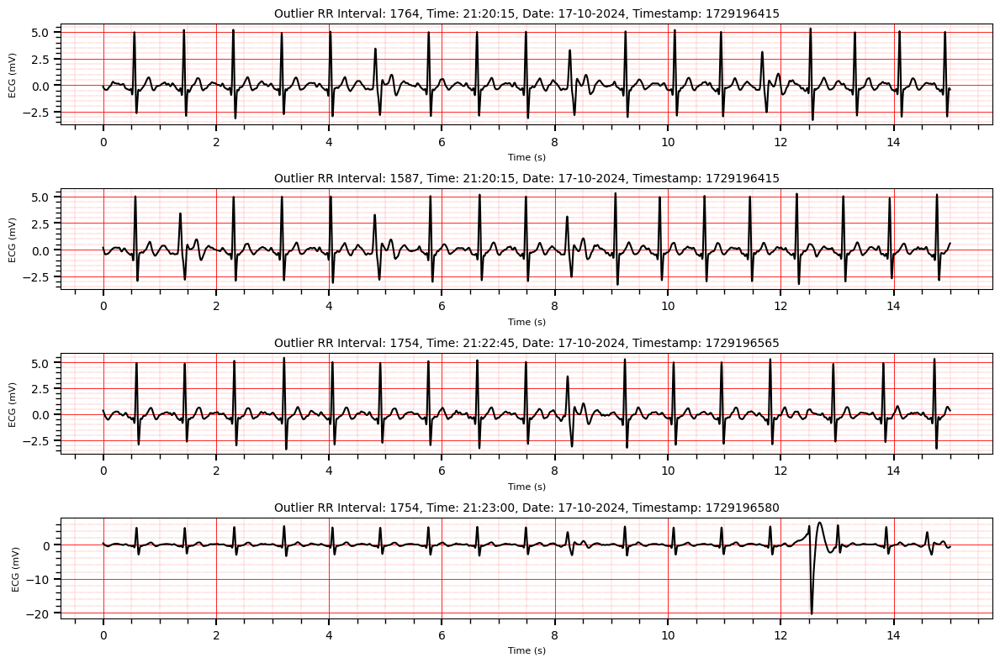

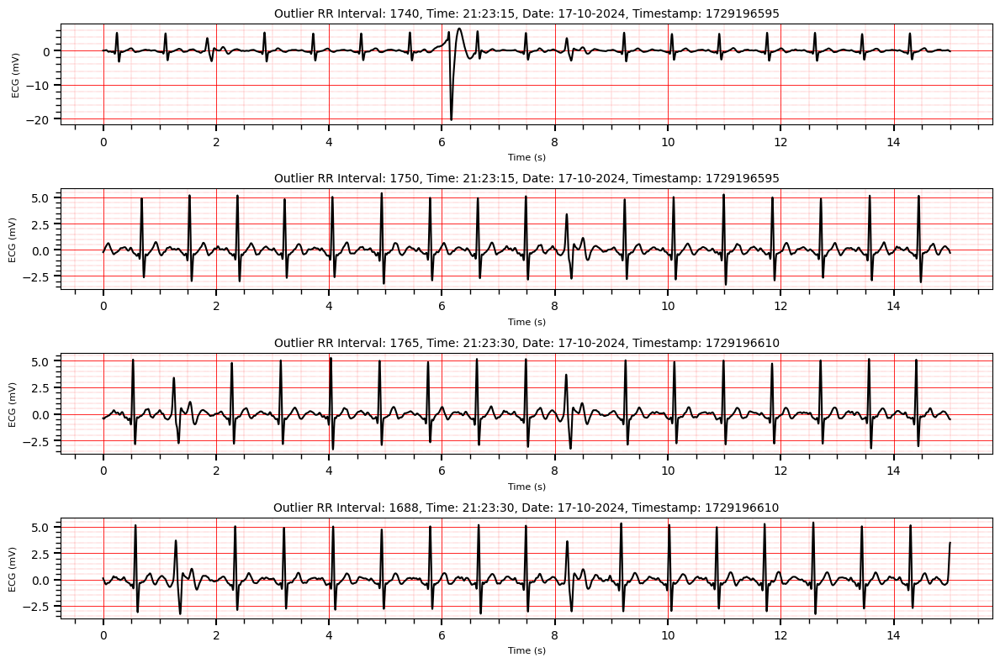

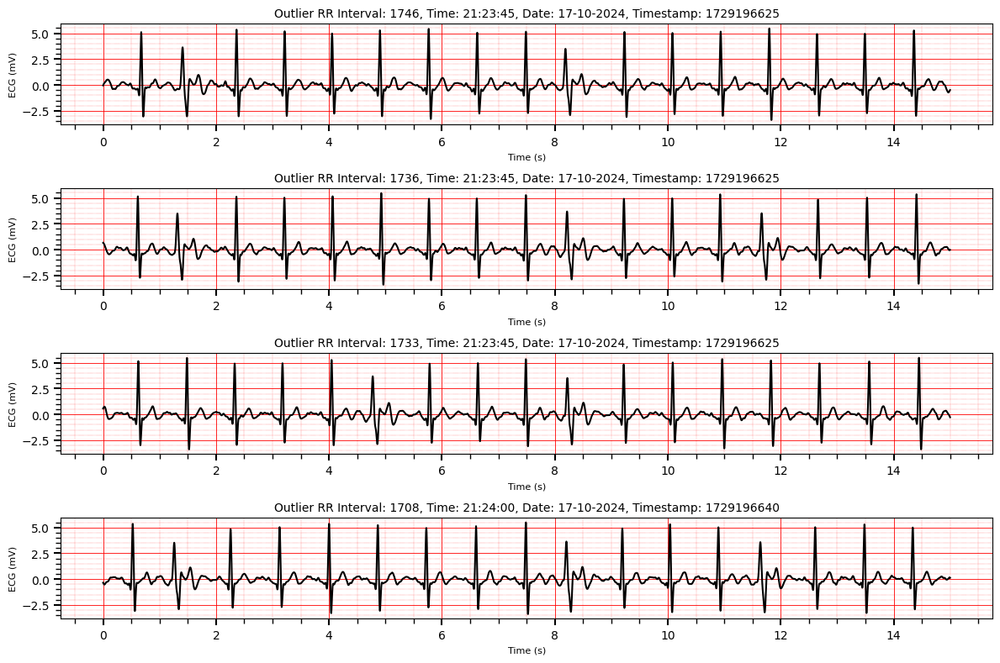

...

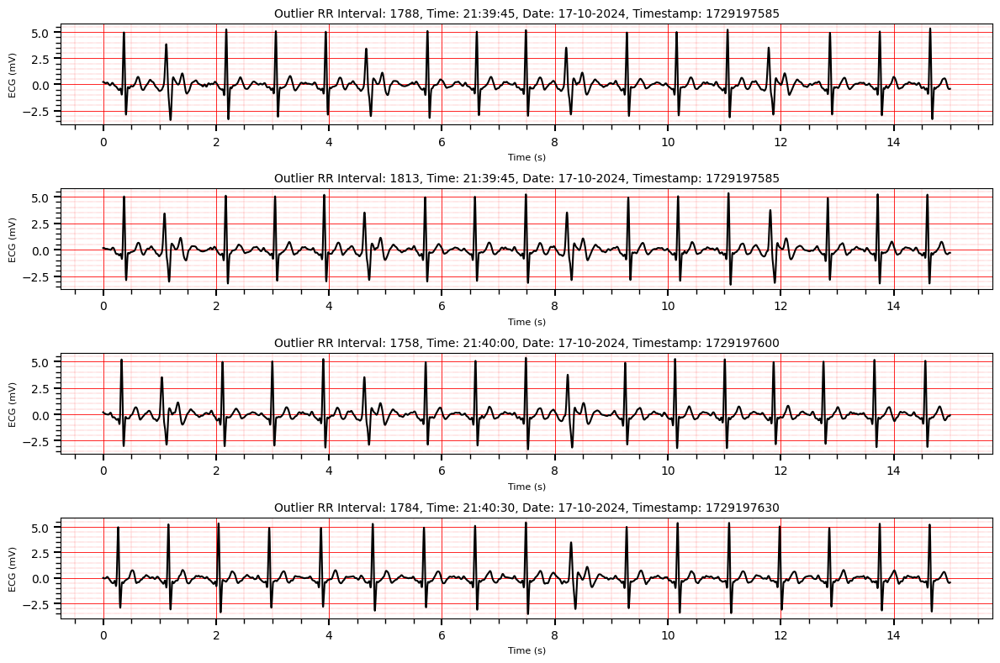

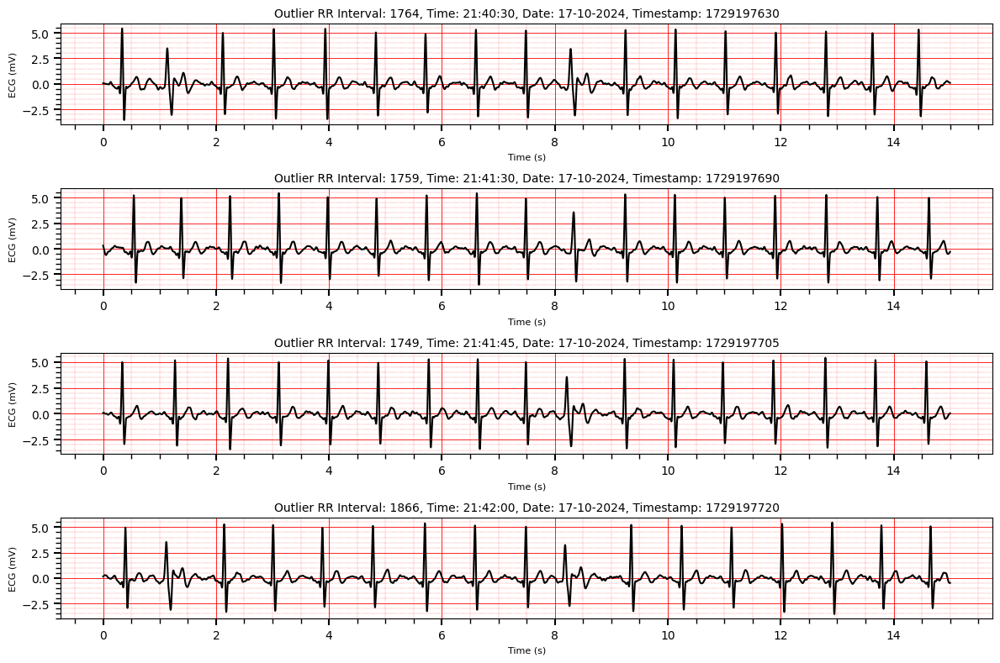

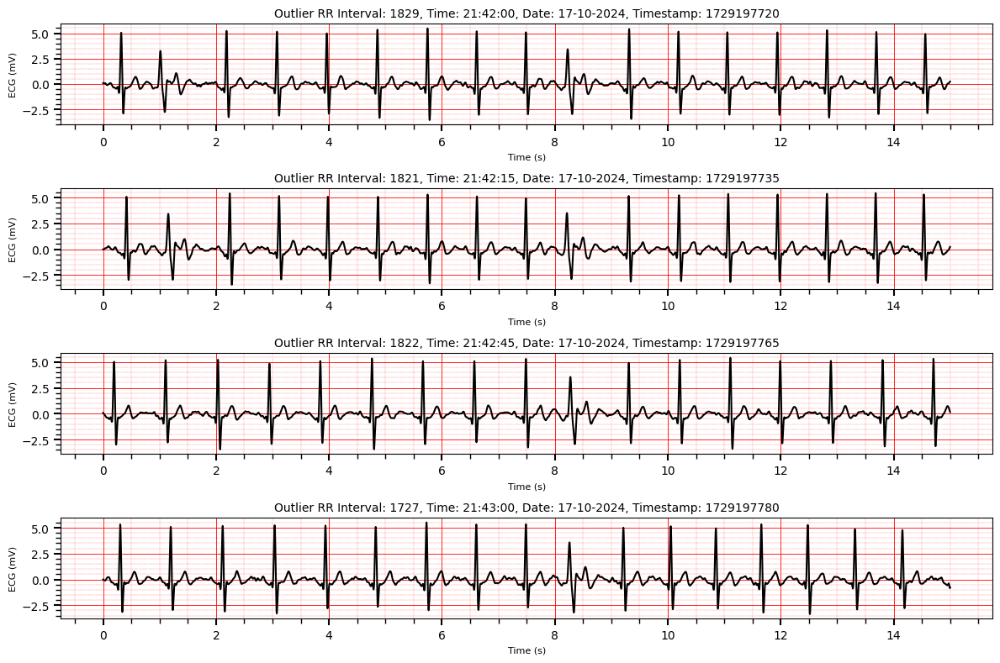

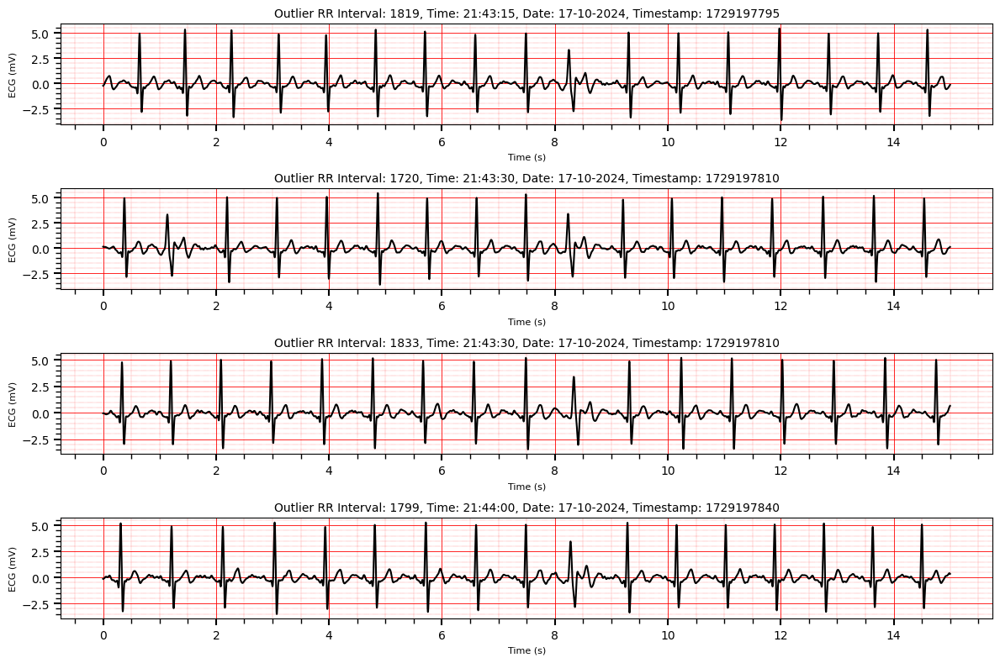

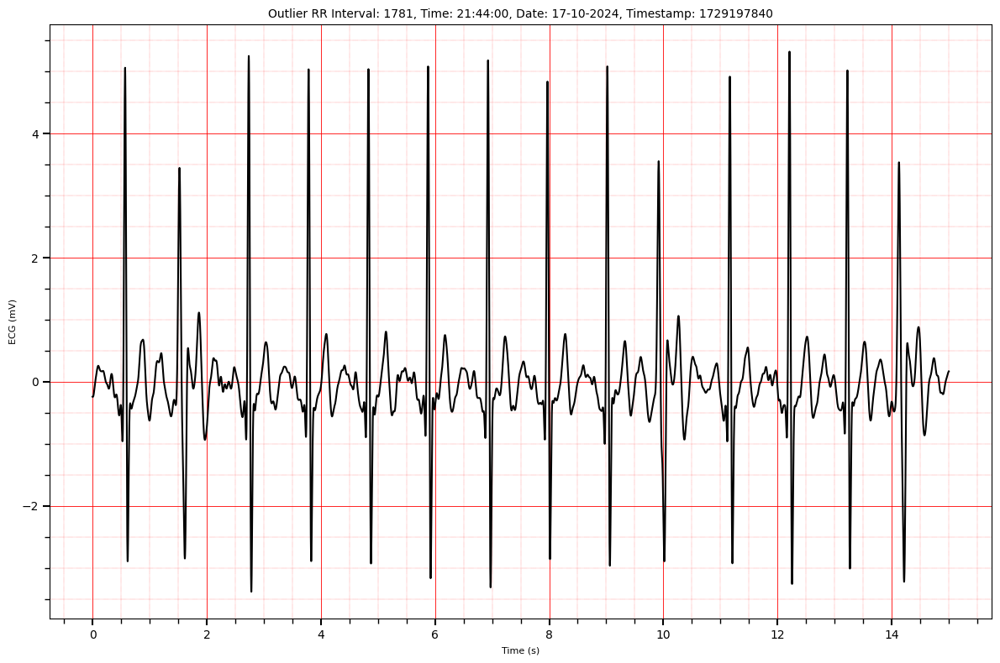

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from pytz import timezone

# Assuming Holt_data and R_Peak_Detection_05 are already defined and available
Timestamp_start =Timestamp  # Ensure this is properly initialized

# Define the function to convert timestamps into human-readable UK format
def get_time_from_timestamp_UK(timestamp):
    # Convert timestamp to datetime object in 'Asia/Kolkata' timezone
    read_able = datetime.fromtimestamp(timestamp, timezone('Asia/Kolkata'))

    # Convert to 'Europe/London' timezone
    now_london = str(read_able.astimezone(timezone('Europe/London')))  # Convert to string

    # Extract the date and format it as 'dd-mm-yyyy'
    year = now_london[0:10]
    year = year[8:10] + "-" + year[5:7] + "-" + year[0:4]

    # Extract the time in 'hh:mm:ss' format
    time_string = now_london[11:19]

    return (year, time_string, timestamp)

# Peak Detection and RR Intervals
peak_detection, ectopics = R_Peak_Detection_05(Holt_data)
RR_intervals = np.abs(np.diff(peak_detection))

# Finding Upper and Lower Limits
mean_rr = np.mean(RR_intervals)
std_rr = np.std(RR_intervals)
upper_limit = mean_rr + 1.96 * std_rr  # 2 standard deviations for upper limit
lower_limit = mean_rr - 1.96 * std_rr  # 2 standard deviations for lower limit

# Identifying Outliers
outliers = (RR_intervals > upper_limit) | (RR_intervals < lower_limit)

# Outlier Data
outlier_RR_intervals = RR_intervals[outliers]
outlier_peak_locations = np.array(peak_detection[:-1])[outliers]

# Extract 15-second ECG segments around each outlier
sample_rate = 1000  # 1000 Hz sample rate
ecg_segment_duration = 15 * sample_rate  # 15 seconds of ECG data

# Calculate intervals and timestamps
intervals = []
for i in range(len(outlier_peak_locations)):
    peak = outlier_peak_locations[i]
    interval = int(peak / (sample_rate * 15))
    intervals.append(interval)
intervals = np.array(intervals)

outlier_timestamps = []
for j in range(len(intervals)):
    interval = intervals[j]
    timestamp = int(Timestamp_start + (interval * timestamp_interval))  # Convert to int for no decimal
    outlier_timestamps.append(timestamp)
outlier_timestamps = np.array(outlier_timestamps)

# Splitting the subplots into smaller groups for better readability
subplots_per_figure = 4  # Smaller number of subplots per figure
total_outliers = len(outlier_peak_locations)
num_figures = int(np.ceil(total_outliers / subplots_per_figure))

for fig_num in range(num_figures):
    # Calculate the number of subplots for the current figure
    num_subplots = min(subplots_per_figure, total_outliers - fig_num * subplots_per_figure)

    # Create subplots, handle single plot case correctly
    fig, axes = plt.subplots(num_subplots, 1, figsize=(12, 8))

    # Convert `axes` to a list if there's only one subplot
    if num_subplots == 1:
        axes = [axes]

    # Loop over subplots for the current figure
    for i in range(num_subplots):
        index = fig_num * subplots_per_figure + i
        if index >= total_outliers:
            break

        peak = outlier_peak_locations[index]

        # Calculate start and end points for 15-second window around the peak
        start = int(max(0, peak - ecg_segment_duration // 2))  # Avoid negative index
        end = int(min(len(Holt_data), peak + ecg_segment_duration // 2))  # Avoid overflow

        # Extract ECG segment
        ecg_segment = Holt_data[start:end]

        # Generate corresponding timestamps for the ECG segment
        timestamps = np.linspace(0, 15, len(ecg_segment))  # Time values from 0 to 15 seconds

        # Convert the outlier timestamp to readable UK date and time
        date, time, original_timestamp = get_time_from_timestamp_UK(outlier_timestamps[index])

        # Plot the ECG segment
        ax = axes[i]
        ax.plot(timestamps, ecg_segment, color='black')  # ECG in black

        # Update title with RR interval, original timestamp, and formatted UK time
        ax.set_title(f"Outlier RR Interval: {int(outlier_RR_intervals[index])}, Time: {time}, Date: {date}, Timestamp: {original_timestamp}", fontsize=10)  # No decimal points
        ax.set_xlabel("Time (s)", fontsize=8)
        ax.set_ylabel("ECG (mV)", fontsize=8)

        # Enable major and minor grids
        ax.grid(which='both', linestyle='-', linewidth='0.6', color='red')

        # Set minor ticks and grids
        ax.minorticks_on()
        ax.grid(which='minor', linestyle=':', linewidth='0.3', color='red')

        # Set tick parameters (both major and minor) to red
        ax.tick_params(axis='both', which='major', colors='black', length=6, width=1.5)
        ax.tick_params(axis='both', which='minor', colors='black', length=4, width=1)

    # Adjust the layout for readability: gaps between subplots
    plt.tight_layout(h_pad=1.0)  # Adds proper vertical spacing between subplots

    # Show each figure
    plt.show()

# **Report Testing Block Version 3 30/8/2024**

total peaks detected: 960
RR_new_interval: [1074 1058 1032  973 1022 1058 1070 1055 1080 1042 1039 1060 1023 1036
 1070 1028 1017 1076 1049 1062 1082 1043 1062 1061 1019 1021 1151 2076
 1026 1064 1016 1044 1075 1082 1039 1081 1089 1074 1095 1088 1090 1110
 1083 1115 1092 1107 1117 1103 1085 1104 1100 1079 1090 1077 1103 1095
 1107 1111 1110 1103 1113 1104 1114 1127 1123 1111 1119 1088 1118 1119
 1097 1122 1142 1108 1101 1137 1088 1107 1121 1091 1103 1122 1092 1091
 1132 1087 1110 1132 1132 1131 1125 1098 1111 1139 1094 1115 1135 1113
 1128 1145 1109 1139 1164 1117 1132 1137 1116 1112 1142 1116 1113 1114
 1109 1117 1116 1121 1157 1118 1103 1130 1100 1102 1098 1115 1114 1131
 1104 1122 1116 1105 1086 1100 1102 1114 1100 1102 1117 1088 1112 1116
 1096 1107 1091 1099 1092 1100 1103 1100 1096 1094 1109 1112 1069 1078
 1093 1078 1063 1070 1100 1085 1084 1116 1081 1091 1105 1090 1086 1111
 1110 1123 1117 1100 1109 1134 1092 1109 1125 1120 1121 1108 1152 1105
 1110 1113 1125 1096 1103 1168 111

<Figure size 640x480 with 0 Axes>

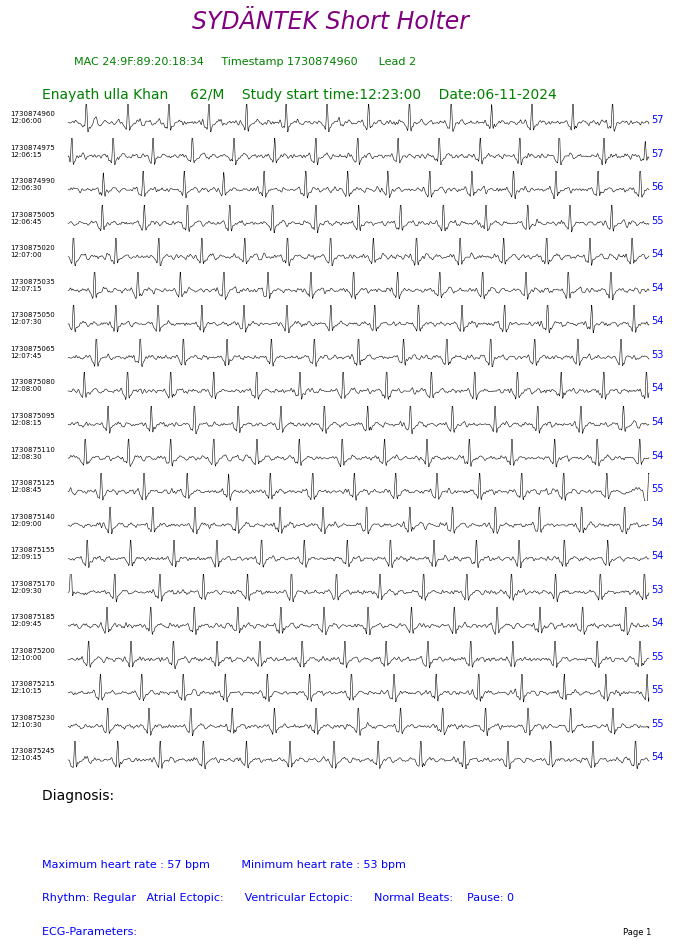

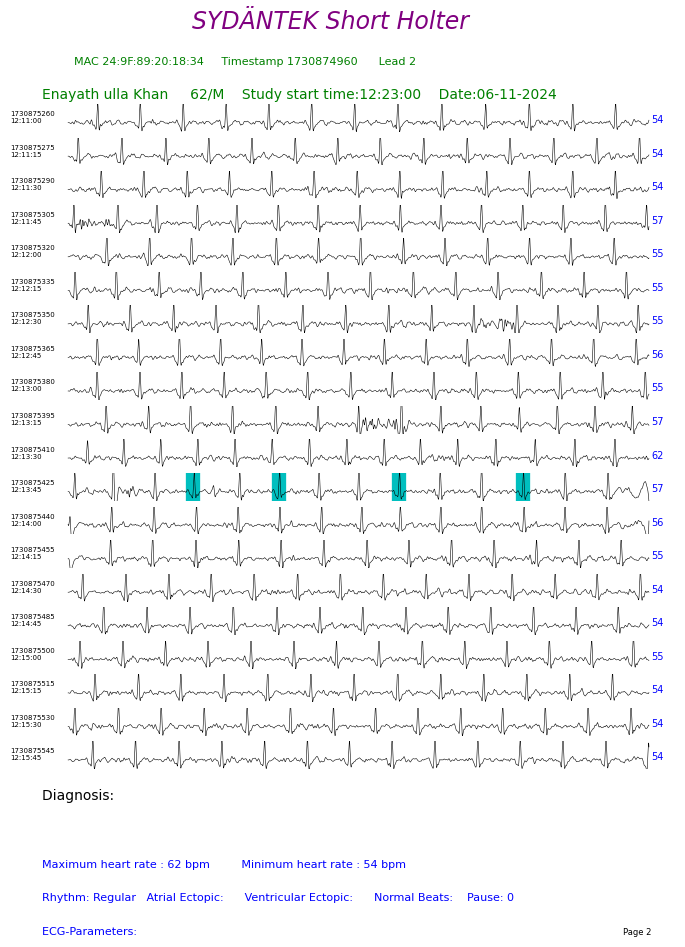

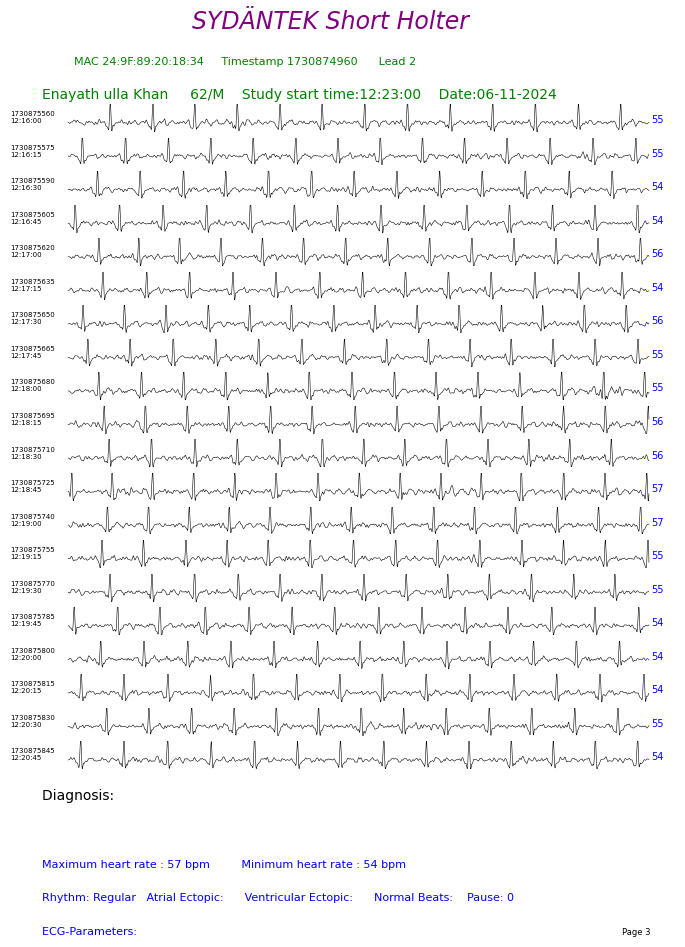

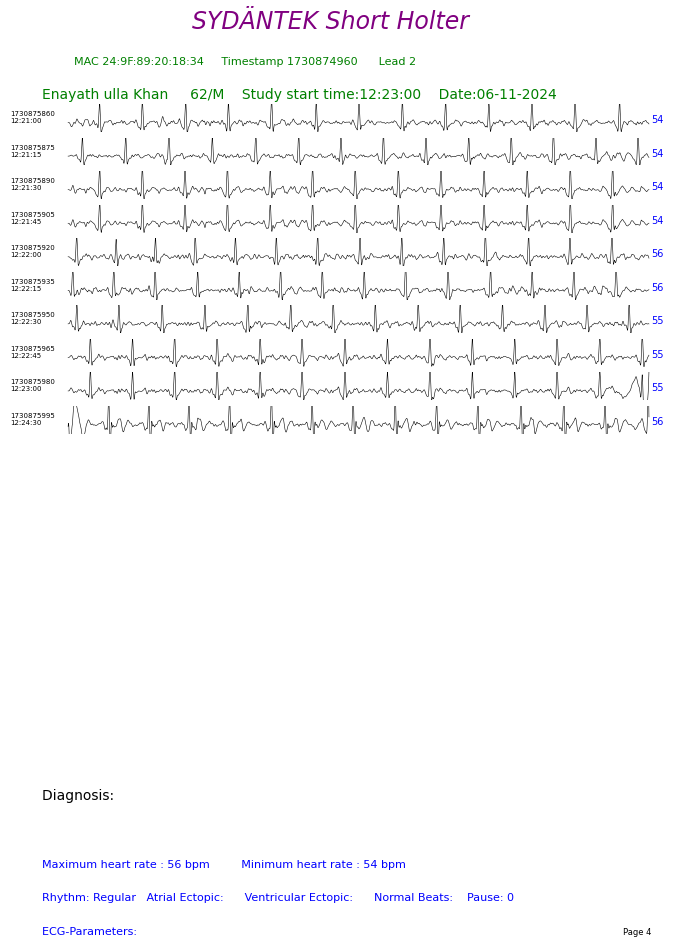

In [ ]:
trialcount = 0; Ventricularcount = 0; Tot_beat = 0;

buff = Holt_data;

def Rhythm_Check_ver2(lead_data, iteration):
  _,RR_int = RR_calculation11(lead_data)
  st_dev = np.std(RR_int); RC=0
  if (st_dev<90):
    # print("st_dev :", st_dev)
    ax[iteration].text(15500,0,'*',color='white',fontsize=10);
    RC = RC
    # return(1);# print('Regular Rhythm')
  else:
    ax[iteration].text(15500,0,'*',color='red',fontsize=10);
    RC = RC+1; #print("Iregular st_dev :", st_dev, RR_int)
    # return(0);# print('Irregular Rhythm')
  return RC

###########################################################
###########################################################           working plot
Noise_detection=False
def plotting_ver2(sig, iteration):
  # sig=data_loss(sig); # SV_len = 0; PV_len = 0; NB_len = 0
  sig, state = machine_diconnect_15sec(sig)
  # secs = len(sig)/Fs; samps = int(secs*100) ;  sig_disp = (sp.signal.resample(ecg_filters_V5_01(sig*0.000286), samps));
  if state==False:    ##no disconnect
    RC = Rhythm_Check_ver2(sig, iteration)
    # HR_line, Pause_line = HeartRate_parameters11(ecg_filters_Rpeak(sig))
    Rpeak, RR_int = RR_calculation11(ecg_filters_Rpeak(sig))
    HR_line, Pause_line = HeartRate_parameters11(Rpeak, RR_int,sig)
    # SVT_count, SVT_start, SVT_Stop = SVT_check(Rpeak, RR_int)
    HRV_line.append(HR_line[0]); MaxHR.append(HR_line[1]); MinHR.append(HR_line[2])
    # ax[iteration].plot(h,ecg_filters_V5_smooth(sig)*1,'k',linewidth=0.4);
    peak_detection,ectopic_detection=R_Peak_Detection_05(sig)
    # for i in range (len(peak_detection)):
    #   ax[iteration].axvline(x = peak_detection[i], color = 'g', linestyle = '-',linewidth=1.5)

    # peak_ep=[]
    # for g in range(len(peak_detection)-1):
    #   RR_new=np.abs(np.diff(peak_detection))
    #   mode_RR_new=st.mode(RR_new)
    #   window=100
    #   threshold= mode_RR_new+window
    #   if abs(peak_detection[g]-peak_detection[g+1])>threshold:
    #     peak_ep.append(peak_detection[g])


    for i in range(0,len(ectopic_detection)):        #### comment
      ax[iteration].axvline(x = ectopic_detection[i], color = 'c', linestyle = '-',linewidth=10.3)   ### comment



    ax[iteration].plot(h,ecg_filters_Smooth_holter(sig)*10000,'k',linewidth=0.4);
    # for i in range(0,len(sig)):
    #   ax[iteration].axvline(x = sig[i], color= 'r',linestyle = '-',linewidth=0.3);

    # if SVT_count!=0:
    #   for i in range(len(SVT_start)):
    #     ax[iteration].axvspan(SVT_start[i]+((iteration-2)*samples_per_line/1000)-50, SVT_Stop[i]+((iteration-2)*samples_per_line/1000)+50, alpha=0.2, color="yellow")
    # # ax[iteration].plot(sig_disp*1.5,'k',linewidth=0.4);
    if len(Pause_line[0])!=0:
      TotPause.append(Pause_line[0]);
    ax[iteration].text(15050,0,str(HR_line[0]),color='blue',fontsize=7);
  else:   ##disconnect
    ax[iteration].plot(h,sig[0:15000],'k',linewidth=0.4);
    RC = 0
  return RC


def detect_ectopic_beats(ecg_signal_peak, threshold):                                     ### comment the function
  # Calculate the difference between consecutive R-R intervals
  rr_intervals = np.diff(ecg_signal_peak)
  # print("RR int 2: ",rr_intervals)
  # Calculate the mean and standard deviation of the R-R intervals
  rr_mean = np.mean(rr_intervals); #print("Mean RR :",rr_mean)
  rr_std = np.std(rr_intervals); #print("STD RR :",rr_std, rr_std*threshold)
  ectopic_beats = []; ectopic_idx = []
  # Detect ectopic beats based on the threshold
  for i in range(0, len(rr_intervals)):
      if abs(rr_intervals[i] - rr_mean) > threshold * rr_std:
          ectopic_beats.append(ecg_signal_peak[i+1]); ectopic_idx.append(i)
  return ectopic_beats

def find_PVC(signal, Rpeaks):
  RRinterval = np.diff(Rpeaks); print(RRinterval)
  ##   LIST OF AREA UNDER THE CURVE
  AUC = collections.deque(); NB=0
  # for k in Rpeaks:
  #   ch=abs(np.round(np.trapz(signal[k-80:k+80])));AUC.append(ch)
  #   # print("median : ",ch, 1.3*st.median(AUC))
  # AUC = np.array(AUC); #print(AUC)
  ##    ECTOPIC FUNCTION
  PVC_list = np.empty_like(Rpeaks, dtype=float); PVC_list[:] = np.NaN
  # SVC_list = np.empty_like(Rpeaks, dtype=float); SVC_list[:] = np.NaN
  for i in range(1,len(RRinterval)):
    if RRinterval[i]>=(1.2*RRinterval[i-1]):
          PVC_list[i] = Rpeaks[i]

      # if Ramplitued[i]>=(Ramplitued[i-1]+(0.2*Ramplitued[i-1])):#PVC
        # if AUC[i-1]>(1.3*st.median(AUC[0:i-1])):
          # PVC_list[i] = Rpeaks[i]
    else: NB=NB+1
        # else: #SVC or PVC
        #   if i>1:
        #     if AUC[i]>(1.3*st.mode(AUC[0:i-1])):
        #       PVC_list[i] = Rpeaks[i]
  return (np.array(PVC_list), NB)



# buff1 = fetch_lead(read_lead);buff2 = np.concatenate((buff,buff1))


buff = collections.deque(Data_addidtion(buff, lines_per_page))
ect_buff =  np.array(buff)

page=0; line=[]; linecount=lines_per_page;
HRV_line =[]; TotPause =[]; MaxHR = []; MinHR = [];
HRV_plot = [];
RhythmCount = 0
countlen=len(buff); samples_per_line = 15000*Timestamp_per_line
# _,time = get_time_from_timestamp(Timestamp)
HolterTitle = 'SYDÄNTEK Short Holter'; plot_header=("%s     %s    Study start time:%s    Date:%s"%(Name,Age,str(time),Date.at[0,'Date']))
plot_header_technical=("MAC %s     Timestamp %d      Lead %s"%(MacId,Timestamp,read_lead))

filtered = Holt_data # ectopic_filters(ect_buff)
# peaks,rpeak = sp.signal.find_peaks(filtered,distance = 400,height=(max(filtered[1000:5000])/2)); print('Total peaks detected : ',len(peaks))
# com_width = round(Fs//(8)); start_p = peaks[1]-com_width; end_p = peaks[1]+com_width
# template = filtered[start_p:end_p]
SV=[]; PV=[]; NB=[]
# SV, PV,  NB = find_ectopic(filtered, template)  ### comment if needed
# PV = detect_ectopic_beats(peaks, 1.5)           ##### comment
# PV, NB = find_PVC(filtered,peaks)           ##### comment

Rpeak, Ectopics = R_Peak_Detection_05(buff)
print("total peaks detected:",len(Rpeak))
RR_new_interval=np.abs(np.diff(Rpeak))
print("RR_new_interval:",RR_new_interval)
mode_RR_new=st.mode(RR_new_interval);print("mode_RR_new:",mode_RR_new)
rr_interval=[];rr_comp=[];
for v in range(len(RR_new_interval)-1):
  if RR_new_interval[v]>=(1.9*mode_RR_new):
    rr_interval.append(RR_new_interval[v])
    rr_comp.append(v)



while countlen!=0:
  plt.figure(page); fig, ax = plt.subplots(linecount+7,figsize=(8.27,11.69));
  # plt.figure(page); fig, ax = plt.subplots(linecount+3,figsize=(8.27,11.69));
  ax[0].set_title(HolterTitle,color='purple', fontstyle='italic',fontsize=17); ax[0].text(0.1,0,plot_header_technical,fontsize=8, color='green')
  ax[0].set_yticklabels([]); ax[0].set_xticklabels([]); ax[0].axis('off')
  ax[1].text(0.05,0,plot_header,fontsize=10, color='green'); ax[1].set_yticklabels([]); ax[1].set_xticklabels([]); ax[1].axis('off')

  page_det = ("Page %d"%(page+1));
  Atrialcount = 0; Ventricularcount = 0; Tot_beat = 0;
  PV_len = 0; SV_len = 0
  for j in range(2,linecount+2):
    for i in range(samples_per_line):
      line.append(buff.popleft())
      countlen = countlen-1
    line=np.array(line); h = np.arange(0,len(line))
    if max(line[0:samples_per_line])!=2000:
      index = j-2+(lines_per_page*page)
      # TS_print = str(Date.at[index,'All_Timestamp']) +"\n"+ str(Date.at[index,'All_Time'])
      TS_print = str(TS.at[index,'All_Timestamp']) +"\n"+ str(Date.at[index,'All_Time'])
      # TS_print = str(TS.at[index,'All_Timestamp']) +"\n"+ str(Date.at[index,'All_Time']+"\n Noise Coeff "+str(Noise_estimation(line)))
      ax[j].text(-1500,0,str(TS_print),fontsize=5)
      # ax[j].text(-1700,0,str(TS.at[index,'All_Timestamp']),fontsize=5)
      if Noise_detection==True:
        if Noise_estimation(line)>=1: ##if sample is clean
          RhythmCount = RhythmCount + plotting_ver2(line, j);
          for n in SV:
            if n>=((j-2)*samples_per_line)+(300000*page) and n<= (j*samples_per_line)+(300000*page):
              # ax[j].axvspan(n-((j-2)*samples_per_line)-(300000*page)-150, n-((j-2)*samples_per_line)-(300000*page)+150, alpha=0.2, color="green")     ##### comment
              # ax[j].text(15500,0,'*',color='red',fontsize=10);             ##### comment
              Atrialcount = Atrialcount+1
              if math.isnan(n)==False: SV_len = SV_len+1
          for n in PV:
            if n>=((j-2)*samples_per_line)+(300000*page) and n<= (j*samples_per_line)+(300000*page):
              # ax[j].axvspan(n-((j-2)*samples_per_line)-(300000*page)-150, n-((j-2)*samples_per_line)-(300000*page)+150, alpha=0.2, color="green")   ##### comment
              ax[j].text(15500,0,'*',color='red',fontsize=10);       ##### comment
              Ventricularcount = Ventricularcount+1
              if math.isnan(n)==False: PV_len = PV_len+1
        else: ## if sample is noisy
          l = 30; t = np.linspace(0, 1, samples_per_line, endpoint = True);
          line = deque(sp.signal.square(2*np.pi*l*t)*2); ax[j].plot(h,line,'k',linewidth=0.4);
      else:
        RhythmCount = RhythmCount + plotting_ver2(line, j);
        if Noise_estimation(line)>=2:
          for n in SV:
            if n>=((j-2)*samples_per_line)+(300000*page) and n<= (j*samples_per_line)+(300000*page):
              # ax[j].axvspan(n-((j-2)*samples_per_line)-(300000*page)-150, n-((j-2)*samples_per_line)-(300000*page)+150, alpha=0.2, color="green")    ### comment
              ax[j].text(15500,0,'*',color='red',fontsize=10);    ### comment
              Atrialcount = Atrialcount+1
              if math.isnan(n)==False: SV_len = SV_len+1
          for n in PV:
            if n>=((j-2)*samples_per_line)+(300000*page) and n<= (j*samples_per_line)+(300000*page):
              # ax[j].axvspan(n-((j-2)*samples_per_line)-(300000*page)-150, n-((j-2)*samples_per_line)-(300000*page)+150, alpha=0.2, color="green")      #### commennt
              ax[j].text(15500,0,'*',color='red',fontsize=10);     ### comment
              Ventricularcount = Ventricularcount+1
              if math.isnan(n)==False: PV_len = PV_len+1
    else:   ##end of ecg blank plot
      ax[j].plot(0);
    line=deque(line)
    ax[j].set_yticklabels([]); ax[j].set_xticklabels([]); ax[j].set_ylim(-4,8); ax[j].set_xlim(-1500,15050); ax[j].axis('off')
    k = j+1; line.clear()


  # print('Atrial Ectopic :%d         Ventricular Ectopic :%d   Normal Beats:%d'%(Atrialcount,Ventricularcount,NB))
  if RhythmCount>0 and RhythmCount<=5: rhy = str(RhythmCount)+' Irregular Timestamp';
  elif RhythmCount>5: rhy = 'Irregular ';
  else: rhy = 'Regular '
    # Initialize MAX and MIN with default values
  # MAX = "N/A"
  # MIN = "N/A"
  if len(HRV_line)>=2: MAX = str(max(HRV_line)); MIN = str(min(HRV_line));
  # Ectopic_det = ('Rhythm : %s      Atrial Ectopic : %d       Ventricular Ectopic : %d' %(rhy, Atrialcount))            #### comment
  Ectopic_det = ('Rhythm: %s  Atrial Ectopic:      Ventricular Ectopic:      Normal Beats:    Pause: %d'%(rhy,len(TotPause)))   ### comment
  ax[k].text(0.05,0.1,"Diagnosis: ", horizontalalignment='left',ma='right',fontsize=10,color='black');ax[k].set_yticklabels([]);ax[k].set_xticklabels([]);ax[k].axis('off')
  # ax[k+1].text(0.05,0.1,"Irregular rhythm; Suggestive of Atrial Fibrillation", horizontalalignment='left',ma='right',fontsize=8,color='black')   ## comment when needed
  ax[k+1].set_yticklabels([]);ax[k+1].set_xticklabels([]);ax[k+1].axis('off')
  ax[k+2].text(0.05,0.1,("Maximum heart rate : %s bpm         Minimum heart rate : %s bpm"%(MAX,MIN)), horizontalalignment='left',ma='left',fontsize=8,color='blue');ax[k+2].set_yticklabels([]);ax[k+2].set_xticklabels([]);ax[k+2].axis('off')
  ax[k+3].text(0.05,0.1,Ectopic_det, horizontalalignment='left',ma='left',fontsize=8,color='blue');ax[k+3].set_yticklabels([]);ax[k+3].set_xticklabels([]);ax[k+3].axis('off')
  ax[k+4].text(0.05,0.1,"ECG-Parameters: ", horizontalalignment='left',ma='left',fontsize=8,color='blue');ax[k+4].set_yticklabels([]);ax[k+4].set_xticklabels([]);ax[k+4].axis('off')
  # ax[k+4].text(0.05,0.1," ", horizontalalignment='left',ma='left',fontsize=8,color='blue');ax[k+4].set_yticklabels([]);ax[k+4].set_xticklabels([]);ax[k+4].axis('off')   ###comment when needed
  ax[k+4].text(1,0.1,page_det, horizontalalignment='right',ma='right',fontsize=6,color='black');#ax[k+5].set_yticklabels([]);ax[k+5].set_xticklabels([]);ax[k+5].axis('off')             #### comment
  HRV_line.clear() ; TotPause.clear() ; MaxHR.clear(); MinHR.clear; EctopicCount_page=0
  page+=1;

  ## creating and storing PDF
  pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Carditek Report for Celara/Holter Report/"+Name+" "+Date.at[0,'Date']+"_holterV3_ectV1_.pdf")

  # pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Carditek_Report_for_Celara/Holter Report/"+time+" "+Date.at[0,'Date']+"Name+"_holterV3_ectV1.pdf")
  # pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Carditek_Report_for_Celara/Holter Report/24Hours/CKH0784 DR RAMYA 04-03-2023/10_"+Name+" "+Date.at[0,'Date']+"_holterV3.pdf")
  # pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Carditek Report for Celara/Holter Report/Long Holter/Alok Long Holter/101_"+Name+" "+Date.at[0,'Date']+"_holterV3.pdf")
   # pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Carditek_Report_for_Celara/Holter Report/Testing/"+Name+".pdf")
  # pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Holter Report/Testing/"+Date.at[0,'Date']+"_"+Name+".pdf")
  for fig in range(1, plt.gcf().number + 1):
    plt.figure(fig).set_size_inches(8.27, 11.69)  # Adjust these values as needed
    pdf.savefig( fig, bbox_inches='tight',pad_inches=0.0 )

  pdf.close()

# **OLD NOISE REMOVAL**

3600000
No of bad Ts: [41, 43]
Noise percentage: 0.8333333333333334


<Figure size 640x480 with 0 Axes>

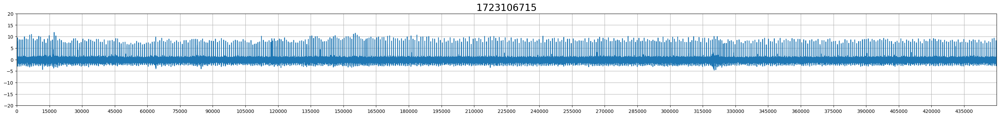

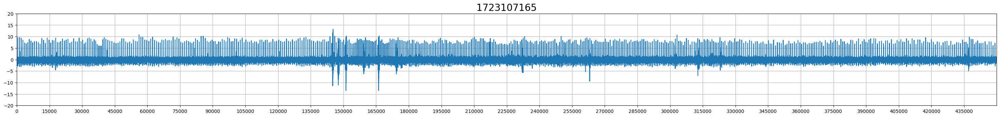

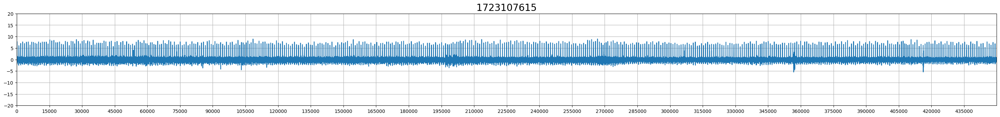

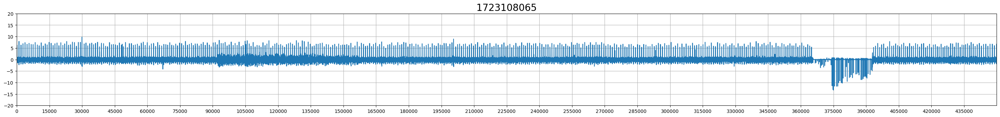

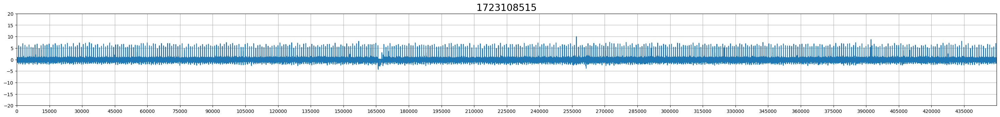

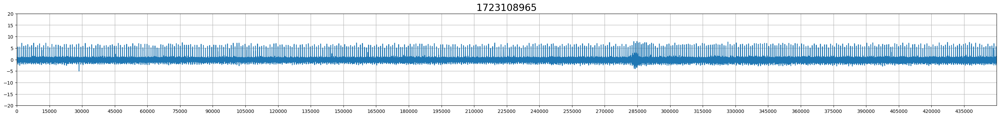

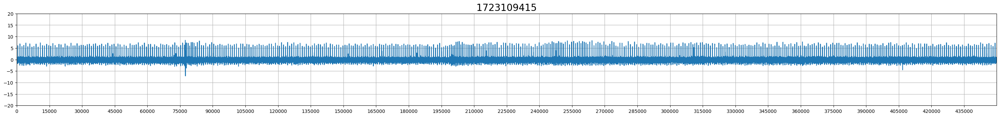

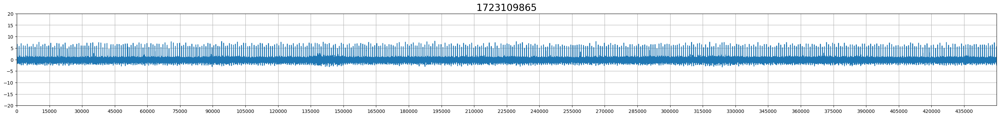

In [ ]:
def quality_check(data):  ### 0 is bad data    1 is good data
  avg_val = round(np.mean(data)); MF = 0;
  range_lower = round(np.min(data)); range_higher = round(np.max(data))
  lower_deviation = np.subtract(avg_val,range_lower); higher_deviation = np.subtract(range_higher,avg_val)
  # need to check the RR
  if ((lower_deviation<=25 and lower_deviation>=1) and (higher_deviation<=25 and higher_deviation>=1) and (np.std(data)<5)):MF = 1
  return MF

def replace_noise(nos):            ############## Feed filters data as input
  clean_data = []; discard = []; d_q=[]; noise_data = []; Noise_TS = []
  for i in range(0,int(len(LeadFrame)/15000)):
    st = (15000*i); en = 15000*(i+1)
    d_q = quality_check(nos[st:en])
    if d_q == 1:
      clean_data = np.concatenate((clean_data, nos[st:en]))
      temp = nos[st:en]
    else:
      #temp = nos[st:en]
      clean_data = np.concatenate((clean_data,temp))
      noise_data = np.concatenate((noise_data,nos[st:en]))
      Noise_TS.append(i)
  return clean_data, noise_data, Noise_TS

def filt_replace_Holter(raw_data,HPC = 3):
  buff=fetch_lead(read_lead)*gain               ############## Feed Raw Data as input
  d, c = sp.signal.butter(7, [HPC/500] , btype='high', analog=False); BW_filt = (sp.signal.filtfilt(d, c, buff))*0.000286
  Holter_data, noise_holter, Noise_TS = replace_noise(BW_filt);
  return Holter_data, noise_holter, Noise_TS

def plot_mult_TS(data,NTS = 10, First_TS = 1):            ############## Feed filters data as input
  ND = 15000*NTS

  plt.figure(0)
  plt.figure(figsize=(37.0,3.5))
  plt.plot(data[0:ND])
  plt.title(Timestamp,fontsize='20')
  plt.ylim([-20,20]); plt.xlim([0,ND]);
  plt.xticks(np.arange(0,ND, step=15000)); plt.grid()

  for i in range(1,int(len(nos)/ND)):
    plt.figure(i)
    plt.figure(figsize=(37.0,3.5))
    plt.plot(data[(0+(ND*i)):ND*(i+1)])
    plt.title(First_TS+(NTS*15*i),fontsize='20')
    plt.ylim([-20,20]); plt.xlim([0,ND]);
    plt.xticks(np.arange(0,ND, step=15000)); plt.grid()
  return


Holt_data, noise_data, bad_TS = filt_replace_Holter(buff, HPC = 3);
Holt_data=noise_removal_holter(Holt_data)
print(len(Holt_data))
print("No of bad Ts:",bad_TS)
plot_mult_TS(Holt_data,NTS = 30,First_TS=Timestamp);

### percentage of noisy data in read data####
No_NT=len(bad_TS)
Total_TS=int(len(buff)/15000)
percentage_noise=((No_NT/Total_TS)*100)
print("Noise percentage:",percentage_noise)

# **SCATTER PLOT WITH 45 DEGREE ANGLE LINE**

1500000
Total Peak Detection: 2125
Total ectopic detection: 67
Max HR: 97
Min HR: 77
Avg HR: 85


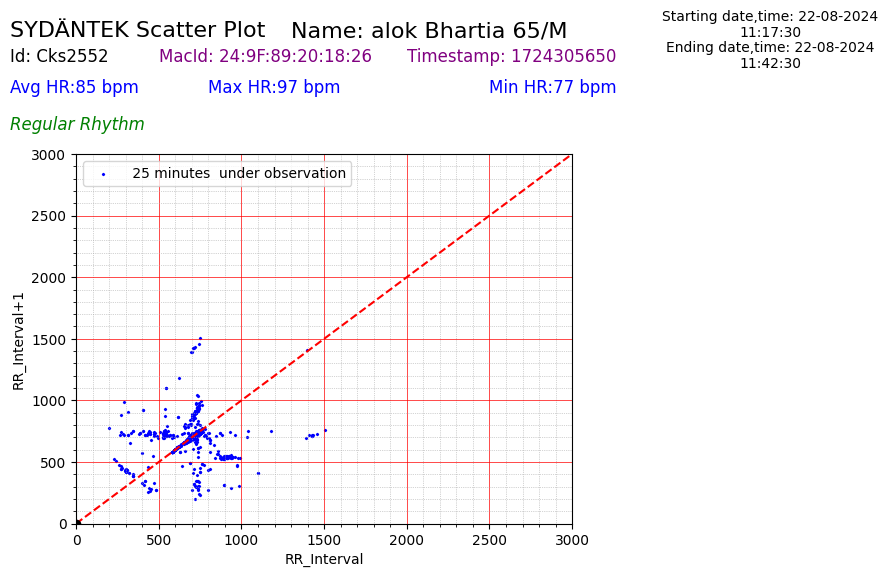

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import linregress



# peak_detection = R_Peak_Detection_03(Holt_data)
peak_detection,ectopics=R_Peak_Detection_05(Holt_data)
print(len(Holt_data))
Rhythm=Rhythm_Check(Holt_data)
# print(Rhythm)
print("Total Peak Detection:", len(peak_detection))
print("Total ectopic detection:",len(ectopics))  ###will only work in regular rhythms
RR_new = np.abs(np.diff(peak_detection))
average_RR_interval=np.mean(RR_new)
# print(RR_new)  # Uncomment to print the RR intervals
# print("Total RR Intervals:", len(Rpeak))
HR_line = HeartRate_parameters(peak_detection, RR_new,Holt_data,Fs=1000)
print("Max HR:",int (HR_line[1]))
print("Min HR:", int(HR_line[2]))
print("Avg HR:",int (HR_line[0]))
if Rhythm =="Regular Rhythm":
 plt.text(-400,3200, Rhythm,fontsize=12,color="green",fontstyle='italic')
#  if int (HR_line[0]) <100:
#    print("Heart Rate:", "Normal Rhythm");plt.text(1800,3200, "Normal Rhythm",fontsize=12, fontstyle='italic',color="green")
#  if  int (HR_line[0])  >100 and  int (HR_line[0])  <150:
#    print("Heart Rate:", "Sinus Tachycardia");plt.text(1800,3200, "Sinus Tachycardia",fontsize=12, fontstyle='italic',color="orange")
#  if int (HR_line[0]) >160:
#    print("Heart Rate:", "Supraventricular Tachycardia");plt.text(1800,3200, "Supraventricular Tachycardia",fontsize=12, fontstyle='italic',color="red")
else:
 plt.text(-400,3200, Rhythm,fontsize=20,color="red",fontstyle='italic')

def remove_outliers_iqr(x, y):
    iqr_x = np.percentile(x, 100) - np.percentile(x, 10)
    iqr_y = np.percentile(y, 100) - np.percentile(y, 10)
    threshold_x = 1.5 * iqr_x
    threshold_y = 1.5 * iqr_y
    outliers = np.where((np.abs(x - np.median(x)) > threshold_x) | (np.abs(y - np.median(y)) > threshold_y))
    x_no_outliers = np.delete(x, outliers)
    y_no_outliers = np.delete(y, outliers)
    return x_no_outliers, y_no_outliers

x_no_outliers, y_no_outliers = remove_outliers_iqr(RR_new[1:], RR_new[0:len(RR_new) - 1])
# # Make the plot larger
# plt.figure(figsize=(14, 10))
plt.xlim([0, 3000])
plt.ylim([0, 3000])
plt.xlabel('RR_Interval')
plt.ylabel('RR_Interval+1')
plt.text(-400,3500,str("Avg HR:%d bpm"%(int (HR_line[0]))),fontsize=12,color="blue");
plt.text(800,3500,str("Max HR:%d bpm"%(int (HR_line[1]))),fontsize=12,color="blue"); plt.text(2500,3500,str("Min HR:%d bpm"%(int(HR_line[2]))),fontsize=12,color="blue")
# plt.text(1800,3400,str("MacId: %s "%(MacId)),fontsize=16,color="purple")
plt.text(500,3750,str("MacId: %s "%(MacId)),fontsize=12,color="purple")
# plt.text(-400,3400,str("Timestamp: %s"%(Timestamp)),fontsize=16,color="purple")
plt.text(2000,3750,str("Timestamp: %s"%(Timestamp)),fontsize=12,color="purple")
# plt.text(-400,4130,str("Id: %s"%(TrialId)),fontsize=20)
plt.text(-400,3750,str("Id: %s"%(TrialId)),fontsize=12)
# plt.text(1800,4130,str("Name: %s %s"%(Name,Age)),fontsize=20,color="black")
plt.text(1300,3950,str("Name: %s %s"%(Name,Age)),fontsize=16,color="black")
# plt.text(1200,4590, "Celara Diagnostic",fontsize=20, fontstyle='italic')

# plt.text(5500,4580, str("Starting date,time: %s\n%s"%(date,time)),horizontalalignment='center', fontsize=18)
# plt.text(5500,4180, str("Ending date,time: %s\n%s"%(date2,time2)),horizontalalignment='center', fontsize=18)
plt.text(4200,3950, str("Starting date,time: %s\n%s"%(date,time)),horizontalalignment='center', fontsize=10)
plt.text(4200,3700, str("Ending date,time: %s\n%s"%(date2,time2)),horizontalalignment='center', fontsize=10)
# plt.text(400,5050, "SYDÄNTEK Scatter Plot",fontsize=30, fontstyle='italic',color="orange")
plt.text(-400,3950, "SYDÄNTEK Scatter Plot",fontsize=16,color="black")
plt.grid(which='major', linestyle='-', linewidth='0.5', color='red')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='darkgrey')
plt.minorticks_on()
marker_size = 2
plt.scatter(x_no_outliers, y_no_outliers, color='blue', marker='x', s=marker_size,label=' 25 minutes  under observation')
plt.legend()

slope, intercept, r_value, p_value, std_err = linregress(y_no_outliers, x_no_outliers)
regression_line = [(slope * x) + intercept for x in y_no_outliers]
mean = np.mean([x_no_outliers, y_no_outliers], axis=0)
diff = (x_no_outliers - y_no_outliers)
mean_diff = np.mean(diff)
std_diff = np.std(diff, axis=0)
value = 1.96 * std_diff  # 1.96 is the z-value for a 95% confidence interval
upper_limit = np.array(regression_line) + value
lower_limit = np.array(regression_line) - value

# Plot the regression line and confidence interval
# plt.plot(y_no_outliers, regression_line, color='green', label='Regression Line')
# plt.fill_between(y_no_outliers, lower_limit, upper_limit, color='green', alpha=0.1, label='95% CI')
# Adding the 45-degree line from a specific starting point
start_x = 0  # starting point
start_y = 0  # starting point
line_x = np.linspace(0, 3000, 100)
line_y = start_y + (line_x - start_x)

plt.plot(line_x, line_y, color='red', linestyle='--', label='45 Degree Line')
plt.scatter([start_x], [start_y], color='black', zorder=5, label='Start Point')

Filename='scatter_plot'
# plt.savefig(('/content/drive/MyDrive/Carditek Report for Celara/Scatter Plots/Short_Scatter/'+date+'_'+TrialId+'_'+Name+'_'+Filename+'.pdf'), bbox_inches='tight')
# plt.savefig(('/content/drive/MyDrive/Carditek Report for Celara/Scatter Plots/Long_Scatter/Alok_Scatter/80_'+date+'_'+TrialId+'_'+Name+'_'+Filename+'.pdf'), bbox_inches='tight')

# **Scatter Plot Function**

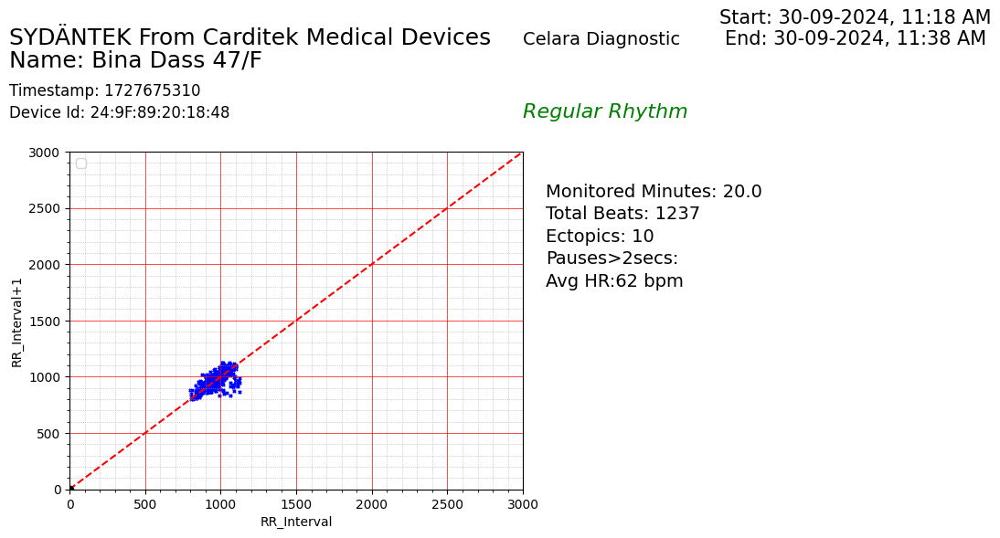

In [ ]:
def plot_scatter_plot(Holt_data, R_Peak_Detection_05, Rhythm_Check, HeartRate_parameters, MacId, Timestamp, TrialId, Name, Age, date, time, date2, time2):
    # Function to plot ectopic beats and save the scatter plot

    peak_detection, ectopics = R_Peak_Detection_05(Holt_data)
    Rhythm = Rhythm_Check(Holt_data)
    RR_new = np.abs(np.diff(peak_detection))
    average_RR_interval = np.mean(RR_new)
    HR_line = HeartRate_parameters(peak_detection, RR_new, Holt_data, Fs=1000)

    fig, ax = plt.subplots()
    if Rhythm == "Regular Rhythm":
        ax.text(3000, 3300, Rhythm, fontsize=16, color="green", fontstyle='italic')
    else:
        ax.text(3000, 3300, Rhythm, fontsize=16, color="red", fontstyle='italic')

    def remove_outliers_iqr(x, y):
        iqr_x = np.percentile(x, 100) - np.percentile(x, 10)
        iqr_y = np.percentile(y, 100) - np.percentile(y, 10)
        threshold_x = 1.5 * iqr_x
        threshold_y = 1.5 * iqr_y
        outliers = np.where((np.abs(x - np.median(x)) > threshold_x) | (np.abs(y - np.median(y)) > threshold_y))
        x_no_outliers = np.delete(x, outliers)
        y_no_outliers = np.delete(y, outliers)
        return x_no_outliers, y_no_outliers

    x_no_outliers, y_no_outliers = remove_outliers_iqr(RR_new[1:], RR_new[0:len(RR_new) - 1])

    ax.set_xlim([0, 3000])
    ax.set_ylim([0, 3000])
    ax.set_xlabel('RR_Interval')
    ax.set_ylabel('RR_Interval+1')
    # ax.text(-400, 3500, str("Avg HR:%d bpm" % (int(HR_line[0]))), fontsize=12, color="blue")
    ax.text(-400, 3500, str("Timestamp: %s" % (Timestamp)), fontsize=12, color="black")
    ax.text(-400,3300,str("Device Id: %s " % (MacId)), fontsize=12, color="black")
    ax.text(-400, 3750, str("Name: %s %s" % (Name, Age)), fontsize=18,color="black")


    text = (
    f"Start: {date}, {time}\n"
    f"End: {date2}, {time2}"
    )
    time_format = "%I:%M %p"
    time1_dt = datetime.strptime(time, time_format)
    time2_dt = datetime.strptime(time2, time_format)
    Monitored_Minutes = (time2_dt - time1_dt).total_seconds() // 60
    # Add the text to the plot
    ax.text(5200, 3950, text, horizontalalignment='center', fontsize=15)
    ax.text(-400, 3950, "SYDÄNTEK From Carditek Medical Devices", fontsize=18, color="black")
    ax.text(3000,3950,"Celara Diagnostic",fontsize=14,color="black")
    ax.text(3150,2600,str("Monitored Minutes: %s" % (Monitored_Minutes)),fontsize=14,color="black")
    ax.text(3150,2400,str("Total Beats: %s" % len(peak_detection)),fontsize=14,color="black")
    ax.text(3150,2200,str("Ectopics: %s" % len(ectopics)),fontsize=14,color="black")
    ax.text(3150,2000,"Pauses>2secs:",fontsize=14,color="black")
    ax.text(3150,1800,str("Avg HR:%d bpm" % (int(HR_line[0]))),fontsize=14,color="black")

    ax.grid(which='major', linestyle='-', linewidth='0.5', color='red')
    ax.grid(which='minor', linestyle=':', linewidth='0.5', color='darkgrey')
    ax.minorticks_on()
    marker_size = 5
    ax.scatter(x_no_outliers, y_no_outliers, color='blue', marker='x', s=marker_size)
    ax.legend()

    slope, intercept, r_value, p_value, std_err = linregress(y_no_outliers, x_no_outliers)
    regression_line = [(slope * x) + intercept for x in y_no_outliers]
    mean = np.mean([x_no_outliers, y_no_outliers], axis=0)
    diff = (x_no_outliers - y_no_outliers)
    mean_diff = np.mean(diff)
    std_diff = np.std(diff, axis=0)
    value = 1.96 * std_diff  # 1.96 is the z-value for a 95% confidence interval
    upper_limit = np.array(regression_line) + value
    lower_limit = np.array(regression_line) - value
   # Adding the 45-degree line from a specific starting point
    start_x = 0  # starting point
    start_y = 0  # starting point
    line_x = np.linspace(0, 3000, 100)
    line_y = start_y + (line_x - start_x)
    ax.plot(line_x, line_y, color='red', linestyle='--', label='45 Degree Line')
    ax.scatter([start_x], [start_y], color='black', zorder=5, label='Start Point')

plot_scatter_plot(Holt_data,R_Peak_Detection_05,Rhythm_Check,HeartRate_parameters,MacId,Timestamp,TrialId,Name,Age,date,time,date2,time2)

Filename='scatter_plot'
plt.savefig(('/content/drive/MyDrive/Carditek Report for Celara/Scatter Plots/Short_Scatter/'+date+'_'+TrialId+'_'+Name+'_'+Filename+'.pdf'), bbox_inches='tight')
# plt.savefig(('/content/drive/MyDrive/Carditek Report for Celara/Scatter Plots/Long_Scatter/Alok_Scatter/80_'+date+'_'+TrialId+'_'+Name+'_'+Filename+'.pdf'), bbox_inches='tight

# **CONSOLIDATED GRAPHS (SCATTER+BAR+PIE CHART) 30/8/2024**

<ipython-input-15-4ddc7c015bda>:117: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


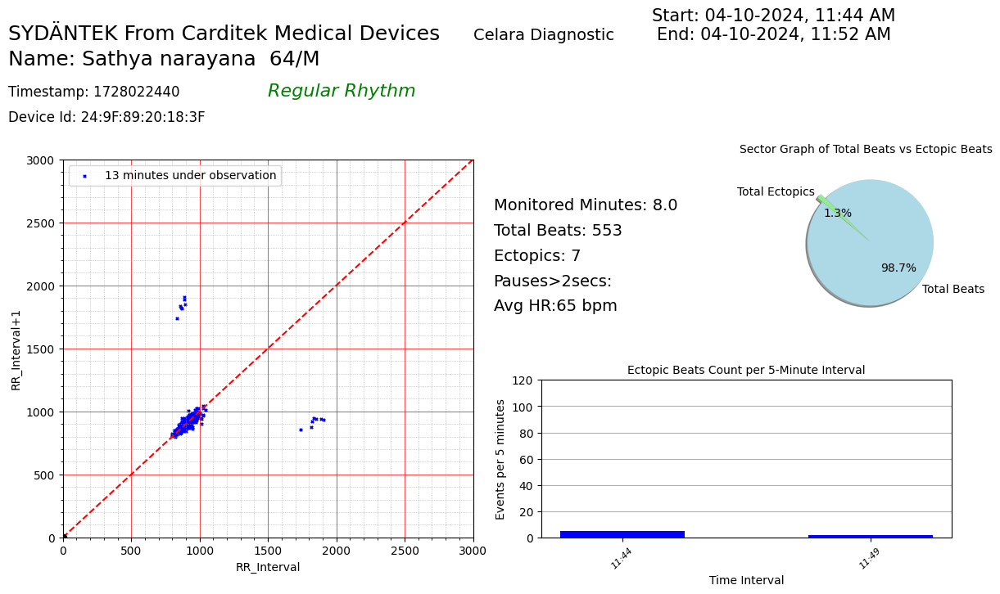

In [ ]:
def plot_scatter_plot(Holt_data, R_Peak_Detection_05, Rhythm_Check, HeartRate_parameters, MacId, Timestamp, TrialId, Name, Age, date, time, date2, time2):
    peak_detection, ectopics = R_Peak_Detection_05(Holt_data)
    Rhythm = Rhythm_Check(Holt_data)
    RR_new = np.abs(np.diff(peak_detection))
    HR_line = HeartRate_parameters(peak_detection, RR_new, Holt_data, Fs=1000)

    fig = plt.figure(figsize=(14,6))
    # fig = plt.figure(figsize=(12, 6))

    # Scatter plot (left side)
    ax1 = plt.subplot2grid((2, 4), (0, 0), rowspan=2, colspan=2)

    if Rhythm == "Regular Rhythm":
        ax1.text(1500, 3500, Rhythm, fontsize=16, color="green", fontstyle='italic')
    else:
        ax1.text(1500, 3500, Rhythm, fontsize=16, color="red", fontstyle='italic')

    def remove_outliers_iqr(x, y):
        iqr_x = np.percentile(x, 100) - np.percentile(x, 10)
        iqr_y = np.percentile(y, 100) - np.percentile(y, 10)
        threshold_x = 1.5 * iqr_x
        threshold_y = 1.5 * iqr_y
        outliers = np.where((np.abs(x - np.median(x)) > threshold_x) | (np.abs(y - np.median(y)) > threshold_y))
        x_no_outliers = np.delete(x, outliers)
        y_no_outliers = np.delete(y, outliers)
        return x_no_outliers, y_no_outliers

    x_no_outliers, y_no_outliers = remove_outliers_iqr(RR_new[1:], RR_new[0:len(RR_new) - 1])

    ax1.set_xlim([0, 3000])
    ax1.set_ylim([0, 3000])
    ax1.set_xlabel('RR_Interval')
    ax1.set_ylabel('RR_Interval+1')
    ax1.text(-400, 3500, str("Timestamp: %s" % (Timestamp)), fontsize=12, color="black")
    ax1.text(-400, 3300, str("Device Id: %s " % (MacId)), fontsize=12, color="black")
    ax1.text(-400, 3750, str("Name: %s %s" % (Name, Age)), fontsize=18, color="black")

    text = (
    f"Start: {date}, {time}\n"
    f"End: {date2}, {time2}"
    )
    time_format = "%I:%M %p"
    time1_dt = datetime.strptime(time, time_format)
    time2_dt = datetime.strptime(time2, time_format)
    Monitored_Minutes = (time2_dt - time1_dt).total_seconds() // 60
    ax1.text(5200, 3950, text, horizontalalignment='center', fontsize=15)
    ax1.text(-400, 3950, "SYDÄNTEK From Carditek Medical Devices", fontsize=18, color="black")
    ax1.text(3000, 3950, "Celara Diagnostic", fontsize=14, color="black")
    ax1.text(3150, 2600, str("Monitored Minutes: %s" % (Monitored_Minutes)), fontsize=14, color="black")
    ax1.text(3150, 2400, str("Total Beats: %s" % len(peak_detection)), fontsize=14, color="black")
    ax1.text(3150, 2200, str("Ectopics: %s" % len(ectopics)), fontsize=14, color="black")
    ax1.text(3150, 2000, "Pauses>2secs:", fontsize=14, color="black")
    ax1.text(3150, 1800, str("Avg HR:%d bpm" % (int(HR_line[0]))), fontsize=14, color="black")

    ax1.grid(which='major', linestyle='-', linewidth='0.5', color='red')
    ax1.grid(which='minor', linestyle=':', linewidth='0.5', color='darkgrey')
    ax1.minorticks_on()
    marker_size = 5
    ax1.scatter(x_no_outliers, y_no_outliers, color='blue', marker='x', s=marker_size, label='13 minutes under observation')
    ax1.legend()


    slope, intercept, r_value, p_value, std_err = linregress(y_no_outliers, x_no_outliers)
    regression_line = [(slope * x) + intercept for x in y_no_outliers]

   # Adding the 45-degree line from a specific starting point
    start_x = 0  # starting point
    start_y = 0  # starting point
    line_x = np.linspace(0, 3000, 100)
    line_y = start_y + (line_x - start_x)
    ax1.plot(line_x, line_y, color='red', linestyle='--', label='45 Degree Line')
    ax1.scatter([start_x], [start_y], color='black', zorder=5, label='Start Point')


    # Pie chart (top right)
    ax2 = plt.subplot2grid((2, 4), (0, 3))
    ax2.axis('off')  # Hide axis for pie chart
    labels = ['Total Beats', 'Total Ectopics']
    sizes = [len(RR_new), len(ectopics)]
    colors = ['lightblue', 'lightgreen']
    explode = (0.1, 0)  # "explode" the first slice

    ax2.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%',
            shadow=True, startangle=140)
    ax2.set_title('Sector Graph of Total Beats vs Ectopic Beats', fontsize=10)

    # Bar chart (bottom right)
    # ax3 = plt.subplot2grid((2, 4), (1, 3))
    ax3 = plt.subplot2grid((2, 4), (1, 2),rowspan=1,colspan=3)
    # ax3 = plt.subplot2grid((3, 3), (1, 2))
    samples_per_5min = 5 * 60 * 1000
    intervals = int(np.ceil(len(Holt_data) / samples_per_5min))
    ectopic_counts_per_interval = [0] * intervals

    for i in range(intervals):
        interval_start = i * samples_per_5min
        interval_end = min((i + 1) * samples_per_5min, len(Holt_data))
        interval_chunk = Holt_data[interval_start:interval_end]
        _, ectopic_count_in_interval = R_Peak_Detection_05(interval_chunk)
        ectopic_counts_per_interval[i] = len(ectopic_count_in_interval)

    Total_ectopics = np.sum(ectopic_counts_per_interval)
    time_intervals = [time1_dt + timedelta(minutes=5 * i) for i in range(len(ectopic_counts_per_interval))]
    time_labels = [time.strftime('%H:%M') for time in time_intervals]
    colors = ['blue' if ectopic_counts_per_interval[i] < 30 else 'red' for i in range(len(ectopic_counts_per_interval))]

    ax3.bar(range(len(ectopic_counts_per_interval)), ectopic_counts_per_interval, color=colors, width=0.50)
    ax3.set_xlabel('Time Interval')
    ax3.set_ylabel('Events per 5 minutes')
    ax3.set_title('Ectopic Beats Count per 5-Minute Interval', fontsize=10)
    ax3.set_xticks(range(len(time_labels)))
    ax3.set_xticklabels(time_labels, rotation=45, fontsize=8, fontstyle='italic')
    ax3.grid(True, axis='y')
    ax3.set_ylim([0, 120])

    # Adjust layout
    plt.tight_layout()
    plt.subplots_adjust(wspace=0.4, hspace=0.4)
    plt.show()

# Call the function with your data
plot_scatter_plot(Holt_data, R_Peak_Detection_05, Rhythm_Check, HeartRate_parameters, MacId, Timestamp, TrialId, Name, Age, date, time, date2, time2)

# **Ectopic Vs Time**

[0]
Total Ectopics: 0
1
Interval 1: 2024-09-03 15:41:45 - Ectopic beats: 0


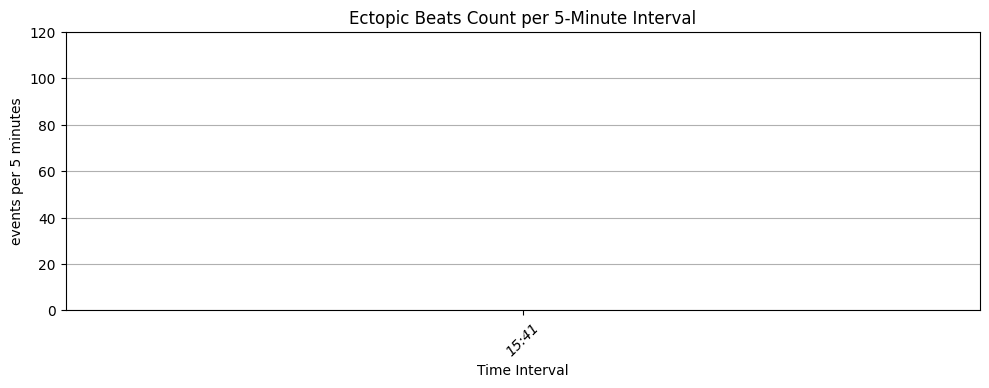

In [ ]:
from matplotlib.font_manager import FontProperties
from datetime import datetime,timedelta


Timestamp_start =Timestamp
samples_per_5min = 5 * 60 * 1000  # 5 minutes * 60 seconds/minute * 1000 samples/second
# samples_per_1min = 1 * 60 * 1000  #1 minutes * 60 seconds/minute * 1000 samples/second

# Converting the starting timestamp to  time
start_time = datetime.utcfromtimestamp(Timestamp_start) + timedelta(hours=5, minutes=30)#### Indian Time
# start_time = datetime.utcfromtimestamp(Timestamp) ### UK time


# Calculate the total number of intervals
intervals = int(np.ceil(len(Holt_data) / samples_per_5min))

# Initializing the array to have ectopic counts for each 5-minute interval
ectopic_counts_per_interval = [0] * intervals

#  Holt_data in chunks and count ectopic beats
ectopic_count = []
chunk_size = 20 * 15000

for i in range(0, len(Holt_data), chunk_size):
    start_idx = i
    end_idx = min(i + chunk_size, len(Holt_data))
    chunk = Holt_data[start_idx:end_idx]
    peak, ectopic_count_in_chunk = R_Peak_Detection_05(chunk)
    ectopic_count.extend(ectopic_count_in_chunk)

# Count ectopic beats in each 5-minute interval
for i in range(intervals):
    interval_start = i * samples_per_5min
    interval_end = min((i + 1) * samples_per_5min, len(Holt_data))
    interval_chunk = Holt_data[interval_start:interval_end]
    peak, ectopic_count_in_interval = R_Peak_Detection_05(interval_chunk)
    ectopic_counts_per_interval[i] = len(ectopic_count_in_interval)


print(ectopic_counts_per_interval)
Total_ectopics=np.sum(ectopic_counts_per_interval)
print("Total Ectopics:",Total_ectopics)
print(len(ectopic_counts_per_interval))

# printing the corresponding times for each interval
for i in range(intervals):
    interval_time = start_time + timedelta(minutes=5 * i)
    print(f"Interval {i + 1}: {interval_time} - Ectopic beats: {ectopic_counts_per_interval[i]}")

time_intervals = [start_time + timedelta(minutes=5 * i) for i in range(len(ectopic_counts_per_interval))]

# Convert time intervals in string pattern
time_labels = [time.strftime('%H:%M') for time in time_intervals]

# # Plotting the data
#### Define colors to cycle through for each 30-minute interval
color_cycle = ['blue', 'green', 'orange', 'purple', 'cyan', 'magenta', 'yellow', 'black']
colors = []

for i in range(len(ectopic_counts_per_interval)):
    # Determine the base color based on the 30-minute interval
    color_index = (i // 6) % len(color_cycle)  # 6 intervals of 5 minutes each make 30 minutes
    base_color = color_cycle[color_index]

    # If the ectopic count is 30 or more, mark it in red
    if ectopic_counts_per_interval[i] >= 30:
        colors.append('red')
    else:
        colors.append(base_color)



###Plotting the data as a bar graph
plt.figure(figsize=(10, 4))  # Smaller figure size
bar_width = 0.50 # Make bars less wide
bars = plt.bar(range(len(ectopic_counts_per_interval)), ectopic_counts_per_interval, color=colors, width=bar_width)

plt.xlabel('Time Interval')
plt.ylabel('events per 5 minutes')
plt.title('Ectopic Beats Count per 5-Minute Interval')
plt.xticks(range(len(time_labels)), time_labels, rotation=90)
plt.grid(True, axis='y')
plt.ylim([0, 120])
line_y = np.linspace(0, 70,5)
plt.tight_layout()
italic_font = FontProperties(style='italic')
plt.xticks(range(len(time_labels)), time_labels, rotation=45, fontproperties=italic_font)

# Add ectopic count on top of each bar
# for i, bar in enumerate(bars):
#     height = bar.get_height()
#     plt.text(bar.get_x() + bar.get_width() / 2.0, height + 1, f'{height}', ha='center', va='bottom')

plt.show()



# **Sectorgraph**

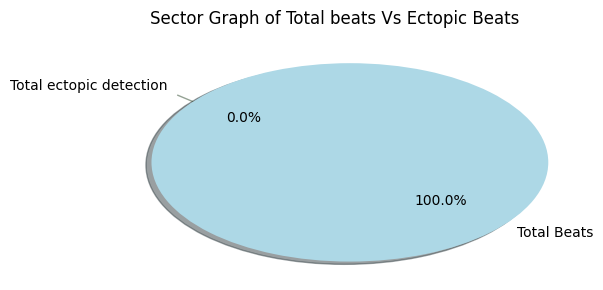

In [ ]:
labels = ['Total Beats', 'Total ectopic detection']
peak_detection, ectopics = R_Peak_Detection_05(Holt_data)
sizes = [len(peak_detection), len(ectopics)] # Sum the ectopic counts
colors = ['lightblue', 'lightgreen']  # Colors for each sector
explode = (0.1, 0)

#Create a pie chart
fig, ax = plt.subplots()
ax.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%',
       shadow=True, startangle=140)

# Set aspect ratio to create an oval shape
ax.set_aspect(aspect=0.5)

# Adding a title
plt.title('Sector Graph of Total beats Vs Ectopic Beats')

# Display the chart
plt.show()

# Report Generation Block Ver2
1. Patient Details (Name, Number, Mac, TS, Date) are automatical ready from
previous block; No Need for manual entry

2. Clinical History/Diagnosis (if required) can be typed in the dedicated variable : History

3. Lead to be plotted (As per user choice) should be mentioned (as String) in dedicated variable : read_lead

4. Line resolution of the report is controlled by : lines_per_page; Mention here how many line user wants to disply in each page

5. Noise_detection parameter is a boolean :
  *   True = noisy ECG replaced by square wave
  *   False = noisy ECG is retained in report

6. The generated reprolt is saved in the sub-folder **Holter Report** of main folder **Carditek Report for Celara**



# ** Report Testing Block Version 3 30/8/2024**


total peaks detected: 554
RR_new_interval: [ 899  893  886  904  921  894  894  909  914  891  881  899  901  877
  865  876 1818  869  845  867  890  907  899  917  940  962  964  973
  934  929  906  924  942  929  918  901  897  925  924  930  913  908
  925  949  947  908  915  936  920  904  913  922  938  929  908  888
  903  909  892  896  921  930  908  909  941  928  913  923  930  898
  905  924  911  900  904  925  931  920  941  966  958  919  909  933
  948  942  914  910  916  942 1850  893  885  877  892  915  948  936
  945  966  956  932 1909  889  902  917  909  924  951  978  963  987
 1002  972  984  979  957  986  962  943  970  947  929  951  975  943
  948  963  932  929  944  945 1835  861  835  850  874  882  900 1011
  966  962  982  971  944  941  971  925  895  885  922  926  932  909
  894  901  932  892  893  916  946  906  908  907  897  869  883  913
  931  892  900  899  894  906  931  911  912  928  913  928  963  954
  910  911  903  869  864  886  90

<Figure size 640x480 with 0 Axes>

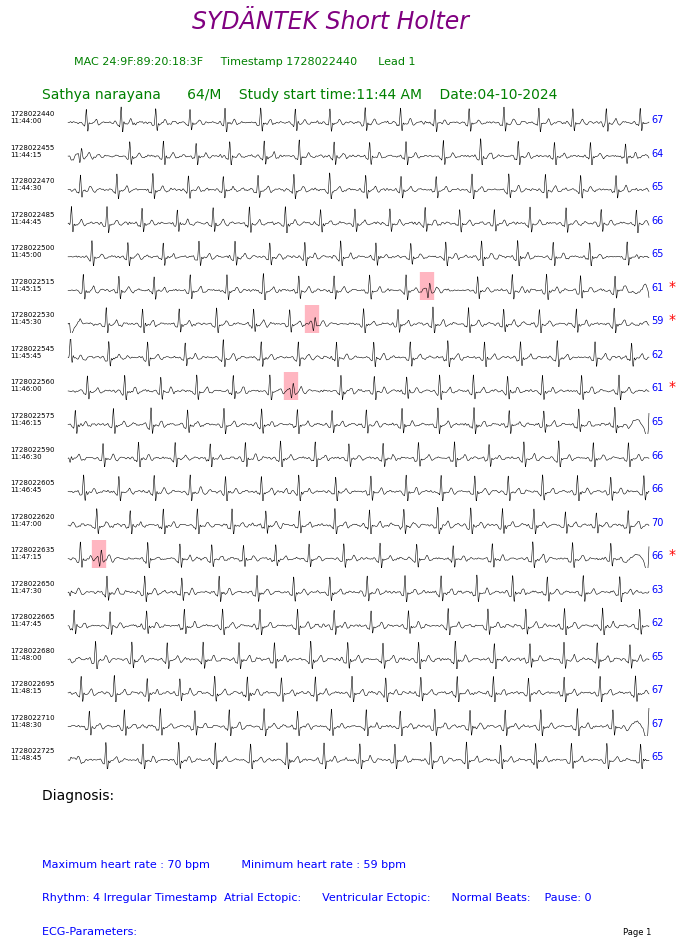

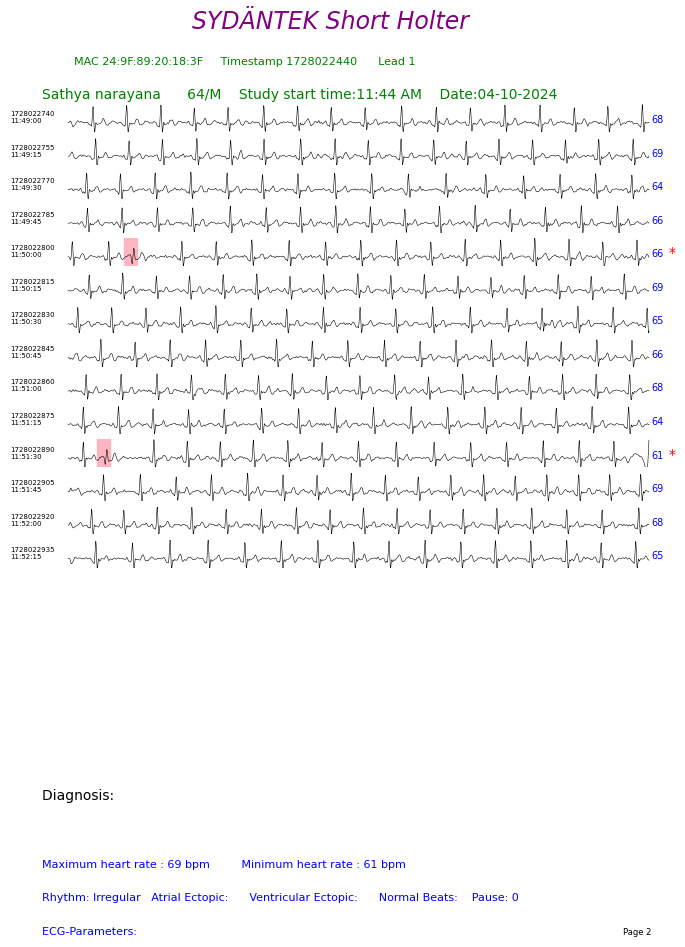

In [ ]:
trialcount = 0; Ventricularcount = 0; Tot_beat = 0;

buff = Holt_data;

def Rhythm_Check_ver2(lead_data, iteration):
  _,RR_int = RR_calculation11(lead_data)
  st_dev = np.std(RR_int); RC=0
  if (st_dev<90):
    # print("st_dev :", st_dev)
    ax[iteration].text(15500,0,'*',color='white',fontsize=10);
    RC = RC
    # return(1);# print('Regular Rhythm')
  else:
    ax[iteration].text(15500,0,'*',color='red',fontsize=10);
    RC = RC+1; #print("Iregular st_dev :", st_dev, RR_int)
    # return(0);# print('Irregular Rhythm')
  return RC

###########################################################
###########################################################           working plot
Noise_detection=False
def plotting_ver2(sig, iteration):
  # sig=data_loss(sig); # SV_len = 0; PV_len = 0; NB_len = 0
  sig, state = machine_diconnect_15sec(sig)
  # secs = len(sig)/Fs; samps = int(secs*100) ;  sig_disp = (sp.signal.resample(ecg_filters_V5_01(sig*0.000286), samps));
  if state==False:    ##no disconnect
    RC = Rhythm_Check_ver2(sig, iteration)
    # HR_line, Pause_line = HeartRate_parameters11(ecg_filters_Rpeak(sig))
    Rpeak, RR_int = RR_calculation11(ecg_filters_Rpeak(sig))
    HR_line, Pause_line = HeartRate_parameters11(Rpeak, RR_int,sig)
    # SVT_count, SVT_start, SVT_Stop = SVT_check(Rpeak, RR_int)
    HRV_line.append(HR_line[0]); MaxHR.append(HR_line[1]); MinHR.append(HR_line[2])
    # ax[iteration].plot(h,ecg_filters_V5_smooth(sig)*1,'k',linewidth=0.4);
    peak_detection,ectopic_detection=R_Peak_Detection_05(sig)
    # for i in range (len(peak_detection)):
      # ax[iteration].axvline(x = peak_detection[i], color = 'g', linestyle = '-',linewidth=1.5)

    # peak_ep=[]
    # for g in range(len(peak_detection)-1):
    #   RR_new=np.abs(np.diff(peak_detection))
    #   mode_RR_new=st.mode(RR_new)
    #   window=100
    #   threshold= mode_RR_new+window
    #   if abs(peak_detection[g]-peak_detection[g+1])>threshold:
    #     peak_ep.append(peak_detection[g])


    for i in range(0,len(ectopic_detection)):        #### comment
      ax[iteration].axvline(x = ectopic_detection[i], color = 'lightpink', linestyle = '-',linewidth=10.3)   ### comment



    ax[iteration].plot(h,ecg_filters_Smooth_holter(sig)*10000,'k',linewidth=0.4);
    # for i in range(0,len(sig)):
    #   ax[iteration].axvline(x = sig[i], color= 'r',linestyle = '-',linewidth=0.3);

    # if SVT_count!=0:
    #   for i in range(len(SVT_start)):
    #     ax[iteration].axvspan(SVT_start[i]+((iteration-2)*samples_per_line/1000)-50, SVT_Stop[i]+((iteration-2)*samples_per_line/1000)+50, alpha=0.2, color="yellow")
    # # ax[iteration].plot(sig_disp*1.5,'k',linewidth=0.4);
    if len(Pause_line[0])!=0:
      TotPause.append(Pause_line[0]);
    ax[iteration].text(15050,0,str(HR_line[0]),color='blue',fontsize=7);
  else:   ##disconnect
    ax[iteration].plot(h,sig[0:15000],'k',linewidth=0.4);
    RC = 0
  return RC


def detect_ectopic_beats(ecg_signal_peak, threshold):                                     ### comment the function
  # Calculate the difference between consecutive R-R intervals
  rr_intervals = np.diff(ecg_signal_peak)
  # print("RR int 2: ",rr_intervals)
  # Calculate the mean and standard deviation of the R-R intervals
  rr_mean = np.mean(rr_intervals); #print("Mean RR :",rr_mean)
  rr_std = np.std(rr_intervals); #print("STD RR :",rr_std, rr_std*threshold)
  ectopic_beats = []; ectopic_idx = []
  # Detect ectopic beats based on the threshold
  for i in range(0, len(rr_intervals)):
      if abs(rr_intervals[i] - rr_mean) > threshold * rr_std:
          ectopic_beats.append(ecg_signal_peak[i+1]); ectopic_idx.append(i)
  return ectopic_beats

def find_PVC(signal, Rpeaks):
  RRinterval = np.diff(Rpeaks); print(RRinterval)
  ##   LIST OF AREA UNDER THE CURVE
  AUC = collections.deque(); NB=0
  # for k in Rpeaks:
  #   ch=abs(np.round(np.trapz(signal[k-80:k+80])));AUC.append(ch)
  #   # print("median : ",ch, 1.3*st.median(AUC))
  # AUC = np.array(AUC); #print(AUC)
  ##    ECTOPIC FUNCTION
  PVC_list = np.empty_like(Rpeaks, dtype=float); PVC_list[:] = np.NaN
  # SVC_list = np.empty_like(Rpeaks, dtype=float); SVC_list[:] = np.NaN
  for i in range(1,len(RRinterval)):
    if RRinterval[i]>=(1.2*RRinterval[i-1]):
          PVC_list[i] = Rpeaks[i]

      # if Ramplitued[i]>=(Ramplitued[i-1]+(0.2*Ramplitued[i-1])):#PVC
        # if AUC[i-1]>(1.3*st.median(AUC[0:i-1])):
          # PVC_list[i] = Rpeaks[i]
    else: NB=NB+1
        # else: #SVC or PVC
        #   if i>1:
        #     if AUC[i]>(1.3*st.mode(AUC[0:i-1])):
        #       PVC_list[i] = Rpeaks[i]
  return (np.array(PVC_list), NB)



# buff1 = fetch_lead(read_lead);buff2 = np.concatenate((buff,buff1))


buff = collections.deque(Data_addidtion(buff, lines_per_page))
ect_buff =  np.array(buff)

page=0; line=[]; linecount=lines_per_page;
HRV_line =[]; TotPause =[]; MaxHR = []; MinHR = [];
HRV_plot = [];
RhythmCount = 0
countlen=len(buff); samples_per_line = 15000*Timestamp_per_line
# _,time = get_time_from_timestamp(Timestamp)
HolterTitle = 'SYDÄNTEK Short Holter'; plot_header=("%s     %s    Study start time:%s    Date:%s"%(Name,Age,str(time),Date.at[0,'Date']))
plot_header_technical=("MAC %s     Timestamp %d      Lead %s"%(MacId,Timestamp,read_lead))

filtered = Holt_data # ectopic_filters(ect_buff)
# peaks,rpeak = sp.signal.find_peaks(filtered,distance = 400,height=(max(filtered[1000:5000])/2)); print('Total peaks detected : ',len(peaks))
# com_width = round(Fs//(8)); start_p = peaks[1]-com_width; end_p = peaks[1]+com_width
# template = filtered[start_p:end_p]
SV=[]; PV=[]; NB=[]
# SV, PV,  NB = find_ectopic(filtered, template)  ### comment if needed
# PV = detect_ectopic_beats(peaks, 1.5)           ##### comment
# PV, NB = find_PVC(filtered,peaks)           ##### comment

Rpeak, Ectopics = R_Peak_Detection_05(buff)
print("total peaks detected:",len(Rpeak))
RR_new_interval=np.abs(np.diff(Rpeak))
print("RR_new_interval:",RR_new_interval)
mode_RR_new=st.mode(RR_new_interval);print("mode_RR_new:",mode_RR_new)
rr_interval=[];rr_comp=[];
for v in range(len(RR_new_interval)-1):
  if RR_new_interval[v]>=(1.9*mode_RR_new):
    rr_interval.append(RR_new_interval[v])
    rr_comp.append(v)



while countlen!=0:
  plt.figure(page); fig, ax = plt.subplots(linecount+7,figsize=(8.27,11.69));
  # plt.figure(page); fig, ax = plt.subplots(linecount+3,figsize=(8.27,11.69));
  ax[0].set_title(HolterTitle,color='purple', fontstyle='italic',fontsize=17); ax[0].text(0.1,0,plot_header_technical,fontsize=8, color='green')
  ax[0].set_yticklabels([]); ax[0].set_xticklabels([]); ax[0].axis('off')
  ax[1].text(0.05,0,plot_header,fontsize=10, color='green'); ax[1].set_yticklabels([]); ax[1].set_xticklabels([]); ax[1].axis('off')

  page_det = ("Page %d"%(page+1));
  Atrialcount = 0; Ventricularcount = 0; Tot_beat = 0;
  PV_len = 0; SV_len = 0
  for j in range(2,linecount+2):
    for i in range(samples_per_line):
      line.append(buff.popleft())
      countlen = countlen-1
    line=np.array(line); h = np.arange(0,len(line))
    if max(line[0:samples_per_line])!=2000:
      index = j-2+(lines_per_page*page)
      # TS_print = str(Date.at[index,'All_Timestamp']) +"\n"+ str(Date.at[index,'All_Time'])
      TS_print = str(TS.at[index,'All_Timestamp']) +"\n"+ str(Date.at[index,'All_Time'])
      # TS_print = str(TS.at[index,'All_Timestamp']) +"\n"+ str(Date.at[index,'All_Time']+"\n Noise Coeff "+str(Noise_estimation(line)))
      ax[j].text(-1500,0,str(TS_print),fontsize=5)
      # ax[j].text(-1700,0,str(TS.at[index,'All_Timestamp']),fontsize=5)
      if Noise_detection==True:
        if Noise_estimation(line)>=1: ##if sample is clean
          RhythmCount = RhythmCount + plotting_ver2(line, j);
          for n in SV:
            if n>=((j-2)*samples_per_line)+(300000*page) and n<= (j*samples_per_line)+(300000*page):
              # ax[j].axvspan(n-((j-2)*samples_per_line)-(300000*page)-150, n-((j-2)*samples_per_line)-(300000*page)+150, alpha=0.2, color="green")     ##### comment
              # ax[j].text(15500,0,'*',color='red',fontsize=10);             ##### comment
              Atrialcount = Atrialcount+1
              if math.isnan(n)==False: SV_len = SV_len+1
          for n in PV:
            if n>=((j-2)*samples_per_line)+(300000*page) and n<= (j*samples_per_line)+(300000*page):
              # ax[j].axvspan(n-((j-2)*samples_per_line)-(300000*page)-150, n-((j-2)*samples_per_line)-(300000*page)+150, alpha=0.2, color="green")   ##### comment
              ax[j].text(15500,0,'*',color='red',fontsize=10);       ##### comment
              Ventricularcount = Ventricularcount+1
              if math.isnan(n)==False: PV_len = PV_len+1
        else: ## if sample is noisy
          l = 30; t = np.linspace(0, 1, samples_per_line, endpoint = True);
          line = deque(sp.signal.square(2*np.pi*l*t)*2); ax[j].plot(h,line,'k',linewidth=0.4);
      else:
        RhythmCount = RhythmCount + plotting_ver2(line, j);
        if Noise_estimation(line)>=2:
          for n in SV:
            if n>=((j-2)*samples_per_line)+(300000*page) and n<= (j*samples_per_line)+(300000*page):
              # ax[j].axvspan(n-((j-2)*samples_per_line)-(300000*page)-150, n-((j-2)*samples_per_line)-(300000*page)+150, alpha=0.2, color="green")    ### comment
              ax[j].text(15500,0,'*',color='red',fontsize=10);    ### comment
              Atrialcount = Atrialcount+1
              if math.isnan(n)==False: SV_len = SV_len+1
          for n in PV:
            if n>=((j-2)*samples_per_line)+(300000*page) and n<= (j*samples_per_line)+(300000*page):
              # ax[j].axvspan(n-((j-2)*samples_per_line)-(300000*page)-150, n-((j-2)*samples_per_line)-(300000*page)+150, alpha=0.2, color="green")      #### commennt
              ax[j].text(15500,0,'*',color='red',fontsize=10);     ### comment
              Ventricularcount = Ventricularcount+1
              if math.isnan(n)==False: PV_len = PV_len+1
    else:   ##end of ecg blank plot
      ax[j].plot(0);
    line=deque(line)
    ax[j].set_yticklabels([]); ax[j].set_xticklabels([]); ax[j].set_ylim(-4,8); ax[j].set_xlim(-1500,15050); ax[j].axis('off')
    k = j+1; line.clear()


  # print('Atrial Ectopic :%d         Ventricular Ectopic :%d   Normal Beats:%d'%(Atrialcount,Ventricularcount,NB))
  if RhythmCount>0 and RhythmCount<=5: rhy = str(RhythmCount)+' Irregular Timestamp';
  elif RhythmCount>5: rhy = 'Irregular ';
  else: rhy = 'Regular '
    # Initialize MAX and MIN with default values
  # MAX = "N/A"
  # MIN = "N/A"
  if len(HRV_line)>=2: MAX = str(max(HRV_line)); MIN = str(min(HRV_line));
  # Ectopic_det = ('Rhythm : %s      Atrial Ectopic : %d       Ventricular Ectopic : %d' %(rhy, Atrialcount))            #### comment
  Ectopic_det = ('Rhythm: %s  Atrial Ectopic:      Ventricular Ectopic:      Normal Beats:    Pause: %d'%(rhy,len(TotPause)))   ### comment
  ax[k].text(0.05,0.1,"Diagnosis: ", horizontalalignment='left',ma='right',fontsize=10,color='black');ax[k].set_yticklabels([]);ax[k].set_xticklabels([]);ax[k].axis('off')
  # ax[k+1].text(0.05,0.1,"Irregular rhythm; Suggestive of Atrial Fibrillation", horizontalalignment='left',ma='right',fontsize=8,color='black')   ## comment when needed
  ax[k+1].set_yticklabels([]);ax[k+1].set_xticklabels([]);ax[k+1].axis('off')
  ax[k+2].text(0.05,0.1,("Maximum heart rate : %s bpm         Minimum heart rate : %s bpm"%(MAX,MIN)), horizontalalignment='left',ma='left',fontsize=8,color='blue');ax[k+2].set_yticklabels([]);ax[k+2].set_xticklabels([]);ax[k+2].axis('off')
  ax[k+3].text(0.05,0.1,Ectopic_det, horizontalalignment='left',ma='left',fontsize=8,color='blue');ax[k+3].set_yticklabels([]);ax[k+3].set_xticklabels([]);ax[k+3].axis('off')
  ax[k+4].text(0.05,0.1,"ECG-Parameters: ", horizontalalignment='left',ma='left',fontsize=8,color='blue');ax[k+4].set_yticklabels([]);ax[k+4].set_xticklabels([]);ax[k+4].axis('off')
  # ax[k+4].text(0.05,0.1," ", horizontalalignment='left',ma='left',fontsize=8,color='blue');ax[k+4].set_yticklabels([]);ax[k+4].set_xticklabels([]);ax[k+4].axis('off')   ###comment when needed
  ax[k+4].text(1,0.1,page_det, horizontalalignment='right',ma='right',fontsize=6,color='black');#ax[k+5].set_yticklabels([]);ax[k+5].set_xticklabels([]);ax[k+5].axis('off')             #### comment
  HRV_line.clear() ; TotPause.clear() ; MaxHR.clear(); MinHR.clear; EctopicCount_page=0
  page+=1;

  ## creating and storing PDF
  pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Carditek Report for Celara/Holter Report/"+Name+" "+Date.at[0,'Date']+"2_holterV3_ectV1.pdf")

  # pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Carditek_Report_for_Celara/Holter Report/"+time+" "+Date.at[0,'Date']+"Name+"_holterV3_ectV1.pdf")
  # pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Carditek_Report_for_Celara/Holter Report/24Hours/CKH0784 DR RAMYA 04-03-2023/10_"+Name+" "+Date.at[0,'Date']+"_holterV3.pdf")
  # pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Carditek Report for Celara/Holter Report/Long Holter/Alok Long Holter/99_"+Name+" "+Date.at[0,'Date']+"_holterV3.pdf")
   # pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Carditek_Report_for_Celara/Holter Report/Testing/"+Name+".pdf")
  # pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Holter Report/Testing/"+Date.at[0,'Date']+"_"+Name+".pdf")
  for fig in range(1, plt.gcf().number + 1):
    plt.figure(fig).set_size_inches(8.27, 11.69)  # Adjust these values as needed
    pdf.savefig( fig, bbox_inches='tight',pad_inches=0.0 )

  pdf.close()



#### To save it in Document#####
#   file_path = "/content/drive/MyDrive/Carditek Report for Celara/Holter Report/"
#   file_name = f"{Name} {Date.at[0,'Date']}_holterV3_ectV1.docx"
#   docx_path = os.path.join(file_path, file_name)

#   # Create a new document
#   doc = Document()

# # Iterate over each figure
#   for fig_num in range(1, plt.gcf().number + 1):
#       # Create a canvas to render the figure
#       canvas = FigureCanvas(plt.figure(fig_num))
#       # Save the figure as an image temporarily
#       temp_img_path = f"temp_fig_{fig_num}.png"
#       canvas.print_figure(temp_img_path, bbox_inches='tight', pad_inches=0.0)
#       # Insert the image into the document
#       doc.add_picture(temp_img_path)


#   # Save the document
#   doc.save(docx_path)


# **Long Scatter concatenated in different colour**

In [ ]:
RR_1st=RR_new;
print(len(RR_1st))
# RR_2nd=RR_new;
# print(len(RR_2nd))
# RR_3rd=RR_new
# print(len(RR_3rd))
# RR_4th=RR_new
# print(len(RR_4th))
# RR_5th=RR_new
# print(len(RR_5th))
# RR_6th=RR_new
# print(len(RR_6th))

x_no_outliers1, y_no_outliers1 = remove_outliers_iqr(RR_1st[1:], RR_1st[0:len(RR_1st) - 1])
# x_no_outliers2, y_no_outliers2 = remove_outliers_iqr(RR_2nd[1:], RR_2nd[0:len(RR_2nd) - 1])
# x_no_outliers3, y_no_outliers3 = remove_outliers_iqr(RR_3rd[1:], RR_3rd[0:len(RR_3rd) - 1])
# x_no_outliers4, y_no_outliers4 = remove_outliers_iqr(RR_4th[1:], RR_4th[0:len(RR_4th) - 1])
# x_no_outliers5, y_no_outliers5 = remove_outliers_iqr(RR_5th[1:], RR_5th[0:len(RR_5th) - 1])
# x_no_outliers6, y_no_outliers6 = remove_outliers_iqr(RR_6th[1:], RR_6th[0:len(RR_6th) - 1])
plt.xlim([0, 3000])
plt.ylim([0, 3000])
plt.xlabel('RR_Interval')
plt.ylabel('RR_Interval+1')
# title_scatter=[Name,Timestamp,MacId]
# plt.title(title_scatter,fontsize=20)
plt.grid(which='major', linestyle='-', linewidth='0.5', color='red')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='darkgrey')
plt.minorticks_on()
marker_size = 0.5
plt.scatter(x_no_outliers1, y_no_outliers1, color='purple', marker='x', s=marker_size,label=' 2 hours 40 minutes under observation')
# plt.scatter(x_no_outliers2, y_no_outliers2, color='grey', marker='x', s=marker_size,label='2 hours 40 minutes under observation')
# plt.scatter(x_no_outliers3, y_no_outliers3, color='grey', marker='x', s=marker_size,label='2 hours under observation')
# plt.scatter(x_no_outliers4, y_no_outliers4, color='grey', marker='x', s=marker_size,label='next 1 hour under observation')
# plt.scatter(x_no_outliers5, y_no_outliers5, color='grey', marker='x', s=marker_size,label='next 1 hour under observation')
# plt.scatter(x_no_outliers6, y_no_outliers6, color='purple', marker='x', s=marker_size,label='next 2 hours under observation')
plt.legend()
if Rhythm =="Regular Rhythm":
 plt.text(-400,3200, Rhythm,fontsize=20,color="green",fontstyle='italic')
 if int (HR_line[0]) <100:
   print("Heart Rate:", "Normal Rhythm");plt.text(1800,3200, "Normal Rhythm",fontsize=20, fontstyle='italic',color="green")
 if  int (HR_line[0])  >100 and  int (HR_line[0])  <150:
   print("Heart Rate:", "Sinus Tachycardia");plt.text(1800,3200, "Sinus Tachycardia",fontsize=20, fontstyle='italic',color="orange")
 if int (HR_line[0]) >160:
   print("Heart Rate:", "Supraventricular Tachycardia");plt.text(1800,3200, "Supraventricular Tachycardia",fontsize=20, fontstyle='italic',color="red")
else:
 plt.text(-400,3200, Rhythm,fontsize=20,color="red",fontstyle='italic')
plt.text(-400,3800,str("HR:%d bpm"%(int (HR_line[0]))),fontsize=20,color="blue");
plt.text(800,3800,str("Max HR:%d bpm"%(int (HR_line[1]))),fontsize=20,color="blue"); plt.text(2800,3800,str("Min HR:%d bpm"%(int(HR_line[2]))),fontsize=20,color="blue")
plt.text(1800,3400,str("MacId: %s "%(MacId)),fontsize=16,color="purple")
plt.text(-400,3400,str("Timestamp: %s"%(Timestamp)),fontsize=16,color="purple")
plt.text(-400,4130,str("Id: %s"%(TrialId)),fontsize=20)
plt.text(1800,4130,str("Name: %s %s"%(Name,Age)),fontsize=20,color="black")
plt.text(1200,4590, "Celara Diagnostic",fontsize=20, fontstyle='italic')
plt.text(400,5050, "SYDÄNTEK Scatter Plot",fontsize=30, fontstyle='italic',color="orange")
start_x = 0  # Example starting point
start_y = 0  # Example starting point
line_x = np.linspace(0, 3000, 100)
line_y = start_y + (line_x - start_x)
# plt.legend()
plt.plot(line_x, line_y, color='red', linestyle='--', label='45 Degree Line')
plt.scatter([start_x], [start_y], color='black', zorder=5, label='Start Point')
Save=True
# Save_path='/content/drive/MyDrive/Carditek Report for Celara/Scatter Plots/Long_Scatter/Alok_Scatter/_july_1st'
Save_path='/content/drive/MyDrive/Carditek Report for Celara/Scatter Plots/Short_Scatter/_Mrs_Poddar_July_19'
# Filename=Name+'_scatter_plot'
# if Save==True:
#   plt.savefig ((Save_path+Filename+'.pdf'), bbox_inches='tight')

# ***Scatter Plot***

Total Peak Detection: 1183
[902 909 890 ... 464 680 718]


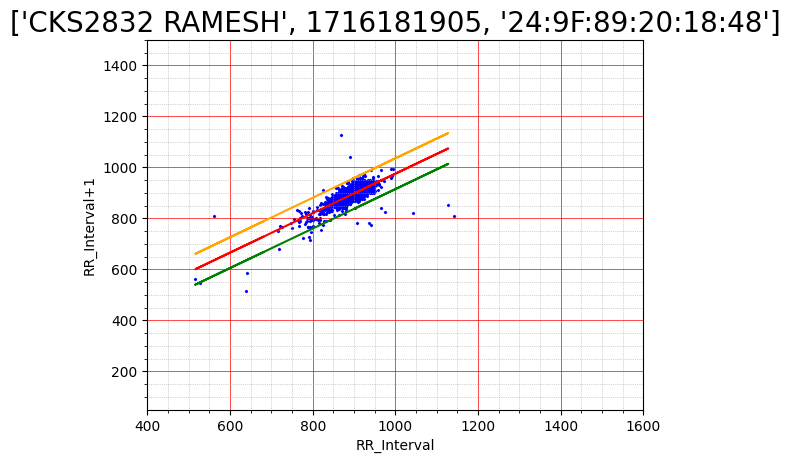

In [ ]:
buff=fetch_lead('3');
peak_detection=R_Peak_Detection_03(buff)
print("Total Peak Detection:", len(peak_detection))
RR_new=np.abs(np.diff(peak_detection))
RR_new_1=np.abs(np.diff(peak_detection))
print(RR_new)

title_scatter=[Name,Timestamp,MacId]
def remove_outliers_iqr(x, y):
    # Calculate the interquartile range (IQR) for x and y
    iqr_x = np.percentile(x, 100) - np.percentile(x, 25)
    iqr_y = np.percentile(y, 100) - np.percentile(y, 25)

    # Set the threshold as 1.5 times the IQR
    threshold_x = 1.5 * iqr_x
    threshold_y = 1.5 * iqr_y

    # Identify outliers based on the threshold
    outliers = np.where((np.abs(x - np.median(x)) > threshold_x) | (np.abs(y - np.median(y)) > threshold_y))

    # Remove outliers
    x_no_outliers = np.delete(x, outliers)
    y_no_outliers = np.delete(y, outliers)

    return x_no_outliers, y_no_outliers

x_no_outliers, y_no_outliers = remove_outliers_iqr(RR_new[1:],RR_new[0:len(RR_new)-1] )
plt.xlim([400,1600])
plt.ylim([50,1500])
# plt.autoscale(enable=True, axis='y')
plt.xlabel('RR_Interval')
plt.ylabel('RR_Interval+1')
plt.title(title_scatter,fontsize=20)
plt.grid(which='major', linestyle='-', linewidth='0.5', color='red')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='darkgrey')
plt.minorticks_on()
marker_size=2
plt.scatter(x_no_outliers,y_no_outliers,color='blue',marker='x',s=marker_size)
slope, intercept, r_value, p_value, std_err = linregress(y_no_outliers,x_no_outliers)
regression_line = [(slope * x) + intercept for x in y_no_outliers ]
mean = np.mean([x_no_outliers,y_no_outliers], axis=0)
diff = (x_no_outliers - y_no_outliers)
mean_diff = np.mean(diff)
std_diff = np.std(diff, axis=0)
value = 1.96 * std_diff # 1.96 is the z-value for a 95% confidence interval
upper_limit = regression_line + value
lower_limit = regression_line - value
plt.plot(y_no_outliers, regression_line, color='red')
plt.plot( y_no_outliers, upper_limit, color='orange')
plt.plot( y_no_outliers, lower_limit, color='green')
Save=True
Save_path='/content/drive/MyDrive/Carditek Report for Celara/Scatter Plots/'
Filename=Name+'_scatter_plot'
if Save==True:
  plt.savefig ((Save_path+Filename+'.pdf'), bbox_inches='tight')

Total Peak Detection: 392
[ 757  754  749  751  750  753  765  759  760  760  769  770  759  750
  745  755  758  756  758  768  774  770  765  753  759  765  764  764
  757  754  758  751  768  778  791  786  775  759  741  733  730  731
  740  743  745  743  729  733  731  730  732  724  713  728  737  760
  759  772  774  768  502 1046  755  738  733  732  739  742  755  766
  774  766  751  751  746  760  751  754  745  739  739  729  748  749
  740  743  749  744  742  727  718  726  737  729  732  734  734  727
  734  754  750  764  757  763  760  754  748  741  751  764  770  504
 1027  744  724  719  723  727  741  747  751  737  743  745  756  766
  768  763  767  771  775  765  756  747  746  748  757  762  762  740
  714  720  734  747  752  746  744  759  765  763  756  747  746  760
  762  768  771  774  779  769  763  759  765  760  767  784  783  783
  775  755  747  744  743  740  747  746  748  765  780  779  498 1044
  766  758  761  758  750  750  738  735  736  746 

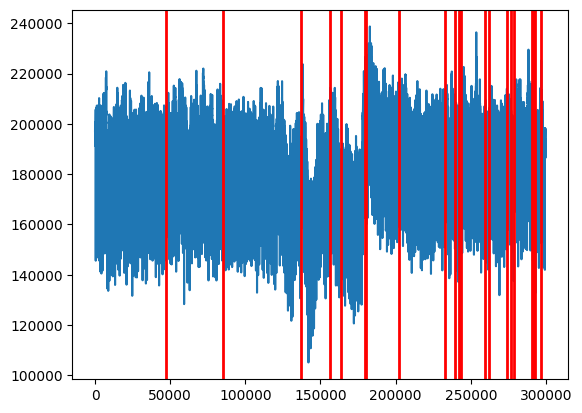

In [ ]:
# import statistics
# from scipy.stats import linregress
# import itertools
## R peak detection: Filters the input ECG lead data to enhance R-peaks for detection ##
def R_Peak_Detection_03(raw_data):
  peaks_up = []; amp = [];
  b = signal.firwin(1377, cutoff = [1/500], window = "hamming", pass_zero=False); a = 1
  h, g = signal.butter(4, [45/500] , btype='low', analog=False)
  filt_BW = signal.filtfilt(b, a, raw_data); data_F = signal.lfilter(h, g, filt_BW)
  data_D = np.diff(data_F); data_S = data_D*data_D
  peaks,rpeak = signal.find_peaks(data_S,distance = 400,height=(max(data_S[1000:5000])/4));n = len(peaks);

  for i in range(0,n):
    win=50;
    if (peaks[i]-(win))<0: start_win = 0
    else: start_win = (peaks[i]-(win))
    seg = data_F[start_win:(peaks[i])+(win)]; seg = seg*seg;
    max_peak,peak_amp = signal.find_peaks(seg, distance = 10, height = (max(seg)/2))
    if len(max_peak)<2 and max_peak.size!=0:          ##########Check y its equal to 0 in some patients
      peaks_u = start_win + max_peak[0];
    else: peaks_u = start_win + np.argmax(seg)
    peaks_up.append(peaks_u);
  peaks_up = peaks_up[1:len(peaks_up)-2]
  return peaks_up
# def lead data:
read_lead = '3'
buff=fetch_lead('3');
peak_detection=R_Peak_Detection_03(buff)
print("Total Peak Detection:", len(peak_detection))
RR_new=np.abs(np.diff(peak_detection))
print(RR_new)
peak_ep=[]
for g in range(len(peak_detection)-1):

  threshold=800
  if abs(peak_detection[g]-peak_detection[g+1])>threshold:
    peak_ep.append(peak_detection[g])

print(peak_ep)

print(len(RR_new))
print(len(peak_ep))
plt.plot(buff)
# plt.plot(peak_ep,buff[peak_ep],'ro')
# ax[k+3].text(0.05,0.1,peak_ep, horizontalalignment='left',ma='left',fontsize=8,color='blue');ax[k+3].set_yticklabels([]);ax[k+3].set_xticklabels([]);ax[k+3].axis('off')
for i in range(len(peak_ep)):
  plt.axvline(x=peak_ep[i], linewidth=2,color='r')

# **With respiratory rate**
ECg filter-> rpeaks-> normal/ PVC/ ectopics -> HR parameter -> eliminate PVC and do Respiratory rate

NameError: name 'TS' is not defined

<Figure size 640x480 with 0 Axes>

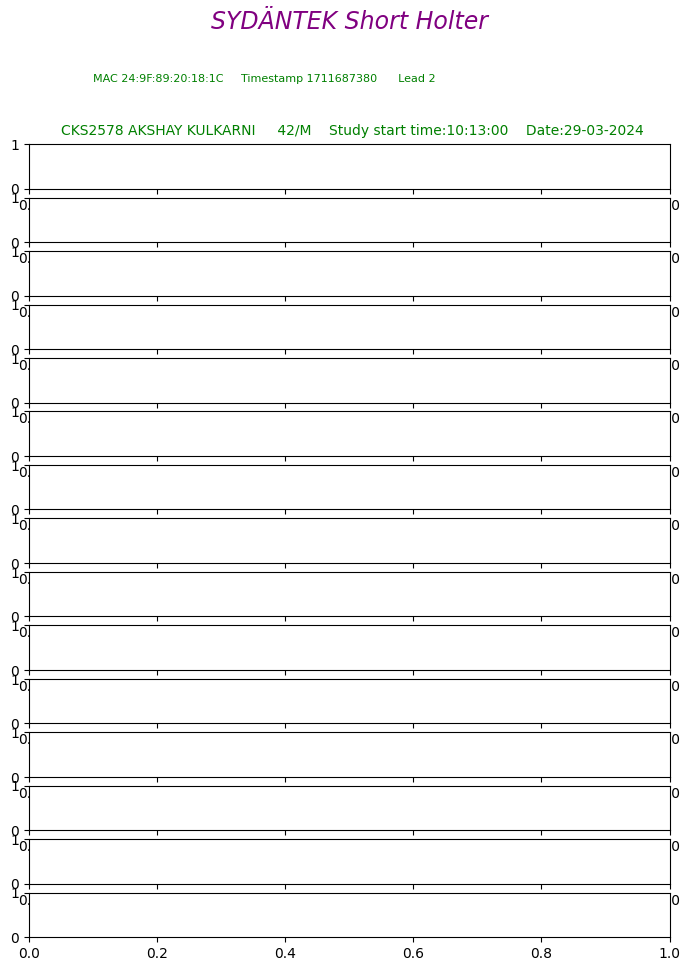

In [ ]:
import condat_tv
def ecg_filters_V5_smooth(lead_data):  #### According to IEC 60601-2-25 (BW, 50, 100 and LP) with smoothing
  ##### Baseline filter without ST Segment distortion
  b = signal.firwin(2377, cutoff = [0.67/500], window = "hamming", pass_zero=False); a = 1
  #### Powerline noise and its harmonics removal
  Fs = 1000; F0 = 50; F1 = F0*2; r = 1 -((3.14*2)/1000); W0 = (2*3.14*F0)/Fs; W1 = (2*3.14*F1)/Fs
  d0 = 1; d1 = -2*(np.cos(W0)); d2 = 1; c2 = 1; c1 = -2*r*(np.cos(W0)); c0 = r * r; d = [d2, d1, d0]; c = [c2, c1, c0]
  f0 = 1; f1 = -2*(np.cos(W1)); f2 = 1; e2 = 1; e1 = -2*r*(np.cos(W1)); e0 = r * r; f = [f2, f1, f0]; e = [e2, e1, e0]
  #### 150Hz Low pass filter
  h, g = signal.butter(2, [145/500] , btype='low', analog=False);  j, i = signal.butter(2, [15/500] , btype='low', analog=False)
  filt_BW = signal.filtfilt(b, a, lead_data); filt_SM = (signal.lfilter(j, i, filt_BW));  filt_LP = (signal.lfilter(h, g, filt_BW))
  sparse = filt_LP - filt_SM;
  denoise = condat_tv.tv_denoise(sparse,6.5)
  smooth_data = filt_SM+denoise
  return smooth_data

def R_Peak_Detection(data):
  peaks_up = []; amp = [];
  data_F = ecg_filters_V5_01(data); data_D = np.diff(data_F); data_S = data_D*data_D
  peaks,rpeak = signal.find_peaks(data_S,distance = 400,height=(max(data_S[1000:5000])/4));n = len(peaks);
  for i in range(0,n):
    win=70;
    if (peaks[i]-(win))<0: start_win = 0
    else: start_win = (peaks[i]-(win))
    seg = data_F[start_win:(peaks[i])+(win)]; seg2 = seg*seg;
    max_peak,peak_amp = signal.find_peaks(seg2, distance = 10, height = (max(seg2)/2))
    peaks_u = start_win + max_peak[0]
    peaks_up.append(peaks_u);
  return peaks_up

def plotting_ver3(sig, iteration): ##respiratory+ECG
  sig, state = machine_diconnect_15sec(sig)
  if state==False:    ##no disconnect
    # HR_line, Pause_line = HeartRate_parameters11(ecg_filters_Rpeak(sig))
    Rpeak, RR_int = RR_calculation11(ecg_filters_Rpeak(sig))
    HR_line, Pause_line = HeartRate_parameters11(Rpeak, RR_int,sig)
    HRV_line.append(HR_line[0]); MaxHR.append(HR_line[1]); MinHR.append(HR_line[2])
    PVC = find_PVC()
    ax[iteration].plot(h,ecg_filters_Smooth_holter(sig)*1,'k',linewidth=0.4);
    ax[iteration].text(15050,0,str(HR_line[0]),color='blue',fontsize=7);
  else:   ##disconnect
    ax[iteration].plot(h,sig,'k',linewidth=0.4);
  return


# def Report_generation(Lead, Patient, MacId, Date, TS,HIS, Timestamp_per_line=1,lines_per_page=60, Noise_detection=True):
lines_per_page=10
Noise_detection=False
Timestamp_per_line=2
read_lead = '2'
buff=fetch_lead(read_lead);


buff = collections.deque(Data_addidtion(buff, lines_per_page))
ect_buff =  np.array(buff)

page=0; line=[]; linecount=lines_per_page;
HRV_line =[]; TotPause =[]; MaxHR = []; MinHR = [];
countlen=len(buff); samples_per_line = 15000*Timestamp_per_line
_,time = get_time_from_timestamp(Timestamp)
HolterTitle = 'SYDÄNTEK Short Holter'; plot_header=("%s     %s    Study start time:%s    Date:%s"%(Name,Age,str(time),Date.at[0,'Date']))
plot_header_technical=("MAC %s     Timestamp %d      Lead %s"%(MacId,Timestamp,read_lead))

def find_PVC(signal, Rpeaks, Ramplitued, RRinterval):
  ##   LIST OF AREA UNDER THE CURVE
  AUC = collections.deque()
  for k in Rpeaks:
    AUC.append(np.trapz(signal[k-100:k+100]))
  AUC = np.array(AUC); print(AUC)
  ##    ECTOPIC FUNCTION
  PVC_list = np.empty_like(Rpeaks, dtype=float); PVC_list[:] = np.NaN
  SVC_list = np.empty_like(Rpeaks, dtype=float); SVC_list[:] = np.NaN
  for i in range(1,len(RRinterval)):
    if RRinterval[i]>=(1.5*RRinterval[i-1]):
      if Ramplitued[i]>=(Ramplitued[i-1]+(0.2*Ramplitued[i-1])):#PVC
        if AUC[i]>(1.3*st.median(AUC[0:i-1])):
          PVC_list[i] = peaks[i]
      else: #SVC or PVC
        if i>1:
          if AUC[i]>(1.3*st.median(AUC[0:i-1])):
            PVC_list[i] = peaks[i]
  return PVC_list


while countlen!=0:
  plt.figure(page); fig, ax = plt.subplots(linecount+7,figsize=(8.27,11.69));
  ax[0].set_title(HolterTitle,color='purple', fontstyle='italic',fontsize=17); ax[0].text(0.1,0,plot_header_technical,fontsize=8, color='green')
  ax[0].set_yticklabels([]); ax[0].set_xticklabels([]); ax[0].axis('off')
  ax[1].text(0.05,0,plot_header,fontsize=10, color='green'); ax[1].set_yticklabels([]); ax[1].set_xticklabels([]); ax[1].axis('off')

  page_det = ("Page %d"%(page+1));
  Atrialcount = 0; Ventricularcount = 0; Tot_beat = 0;
  PV_len = 0; SV_len = 0
  for j in range(2,linecount+2):
    for i in range(samples_per_line):
      line.append(buff.popleft())
      countlen = countlen-1
    line=np.array(line); h = np.arange(0,len(line))
    if max(line[0:samples_per_line])!=2000:
      index = j-2+(lines_per_page*page)
      TS_print = str(TS.at[index,'All_Timestamp']) +"\n"+ str(Date.at[index,'All_Time'])
      ax[j].text(-1500,0,str(TS_print),fontsize=5)
      # ax[j].text(-1700,0,str(TS.at[index,'All_Timestamp']),fontsize=5)
      if Noise_detection==True:
        if Noise_estimation(line)>=2: ##if sample is clean
          RhythmCount = RhythmCount + plotting_ver2(line, j);
          for n in SV:
            if n>=((j-2)*samples_per_line)+(300000*page) and n<= (j*samples_per_line)+(300000*page):
              # ax[j].axvspan(n-((j-2)*samples_per_line)-(300000*page)-150, n-((j-2)*samples_per_line)-(300000*page)+150, alpha=0.2, color="green")
              # ax[j].text(15500,0,'*',color='red',fontsize=10);
              Atrialcount = Atrialcount+1
              if math.isnan(n)==False: SV_len = SV_len+1
          for n in PV:
            if n>=((j-2)*samples_per_line)+(300000*page) and n<= (j*samples_per_line)+(300000*page):
              # ax[j].axvspan(n-((j-2)*samples_per_line)-(300000*page)-150, n-((j-2)*samples_per_line)-(300000*page)+150, alpha=0.2, color="green")
              # ax[j].text(15500,0,'*',color='red',fontsize=10);
              Ventricularcount = Ventricularcount+1
              if math.isnan(n)==False: PV_len = PV_len+1
        else: ## if sample is noisy
          l = 30; t = np.linspace(0, 1, samples_per_line, endpoint = True);
          line = deque(sp.signal.square(2*np.pi*l*t)*2); ax[j].plot(h,line,'k',linewidth=0.4);
      else:
        RhythmCount = RhythmCount + plotting_ver2(line, j);
        if Noise_estimation(line)>=2:
          for n in SV:
            if n>=((j-2)*samples_per_line)+(300000*page) and n<= (j*samples_per_line)+(300000*page):
              # ax[j].axvspan(n-((j-2)*samples_per_line)-(300000*page)-150, n-((j-2)*samples_per_line)-(300000*page)+150, alpha=0.2, color="green")
              # ax[j].text(15500,0,'*',color='red',fontsize=10);
              Atrialcount = Atrialcount+1
              if math.isnan(n)==False: SV_len = SV_len+1
          for n in PV:
            if n>=((j-2)*samples_per_line)+(300000*page) and n<= (j*samples_per_line)+(300000*page):
              # ax[j].axvspan(n-((j-2)*samples_per_line)-(300000*page)-150, n-((j-2)*samples_per_line)-(300000*page)+150, alpha=0.2, color="green")
              # ax[j].text(15500,0,'*',color='red',fontsize=10);
              Ventricularcount = Ventricularcount+1
              if math.isnan(n)==False: PV_len = PV_len+1
    else:   ##end of ecg blank plot
      ax[j].plot(0);
    line=deque(line)
    ax[j].set_yticklabels([]); ax[j].set_xticklabels([]); ax[j].set_ylim(-4,8); ax[j].set_xlim(-1500,15050); ax[j].axis('off')
    k = j+1; line.clear()


  print('Atrial Ectopic :%d         Ventricular Ectopic :%d'%(Atrialcount,Ventricularcount))
  if RhythmCount>0 and RhythmCount<=5: rhy = str(RhythmCount)+' Irregular Timestamp';
  elif RhythmCount>5: rhy = 'Irregular ';
  else: rhy = 'Regular '
  if len(HRV_line)>=2: MAX = str(max(HRV_line)); MIN = str(min(HRV_line))
  # Ectopic_det = ('Rhythm : %s      Atrial Ectopic : %d       Ventricular Ectopic : %d' %(rhy, Atrialcount))
  Ectopic_det = ('Rhythm: %s    Atrial Ectopic:      Ventricular Ectopic:      Pause: %d'%(rhy,len(TotPause)))
  ax[k].text(0.05,0.1,"Diagnosis: ", horizontalalignment='left',ma='right',fontsize=10,color='black');ax[k].set_yticklabels([]);ax[k].set_xticklabels([]);ax[k].axis('off')
  # ax[k+1].text(0.05,0.1,"Irregular rhythm; Suggestive of Atrial Fibrillation", horizontalalignment='left',ma='right',fontsize=8,color='black')
  ax[k+1].set_yticklabels([]);ax[k+1].set_xticklabels([]);ax[k+1].axis('off')
  ax[k+2].text(0.05,0.1,("Maximum heart rate : %s bpm         Minimum heart rate : %s bpm"%(MAX,MIN)), horizontalalignment='left',ma='left',fontsize=8,color='blue');ax[k+2].set_yticklabels([]);ax[k+2].set_xticklabels([]);ax[k+2].axis('off')
  ax[k+3].text(0.05,0.1,Ectopic_det, horizontalalignment='left',ma='left',fontsize=8,color='blue');ax[k+3].set_yticklabels([]);ax[k+3].set_xticklabels([]);ax[k+3].axis('off')
  ax[k+4].text(0.05,0.1,"ECG-Parameters: ", horizontalalignment='left',ma='left',fontsize=8,color='blue');ax[k+4].set_yticklabels([]);ax[k+4].set_xticklabels([]);ax[k+4].axis('off')
  # ax[k+4].text(0.05,0.1," ", horizontalalignment='left',ma='left',fontsize=8,color='blue');ax[k+4].set_yticklabels([]);ax[k+4].set_xticklabels([]);ax[k+4].axis('off')
  ax[k+4].text(1,0.1,page_det, horizontalalignment='right',ma='right',fontsize=6,color='black');#ax[k+5].set_yticklabels([]);ax[k+5].set_xticklabels([]);ax[k+5].axis('off')
  HRV_line.clear() ; TotPause.clear() ; MaxHR.clear(); MinHR.clear; EctopicCount_page=0
  page+=1;

  ### creating and storing PDF
  pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Carditek Report for Celara/Holter Report/"+Name+" "+Date.at[0,'Date']+"_holterV3.pdf")
  # pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Carditek Report for Celara/Holter Report/24Hours/CKH0784 DR RAMYA 04-03-2023/10_"+Name+" "+Date.at[0,'Date']+"_holterV3.pdf")
  # pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Carditek Report for Celara/Holter Report/Long Holter/6_"+Name+" "+Date.at[0,'Date']+"_holterV3.pdf")
  # pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Carditek Report for Celara/Holter Report/Testing/"+Name+".pdf")
  # # pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Holter Report/Testing/"+Date.at[0,'Date']+"_"+Name+".pdf")
  for fig in range(1, plt.gcf().number + 1): pdf.savefig( fig, bbox_inches='tight',pad_inches=0.0 )
  pdf.close()


# **With Pacemaker Marking**

In [ ]:
def ecg_filters_V5_smooth(lead_data):  #### According to IEC 60601-2-25 (BW, 50, 100 and LP) with smoothing
  for x in  range(1,len(lead_data),1):
      if (lead_data[x] == 0):
       lead_data[x] = lead_data[x-1]

 ##### Baseline filter without ST Segment distortion
  b = signal.firwin(2377, cutoff = [0.67/500], window = "hamming", pass_zero=False); a = 1
  #b = signal.firwin(1735, cutoff = [0.67/500], window = "hamming", pass_zero=False); a = 1
 ##### Powerline noise and its harmonics removal
  Fs = 1000; F0 = 50; F1 = F0*2; r = 1 -((3.14*2)/1000); W0 = (2*3.14*F0)/Fs; W1 = (2*3.14*F1)/Fs
  d0 = 1; d1 = -2*(np.cos(W0)); d2 = 1; c2 = 1; c1 = -2*r*(np.cos(W0)); c0 = r * r; d = [d2, d1, d0]; c = [c2, c1, c0]
  f0 = 1; f1 = -2*(np.cos(W1)); f2 = 1; e2 = 1; e1 = -2*r*(np.cos(W1)); e0 = r * r; f = [f2, f1, f0]; e = [e2, e1, e0]
 ##### 150Hz Low pass filter
  h, g = signal.butter(1, [40/500] , btype='low', analog=False)
  j, i = signal.butter(1, [7/500] , btype='low', analog=False)

  filt_BW = signal.filtfilt(b, a, lead_data); filt_SM = (signal.lfilter(j, i, filt_BW))*0.000286;
  filt_LP = (signal.lfilter(h, g, filt_BW))*0.000286

  sparse = filt_LP - filt_SM;
  denoise = condat_tv.tv_denoise(sparse,7.65)
  smooth_data = filt_SM+denoise

  return smooth_data


def Rhythm_Check_ver2(lead_data, iteration):
  _,RR_int = RR_calculation11(lead_data)
  st_dev = np.std(RR_int); RC=0
  if (st_dev<130):
    # print("st_dev :", st_dev)
    ax[iteration].text(15500,0,'*',color='white',fontsize=10);
    RC = RC
    # return(1);# print('Regular Rhythm')
  else:
    ax[iteration].text(15500,0,'*',color='red',fontsize=10);
    RC = RC+1; #print("Iregular st_dev :", st_dev, RR_int)
    # return(0);# print('Irregular Rhythm')
  return RC

def pace_pulse_loc(sig):
  sos = signal.butter(4, 100, 'hp', fs=1000, output='sos')
  HP = signal.sosfilt(sos,sig); mark = max(HP[1000:14500])
  peaks,rpeak = signal.find_peaks(HP,distance = 200,height= (mark/2))
  if mark > 4000:
    return peaks
  else:
    return []

def plotting_ver2(sig, iteration):
  # sig=data_loss(sig); # SV_len = 0; PV_len = 0; NB_len = 0
  sig, state = machine_diconnect_15sec(sig)
  # secs = len(sig)/Fs; samps = int(secs*100) ;  sig_disp = (sp.signal.resample(ecg_filters_V5_01(sig*0.000286), samps));
  if state==False:    ##no disconnect
    RC = Rhythm_Check_ver2(sig, iteration)
    # HR_line, Pause_line = HeartRate_parameters11(ecg_filters_Rpeak(sig))
    Rpeak, RR_int = RR_calculation11(ecg_filters_Rpeak(sig))
    HR_line, Pause_line = HeartRate_parameters11(Rpeak, RR_int,sig)
    # SVT_count, SVT_start, SVT_Stop = SVT_check(Rpeak, RR_int)
    HRV_line.append(HR_line[0]); MaxHR.append(HR_line[1]); MinHR.append(HR_line[2])
    # ax[iteration].plot(h,ecg_filters_Smooth_holter(sig)*1.5,'k',linewidth=0.4);
    ax[iteration].plot(h,ecg_filters_V5_smooth(sig)*0.8,'k',linewidth=0.4);
    pace_loc = pace_pulse_loc(sig)
    for i in range(0,len(pace_loc)):
      ax[iteration].axvline(x = pace_loc[i], color = 'blue', linestyle = '-',linewidth=0.3)
    # if SVT_count!=0:51
    #   for i in range(len(SVT_start)):
    #     ax[iteration].axvspan(SVT_start[i]+((iteration-2)*samples_per_line/1000)-50, SVT_Stop[i]+((iteration-2)*samples_per_line/1000)+50, alpha=0.2, color="yellow")
    # # ax[iteration].plot(sig_disp*1.5,'k',linewidth=0.4);
    if len(Pause_line[0])!=0:
      TotPause.append(Pause_line[0]);
    ax[iteration].text(15050,0,str(HR_line[0]),color='blue',fontsize=7);
  else:   ##disconnect
    ax[iteration].plot(h,sig,'k',linewidth=0.4);
    RC = 0
  return RC


# def Report_generation(Lead, Patient, MacId, Date, TS,HIS, Timestamp_per_line=1,lines_per_page=60, Noise_detection=True):
lines_per_page=20
Noise_detection=False
Timestamp_per_line=1
# read_lead = 'v5'
buff=fetch_lead(read_lead);


buff = collections.deque(Data_addidtion(buff, lines_per_page))
ect_buff =  np.array(buff)

page=0; line=[]; linecount=lines_per_page;
HRV_line =[]; TotPause =[]; MaxHR = []; MinHR = [];
RhythmCount = 0
countlen=len(buff); samples_per_line = 15000*Timestamp_per_line
_,time = get_time_from_timestamp(Timestamp)
HolterTitle = 'SYDÄNTEK Short Holter'; plot_header=("%s     %s    Study start time:%s    Date:%s"%(Name,Age,str(time),Date.at[0,'Date']))
plot_header_technical=("MAC %s     Timestamp %d      Lead %s"%(MacId,Timestamp,read_lead))

filtered = ectopic_filters(ect_buff)
peaks,rpeak = sp.signal.find_peaks(filtered,distance = 400,height=(max(filtered[1000:5000])/2))
com_width = round(Fs//(8)); start_p = peaks[1]-com_width; end_p = peaks[1]+com_width
template = filtered[start_p:end_p]
SV=[]; PV=[]; NB=[]
SV, PV, NB = find_ectopic(filtered, template)

while countlen!=0:
  plt.figure(page); fig, ax = plt.subplots(linecount+7,figsize=(8.27,11.69));
  ax[0].set_title(HolterTitle,color='purple', fontstyle='italic',fontsize=17); ax[0].text(0.1,0,plot_header_technical,fontsize=8, color='green')
  ax[0].set_yticklabels([]); ax[0].set_xticklabels([]); ax[0].axis('off')
  ax[1].text(0.05,0,plot_header,fontsize=10, color='green'); ax[1].set_yticklabels([]); ax[1].set_xticklabels([]); ax[1].axis('off')

  page_det = ("Page %d"%(page+1));
  Atrialcount = 0; Ventricularcount = 0; Tot_beat = 0;
  PV_len = 0; SV_len = 0
  for j in range(2,linecount+2):
    for i in range(samples_per_line):
      line.append(buff.popleft())
      countlen = countlen-1
    line=np.array(line); h = np.arange(0,len(line))
    if max(line[0:samples_per_line])!=2000:
      index = j-2+(20*page)
      #TS_print = str(TS.at[index,'All_Timestamp']) +"\n"+ str(Date.at[index,'All_Time'])
      #ax[j].text(-1500,0,str(TS_print),fontsize=5)
      # ax[j].text(-1700,0,str(TS.at[index,'All_Timestamp']),fontsize=5)
      if Noise_detection==True:
        if Noise_estimation(line)>=2: ##if sample is clean
          RhythmCount = RhythmCount + plotting_ver2(line, j);
          for n in SV:
            if n>=((j-2)*samples_per_line)+(300000*page) and n<= (j*samples_per_line)+(300000*page):
              # ax[j].axvspan(n-((j-2)*samples_per_line)-(300000*page)-150, n-((j-2)*samples_per_line)-(300000*page)+150, alpha=0.2, color="green")
              # ax[j].text(15500,0,'*',color='red',fontsize=10);
              Atrialcount = Atrialcount+1
              if math.isnan(n)==False: SV_len = SV_len+1
          for n in PV:
            if n>=((j-2)*samples_per_line)+(300000*page) and n<= (j*samples_per_line)+(300000*page):
              # ax[j].axvspan(n-((j-2)*samples_per_line)-(300000*page)-150, n-((j-2)*samples_per_line)-(300000*page)+150, alpha=0.2, color="green")
              # ax[j].text(15500,0,'*',color='red',fontsize=10);
              Ventricularcount = Ventricularcount+1
              if math.isnan(n)==False: PV_len = PV_len+1
        else: ## if sample is noisy
          l = 30; t = np.linspace(0, 1, samples_per_line, endpoint = True);
          line = deque(sp.signal.square(2*np.pi*l*t)*2); ax[j].plot(h,line,'k',linewidth=0.4);
      else:
        RhythmCount = RhythmCount + plotting_ver2(line, j);
        if Noise_estimation(line)>=2:
          for n in SV:
            if n>=((j-2)*samples_per_line)+(300000*page) and n<= (j*samples_per_line)+(300000*page):
              # ax[j].axvspan(n-((j-2)*samples_per_line)-(300000*page)-150, n-((j-2)*samples_per_line)-(300000*page)+150, alpha=0.2, color="green")
              # ax[j].text(15500,0,'*',color='red',fontsize=10);
              Atrialcount = Atrialcount+1
              if math.isnan(n)==False: SV_len = SV_len+1
          for n in PV:
            if n>=((j-2)*samples_per_line)+(300000*page) and n<= (j*samples_per_line)+(300000*page):
              # ax[j].axvspan(n-((j-2)*samples_per_line)-(300000*page)-150, n-((j-2)*samples_per_line)-(300000*page)+150, alpha=0.2, color="green")
              # ax[j].text(15500,0,'*',color='red',fontsize=10);
              Ventricularcount = Ventricularcount+1
              if math.isnan(n)==False: PV_len = PV_len+1
    else:   ##end of ecg blank plot
      ax[j].plot(0);
    line=deque(line)
    ax[j].set_yticklabels([]); ax[j].set_xticklabels([]); ax[j].set_ylim(-4,8); ax[j].set_xlim(-1500,15050); ax[j].axis('off')
    k = j+1; line.clear()


  print('Atrial Ectopic :%d         Ventricular Ectopic :%d'%(Atrialcount,Ventricularcount))
  if RhythmCount>0 and RhythmCount<=5: rhy = str(RhythmCount)+' Irregular Timestamp';
  elif RhythmCount>5: rhy = 'Irregular ';
  else: rhy = 'Regular '
  if len(HRV_line)>=2: MAX = str(max(HRV_line)); MIN = str(min(HRV_line))
  # Ectopic_det = ('Rhythm : %s      Atrial Ectopic : %d       Ventricular Ectopic : %d' %(rhy, Atrialcount))
  Ectopic_det = ('Rhythm: %s    Atrial Ectopic:      Ventricular Ectopic:      Pause: %d'%(rhy,len(TotPause)))
  ax[k].text(0.05,0.1,"Diagnosis: ", horizontalalignment='left',ma='right',fontsize=10,color='black');ax[k].set_yticklabels([]);ax[k].set_xticklabels([]);ax[k].axis('off')
  # ax[k+1].text(0.05,0.1,"Irregular rhythm; Suggestive of Atrial Fibrillation", horizontalalignment='left',ma='right',fontsize=8,color='black')
  ax[k+1].set_yticklabels([]);ax[k+1].set_xticklabels([]);ax[k+1].axis('off')
  ax[k+2].text(0.05,0.1,("Maximum heart rate : %s bpm         Minimum heart rate : %s bpm"%(MAX,MIN)), horizontalalignment='left',ma='left',fontsize=8,color='blue');ax[k+2].set_yticklabels([]);ax[k+2].set_xticklabels([]);ax[k+2].axis('off')
  ax[k+3].text(0.05,0.1,Ectopic_det, horizontalalignment='left',ma='left',fontsize=8,color='blue');ax[k+3].set_yticklabels([]);ax[k+3].set_xticklabels([]);ax[k+3].axis('off')
  ax[k+4].text(0.05,0.1,"ECG-Parameters: ", horizontalalignment='left',ma='left',fontsize=8,color='blue');ax[k+4].set_yticklabels([]);ax[k+4].set_xticklabels([]);ax[k+4].axis('off')
  # ax[k+4].text(0.05,0.1," ", horizontalalignment='left',ma='left',fontsize=8,color='blue');ax[k+4].set_yticklabels([]);ax[k+4].set_xticklabels([]);ax[k+4].axis('off')
  ax[k+4].text(1,0.1,page_det, horizontalalignment='right',ma='right',fontsize=6,color='black');#ax[k+5].set_yticklabels([]);ax[k+5].set_xticklabels([]);ax[k+5].axis('off')
  HRV_line.clear() ; TotPause.clear() ; MaxHR.clear(); MinHR.clear; EctopicCount_page=0
  page+=1;

  ### creating and storing PDF
  pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Carditek Report for Celara/Holter Report/"+Name+" "+Date.at[0,'Date']+"pacemaker_holterV3.pdf")
  # pdf=matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Carditek Report for Celara/Holter Report/"+)
  # pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Carditek Report for Celara/Holter Report/"+Name+" "+Date.at[0,'Date']+"_holterV3.pdf")
  # pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Carditek Report for Celara/Holter Report/Long Holter/1 "+Name+" "+Date.at[0,'Date']+"pacemaker_holterV3.pdf")
  # pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Carditek Report for Celara/Holter Report/24Hours/CKH0755 DR. MUHAMMED MAJEED/10_"+Name+"_"+Date.at[0,'Date']+"_holterV3.pdf")
  # pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Carditek Report for Celara/Holter Report/Testing/"+Name+".pdf")
  # # pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Holter Report/Testing/"+Date.at[0,'Date']+"_"+Name+".pdf")
  for fig in range(1, plt.gcf().number + 1): pdf.savefig( fig, bbox_inches='tight',pad_inches=0.0 )
  pdf.close()


ValueError: too many values to unpack (expected 2)

# **With QRS duration**

In [ ]:

def Rhythm_Check_ver2(lead_data, iteration):
  _,RR_int = RR_calculation11(lead_data)
  st_dev = np.std(RR_int); RC=0
  if (st_dev<130):
    # print("st_dev :", st_dev)
    ax[iteration].text(15500,0,'*',color='white',fontsize=10);
    RC = RC
    # return(1);# print('Regular Rhythm')
  else:
    ax[iteration].text(15500,0,'*',color='red',fontsize=10);
    RC = RC+1; #print("Iregular st_dev :", st_dev, RR_int)
    # return(0);# print('Irregular Rhythm')
  return RC


def plotting_ver3(sig, iteration):
  # sig=data_loss(sig); # SV_len = 0; PV_len = 0; NB_len = 0
  sig, state = machine_diconnect_15sec(sig)
  # secs = len(sig)/Fs; samps = int(secs*100) ;  sig_disp = (sp.signal.resample(ecg_filters_V5_01(sig*0.000286), samps));
  if state==False:    ##no disconnect
    RC = Rhythm_Check_ver2(sig, iteration)
    Rpeak, RR_int = RR_calculation11(ecg_filters_Rpeak(sig))
    HR_line, Pause_line = HeartRate_parameters11(Rpeak, RR_int,sig)
    HRV_line.append(HR_line[0]); MaxHR.append(HR_line[1]); MinHR.append(HR_line[2])
    # ax[iteration].plot(h,ecg_filters_V5_smooth(sig)*1,'k',linewidth=0.4);
    ax[iteration].plot(h,ecg_filters_Smooth_holter(sig)*1,'k',linewidth=0.4);
    if len(Pause_line[0])!=0:
      TotPause.append(Pause_line[0]);
    ax[iteration].text(15050,0,str(HR_line[0]),color='blue',fontsize=7);
  else:   ##disconnect
    ax[iteration].plot(h,sig[0:15000],'k',linewidth=0.4);
    RC = 0
  return RC


# def Report_generation(Lead, Patient, MacId, Date, TS,HIS, Timestamp_per_line=1,lines_per_page=60, Noise_detection=True):
lines_per_page=20
Noise_detection=False
Timestamp_per_line=1
read_lead = '2'
buff=fetch_lead(read_lead);


buff = collections.deque(Data_addidtion(buff, lines_per_page))
ect_buff =  np.array(buff)

page=0; line=[]; linecount=lines_per_page;
HRV_line =[]; TotPause =[]; MaxHR = []; MinHR = [];
RhythmCount = 0
countlen=len(buff); samples_per_line = 15000*Timestamp_per_line
_,time = get_time_from_timestamp(Timestamp)
HolterTitle = 'SYDÄNTEK Short Holter'; plot_header=("%s     %s    Study start time:%s    Date:%s"%(Name,Age,str(time),Date.at[0,'Date']))
plot_header_technical=("MAC %s     Timestamp %d      Lead %s"%(MacId,Timestamp,read_lead))

filtered = ectopic_filters(ect_buff)
peaks,rpeak = sp.signal.find_peaks(filtered,distance = 400,height=(max(filtered[1000:5000])/2))
com_width = round(Fs//(8)); start_p = peaks[1]-com_width; end_p = peaks[1]+com_width
template = filtered[start_p:end_p]
SV=[]; PV=[]; NB=[]
SV, PV, NB = find_ectopic(filtered, template)

while countlen!=0:
  plt.figure(page); fig, ax = plt.subplots(linecount+7,figsize=(8.27,11.69));
  # plt.figure(page); fig, ax = plt.subplots(linecount+3,figsize=(8.27,11.69));
  ax[0].set_title(HolterTitle,color='purple', fontstyle='italic',fontsize=17); ax[0].text(0.1,0,plot_header_technical,fontsize=8, color='green')
  ax[0].set_yticklabels([]); ax[0].set_xticklabels([]); ax[0].axis('off')
  ax[1].text(0.05,0,plot_header,fontsize=10, color='green'); ax[1].set_yticklabels([]); ax[1].set_xticklabels([]); ax[1].axis('off')

  page_det = ("Page %d"%(page+1));
  Atrialcount = 0; Ventricularcount = 0; Tot_beat = 0;
  PV_len = 0; SV_len = 0
  for j in range(2,linecount+2):
    for i in range(samples_per_line):
      line.append(buff.popleft())
      countlen = countlen-1
    line=np.array(line); h = np.arange(0,len(line))
    if max(line[0:samples_per_line])!=2000:
      index = j-2+(lines_per_page*page)
      TS_print = str(TS.at[index,'All_Timestamp']) +"\n"+ str(Date.at[index,'All_Time'])
      # TS_print = str(TS.at[index,'All_Timestamp']) +"\n"+ str(Date.at[index,'All_Time']+"\n Noise Coeff "+str(Noise_estimation(line)))
      ax[j].text(-1500,0,str(TS_print),fontsize=5)
      # ax[j].text(-1700,0,str(TS.at[index,'All_Timestamp']),fontsize=5)
      if Noise_detection==True:
        if Noise_estimation(line)>=2: ##if sample is clean
          RhythmCount = RhythmCount + plotting_ver2(line, j);
          for n in SV:
            if n>=((j-2)*samples_per_line)+(300000*page) and n<= (j*samples_per_line)+(300000*page):
              # ax[j].axvspan(n-((j-2)*samples_per_line)-(300000*page)-150, n-((j-2)*samples_per_line)-(300000*page)+150, alpha=0.2, color="green")
              # ax[j].text(15500,0,'*',color='red',fontsize=10);
              Atrialcount = Atrialcount+1
              if math.isnan(n)==False: SV_len = SV_len+1
          for n in PV:
            if n>=((j-2)*samples_per_line)+(300000*page) and n<= (j*samples_per_line)+(300000*page):
              # ax[j].axvspan(n-((j-2)*samples_per_line)-(300000*page)-150, n-((j-2)*samples_per_line)-(300000*page)+150, alpha=0.2, color="green")
              # ax[j].text(15500,0,'*',color='red',fontsize=10);
              Ventricularcount = Ventricularcount+1
              if math.isnan(n)==False: PV_len = PV_len+1
        else: ## if sample is noisy
          l = 30; t = np.linspace(0, 1, samples_per_line, endpoint = True);
          line = deque(sp.signal.square(2*np.pi*l*t)*2); ax[j].plot(h,line,'k',linewidth=0.4);
      else:
        RhythmCount = RhythmCount + plotting_ver2(line, j);
        if Noise_estimation(line)>=2:
          for n in SV:
            if n>=((j-2)*samples_per_line)+(300000*page) and n<= (j*samples_per_line)+(300000*page):
              # ax[j].axvspan(n-((j-2)*samples_per_line)-(300000*page)-150, n-((j-2)*samples_per_line)-(300000*page)+150, alpha=0.2, color="green")
              # ax[j].text(15500,0,'*',color='red',fontsize=10);
              Atrialcount = Atrialcount+1
              if math.isnan(n)==False: SV_len = SV_len+1
          for n in PV:
            if n>=((j-2)*samples_per_line)+(300000*page) and n<= (j*samples_per_line)+(300000*page):
              # ax[j].axvspan(n-((j-2)*samples_per_line)-(300000*page)-150, n-((j-2)*samples_per_line)-(300000*page)+150, alpha=0.2, color="green")
              # ax[j].text(15500,0,'*',color='red',fontsize=10);
              Ventricularcount = Ventricularcount+1
              if math.isnan(n)==False: PV_len = PV_len+1
    else:   ##end of ecg blank plot
      ax[j].plot(0);
    line=deque(line)
    ax[j].set_yticklabels([]); ax[j].set_xticklabels([]); ax[j].set_ylim(-4,8); ax[j].set_xlim(-1500,15050); ax[j].axis('off')
    k = j+1; line.clear()


  print('Atrial Ectopic :%d         Ventricular Ectopic :%d'%(Atrialcount,Ventricularcount))
  if RhythmCount>0 and RhythmCount<=5: rhy = str(RhythmCount)+' Irregular Timestamp';
  elif RhythmCount>5: rhy = 'Irregular ';
  else: rhy = 'Regular '
  if len(HRV_line)>=2: MAX = str(max(HRV_line)); MIN = str(min(HRV_line))
  # Ectopic_det = ('Rhythm : %s      Atrial Ectopic : %d       Ventricular Ectopic : %d' %(rhy, Atrialcount))
  Ectopic_det = ('Rhythm: %s    Atrial Ectopic:      Ventricular Ectopic:      Pause: %d'%(rhy,len(TotPause)))
  ax[k].text(0.05,0.1,"Diagnosis: ", horizontalalignment='left',ma='right',fontsize=10,color='black');ax[k].set_yticklabels([]);ax[k].set_xticklabels([]);ax[k].axis('off')
  # ax[k+1].text(0.05,0.1,"Irregular rhythm; Suggestive of Atrial Fibrillation", horizontalalignment='left',ma='right',fontsize=8,color='black')
  ax[k+1].set_yticklabels([]);ax[k+1].set_xticklabels([]);ax[k+1].axis('off')
  ax[k+2].text(0.05,0.1,("Maximum heart rate : %s bpm         Minimum heart rate : %s bpm"%(MAX,MIN)), horizontalalignment='left',ma='left',fontsize=8,color='blue');ax[k+2].set_yticklabels([]);ax[k+2].set_xticklabels([]);ax[k+2].axis('off')
  ax[k+3].text(0.05,0.1,Ectopic_det, horizontalalignment='left',ma='left',fontsize=8,color='blue');ax[k+3].set_yticklabels([]);ax[k+3].set_xticklabels([]);ax[k+3].axis('off')
  ax[k+4].text(0.05,0.1,"ECG-Parameters: ", horizontalalignment='left',ma='left',fontsize=8,color='blue');ax[k+4].set_yticklabels([]);ax[k+4].set_xticklabels([]);ax[k+4].axis('off')
  # ax[k+4].text(0.05,0.1," ", horizontalalignment='left',ma='left',fontsize=8,color='blue');ax[k+4].set_yticklabels([]);ax[k+4].set_xticklabels([]);ax[k+4].axis('off')
  ax[k+4].text(1,0.1,page_det, horizontalalignment='right',ma='right',fontsize=6,color='black');#ax[k+5].set_yticklabels([]);ax[k+5].set_xticklabels([]);ax[k+5].axis('off')
  HRV_line.clear() ; TotPause.clear() ; MaxHR.clear(); MinHR.clear; EctopicCount_page=0
  page+=1;

  ## creating and storing PDF
  # pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Carditek Report for Celara/Holter Report/2 "+Name+" "+Date.at[0,'Date']+"_holterV3.pdf")
  # pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Carditek Report for Celara/Holter Report/24Hours/CKH0784 DR RAMYA 04-03-2023/10_"+Name+" "+Date.at[0,'Date']+"_holterV3.pdf")
  # pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Carditek Report for Celara/Holter Report/Long Holter/1 "+Name+" "+Date.at[0,'Date']+"_holterV3.pdf")
  pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Carditek Report for Celara/Holter Report/Testing/"+Name+".pdf")
  # # pdf = matplotlib.backends.backend_pdf.PdfPages("/content/drive/MyDrive/Holter Report/Testing/"+Date.at[0,'Date']+"_"+Name+".pdf")
  for fig in range(1, plt.gcf().number + 1): pdf.savefig( fig, bbox_inches='tight',pad_inches=0.0 )
  pdf.close()
